## summary

* 2.5d segmentation
    *  segmentation_models_pytorch 
    *  Unet
* use only 6 slices in the middle
* slide inference

In [1]:

from sklearn.metrics import roc_auc_score, accuracy_score, f1_score, log_loss
import pickle
from torch.utils.data import DataLoader
from torch.cuda.amp import autocast, GradScaler
import warnings
import sys
import pandas as pd
import os
import gc
import sys
import math
import time
import random
import shutil
from pathlib import Path
from contextlib import contextmanager
from collections import defaultdict, Counter
import cv2

import scipy as sp
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from functools import partial

import argparse
import importlib
import torch
import torch.nn as nn
from torch.optim import Adam, SGD, AdamW

import torch
import torch.nn as nn
import torch.nn.functional as F
from functools import partial


import datetime

In [2]:
# sys.path.append('/kaggle/input/pretrainedmodels/pretrainedmodels-0.7.4')
# sys.path.append('/kaggle/input/efficientnet-pytorch/EfficientNet-PyTorch-master')
# sys.path.append('/kaggle/input/timm-pytorch-image-models/pytorch-image-models-master')
# sys.path.append('/kaggle/input/segmentation-models-pytorch/segmentation_models.pytorch-master')

In [3]:
import sys

sys.path.append("/home/viktor/Documents/kaggle/vesuvius-challenge/experiments/2.5d-segmentaion-baseline-[training]/exp-5-resnet34/resnet34-fold-1/resnet3d")
from resnet3d import generate_model

In [4]:
import segmentation_models_pytorch as smp

In [5]:
import numpy as np
from torch.utils.data import DataLoader, Dataset
import cv2
import torch
import os
import albumentations as A
from albumentations.pytorch import ToTensorV2
from albumentations import ImageOnlyTransform

## config

In [6]:
import os
import albumentations as A
from albumentations.pytorch import ToTensorV2

class CFG:
    # ============== comp exp name =============
    comp_name = 'vesuvius'

    # comp_dir_path = './'
    comp_dir_path = '/home/viktor/Documents/kaggle/vesuvius-challenge/kaggle-data/'
    comp_folder_name = 'vesuvius-challenge-ink-detection'
    # comp_dataset_path = f'{comp_dir_path}datasets/{comp_folder_name}/'
    comp_dataset_path = f'{comp_dir_path}{comp_folder_name}/'
    
    exp_name = 'vesuvius_2d_slide_exp002'

    # ============== pred target =============
    target_size = 1

    # ============== model cfg =============
    model_name = 'Unet'
    # backbone = 'efficientnet-b0'
    # backbone = 'se_resnext50_32x4d'
    backbone = 'resnet3d'

    in_chans = 16 # 65
    # ============== training cfg =============
    size = 224
    tile_size = 224
    stride = tile_size // 2
    
    n_train_epochs = 3

    train_batch_size = 32 # 32
    valid_batch_size = train_batch_size
    use_amp = True

    scheduler = 'GradualWarmupSchedulerV2'
    # scheduler = 'CosineAnnealingLR'
    epochs = 200 # 30

    # adamW warmupあり
    warmup_factor = 10
    # lr = 1e-4 / wsegarmup_factor
    lr = 1e-4 # / warmup_factor

    # ============== fold =============
    valid_id = 1

    # objective_cv = 'binary'  # 'binary', 'multiclass', 'regression'
    metric_direction = 'maximize'  # maximize, 'minimize'
    # metrics = 'dice_coef'

    # ============== fixed =============
    pretrained = True
    inf_weight = 'best'  # 'best'

    min_lr = 1e-6
    weight_decay = 1e-6
    max_grad_norm = 1000

    print_freq = 50
    num_workers = 4

    seed = 42
    
    # ==================== SWA ====================
    
    swa_start = 150
    swa_freq = 1
    swa_lr = 0.05

    # ============== set dataset path =============
    print('set dataset path')

    outputs_path = f'./{comp_name}/{exp_name}/'

    submission_dir = outputs_path + 'submissions/'
    submission_path = submission_dir + f'submission_{exp_name}.csv'

    model_dir = outputs_path + \
        f'{comp_name}-models/'

    figures_dir = outputs_path + 'figures/'

    log_dir = outputs_path + 'logs/'
    log_path = log_dir + f'{exp_name}.txt'

    # ============== augmentation =============
    train_aug_list = [
        # A.RandomResizedCrop(
        #     size, size, scale=(0.85, 1.0)),
        A.Resize(size, size),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.75),
        A.CoarseDropout(max_holes=1, max_width=int(size * 0.1), max_height=int(size * 0.1), 
                        mask_fill_value=0, p=0.5),
        A.ShiftScaleRotate(p=0.75),
        A.Rotate(limit=90, p=0.9), 
        A.OneOf([
                A.GaussNoise(var_limit=[10, 50]),
                A.GaussianBlur(),
                A.MotionBlur(),
                ], p=0.4),
        A.GridDistortion(num_steps=1, distort_limit=0.3, p=0.5),
        
        # A.Cutout(max_h_size=int(size * 0.6),
        #          max_w_size=int(size * 0.6), num_holes=1, p=1.0),
        A.Normalize(
            mean= [0] * in_chans,
            std= [1] * in_chans
        ),
        ToTensorV2(transpose_mask=True),
    ]

    valid_aug_list = [
        A.Resize(size, size),
        A.Normalize(
            mean= [0] * in_chans,
            std= [1] * in_chans
        ),
        ToTensorV2(transpose_mask=True),
    ]


set dataset path


## helper

In [7]:
class AverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [8]:
def init_logger(log_file):
    from logging import getLogger, INFO, FileHandler, Formatter, StreamHandler
    logger = getLogger(__name__)
    logger.setLevel(INFO)
    handler1 = StreamHandler()
    handler1.setFormatter(Formatter("%(message)s"))
    handler2 = FileHandler(filename=log_file)
    handler2.setFormatter(Formatter("%(message)s"))
    logger.addHandler(handler1)
    logger.addHandler(handler2)
    return logger

def set_seed(seed=None, cudnn_deterministic=True):
    if seed is None:
        seed = 42

    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = cudnn_deterministic
    torch.backends.cudnn.benchmark = False

In [9]:
def make_dirs(cfg):
    for dir in [cfg.model_dir, cfg.figures_dir, cfg.submission_dir, cfg.log_dir]:
        os.makedirs(dir, exist_ok=True)

In [10]:
def cfg_init(cfg, mode='train'):
    set_seed(cfg.seed)
    # set_env_name()
    # set_dataset_path(cfg)

    if mode == 'train':
        make_dirs(cfg)

In [11]:
cfg_init(CFG)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Logger = init_logger(log_file=CFG.log_path)

Logger.info('\n\n-------- exp_info -----------------')
# Logger.info(datetime.datetime.now().strftime('%Y年%m月%d日 %H:%M:%S'))



-------- exp_info -----------------


## image, mask

In [12]:
def read_image_mask(fragment_id):
    
    images = []

    # idxs = range(65)
    mid = 65 // 2
    start = mid - CFG.in_chans // 2
    end = mid + CFG.in_chans // 2
    idxs = range(start, end)

    for i in tqdm(idxs):
        
        image = cv2.imread(CFG.comp_dataset_path + f"train/{fragment_id}/surface_volume/{i:02}.tif", 0)

        pad0 = (CFG.tile_size - image.shape[0] % CFG.tile_size)
        pad1 = (CFG.tile_size - image.shape[1] % CFG.tile_size)

        image = np.pad(image, [(0, pad0), (0, pad1)], constant_values=0)

        images.append(image)
    images = np.stack(images, axis=2)

    mask = cv2.imread(CFG.comp_dataset_path + f"train/{fragment_id}/inklabels.png", 0)
    mask = np.pad(mask, [(0, pad0), (0, pad1)], constant_values=0)

    mask = mask.astype('float32')
    mask /= 255.0
    
    return images, mask

In [13]:
# def read_image_mask(fragment_id):
    
#     images = []
    
    
#     # take CFG.in_chans random idxs
#     idxs = np.random.choice(range(65), CFG.in_chans, replace=False)

#     for i in tqdm(idxs):
        
#         img_path = CFG.comp_dataset_path + f"train/{fragment_id}/surface_volume/{i:02}.tif"
#         print(img_path)
        
#         image = cv2.imread(img_path, 0)

#         pad0 = (CFG.tile_size - image.shape[0] % CFG.tile_size)
#         pad1 = (CFG.tile_size - image.shape[1] % CFG.tile_size)

#         image = np.pad(image, [(0, pad0), (0, pad1)], constant_values=0)

#         images.append(image)
#     images = np.stack(images, axis=2)

#     mask = cv2.imread(CFG.comp_dataset_path + f"train/{fragment_id}/inklabels.png", 0)
#     mask = np.pad(mask, [(0, pad0), (0, pad1)], constant_values=0)

#     mask = mask.astype('float32')
#     mask /= 255.0
    
#     return images, mask

In [14]:
def get_train_valid_dataset():
    train_images = []
    train_masks = []

    valid_images = []
    valid_masks = []
    valid_xyxys = []

    for fragment_id in range(1, 4):

        image, mask = read_image_mask(fragment_id)

        x1_list = list(range(0, image.shape[1]-CFG.tile_size+1, CFG.stride))
        y1_list = list(range(0, image.shape[0]-CFG.tile_size+1, CFG.stride))

        for y1 in y1_list:
            for x1 in x1_list:
                y2 = y1 + CFG.tile_size
                x2 = x1 + CFG.tile_size
                # xyxys.append((x1, y1, x2, y2))
        
                image_sub = image[y1:y2, x1:x2]
                mask_sub = mask[y1:y2, x1:x2, None]
                
                
                
                if fragment_id == CFG.valid_id:
                        
                    valid_images.append(image_sub)
                    valid_masks.append(mask_sub)

                    valid_xyxys.append([x1, y1, x2, y2])
                else:
                    # if there is less then 10% of ink in the tile, skip it
                        if np.sum(mask_sub) > 0.2 * CFG.tile_size * CFG.tile_size:
                            train_images.append(image_sub)
                            train_masks.append(mask_sub)

    return train_images, train_masks, valid_images, valid_masks, valid_xyxys

In [15]:
train_images, train_masks, valid_images, valid_masks, valid_xyxys = get_train_valid_dataset()

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [16]:
valid_xyxys = np.stack(valid_xyxys)

## dataset

In [17]:
import numpy as np
from torch.utils.data import DataLoader, Dataset
import cv2
import torch
import os
import albumentations as A
from albumentations.pytorch import ToTensorV2
from albumentations import ImageOnlyTransform

In [18]:
def get_transforms(data, cfg):
    if data == 'train':
        aug = A.Compose(cfg.train_aug_list)
    elif data == 'valid':
        aug = A.Compose(cfg.valid_aug_list)

    # print(aug)
    return aug

class CustomDataset(Dataset):
    def __init__(self, images, cfg, labels=None, transform=None):
        self.images = images
        self.cfg = cfg
        self.labels = labels
        self.transform = transform

    def __len__(self):
        # return len(self.df)
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            data = self.transform(image=image, mask=label)
            image = data['image']
            label = data['mask']
            
        # image = (image - 0.45)/0.225
        
        
        return image, label

In [19]:

train_dataset = CustomDataset(
    train_images, CFG, labels=train_masks, transform=get_transforms(data='train', cfg=CFG))
valid_dataset = CustomDataset(
    valid_images, CFG, labels=valid_masks, transform=get_transforms(data='valid', cfg=CFG))

train_loader = DataLoader(train_dataset,
                          batch_size=CFG.train_batch_size,
                          shuffle=True,
                          num_workers=CFG.num_workers, pin_memory=True, drop_last=True
                          )
valid_loader = DataLoader(valid_dataset,
                          batch_size=CFG.valid_batch_size,
                          shuffle=False,
                          num_workers=CFG.num_workers, pin_memory=True, drop_last=False)


In [20]:
train_dataset[0][0].max(), valid_dataset[0][0].max()

(tensor(1.), tensor(0.))

In [21]:
images=train_dataset[0][0].numpy()
print(images.shape)
np.min(images), np.max(images)

(16, 224, 224)


(0.0, 0.7137255)

In [22]:
valid_dataset[0][0].min(), valid_dataset[0][0].max()

(tensor(0.), tensor(0.))

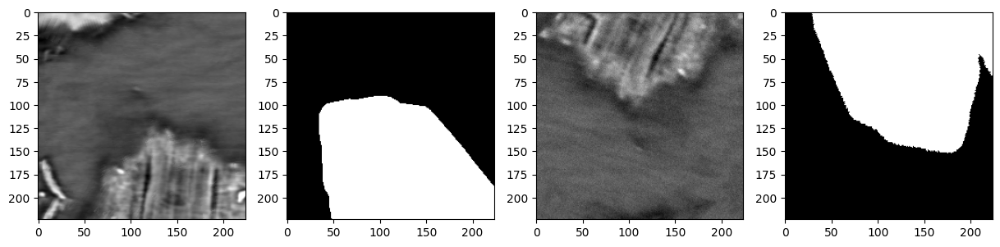

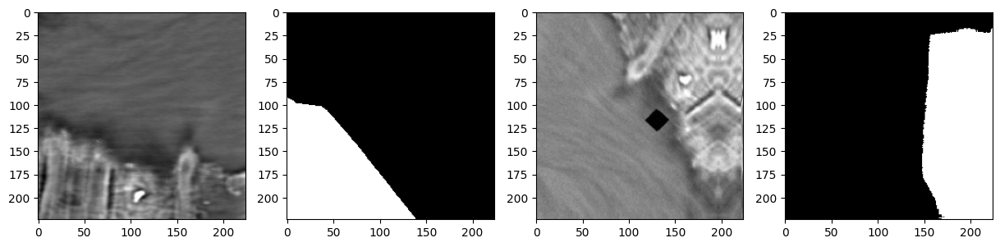

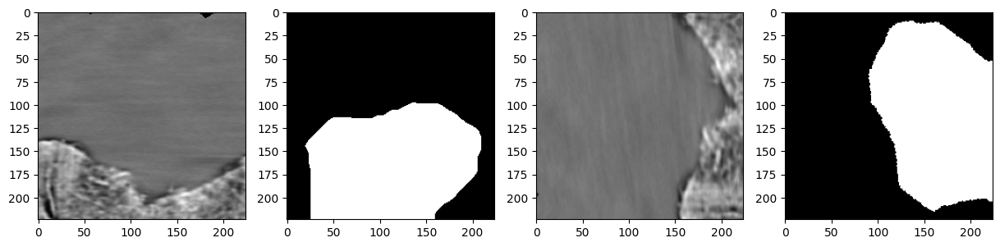

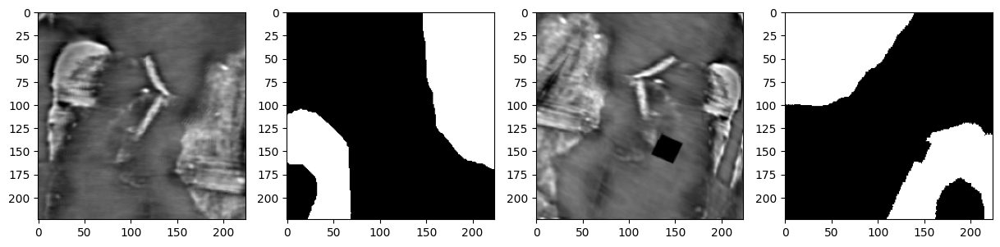

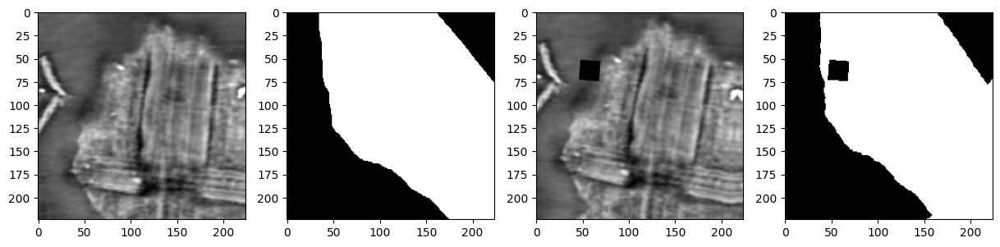

In [23]:

plot_dataset = CustomDataset(
    train_images, CFG, labels=train_masks)

transform = CFG.train_aug_list
transform = A.Compose(
    [t for t in transform if not isinstance(t, (A.Normalize, ToTensorV2))])


plot_count = 0
for i in range(1000):

    image, mask = plot_dataset[i]
    data = transform(image=image, mask=mask)
    aug_image = data['image']
    aug_mask = data['mask']

    if mask.sum() == 0:
        continue

    fig, axes = plt.subplots(1, 4, figsize=(15, 8))
    axes[0].imshow(image[..., 0], cmap="gray")
    axes[1].imshow(mask, cmap="gray")
    axes[2].imshow(aug_image[..., 0], cmap="gray")
    axes[3].imshow(aug_mask, cmap="gray")
    
    plt.savefig(CFG.figures_dir + f'aug_fold_{CFG.valid_id}_{plot_count}.png')

    plot_count += 1
    if plot_count == 5:
        break

In [24]:
# del plot_dataset
# gc.collect()

## model

In [25]:
class Decoder(nn.Module):
    def __init__(self, encoder_dims, upscale):
        super().__init__()
        self.convs = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(encoder_dims[i]+encoder_dims[i-1], encoder_dims[i-1], 3, 1, 1, bias=False),
                nn.BatchNorm2d(encoder_dims[i-1]),
                nn.ReLU(inplace=True)
            ) for i in range(1, len(encoder_dims))])

        self.logit = nn.Conv2d(encoder_dims[0], 1, 1, 1, 0)
        self.up = nn.Upsample(scale_factor=upscale, mode="bilinear")

    def forward(self, feature_maps):
        for i in range(len(feature_maps)-1, 0, -1):
            f_up = F.interpolate(feature_maps[i], scale_factor=2, mode="bilinear")
            f = torch.cat([feature_maps[i-1], f_up], dim=1)
            f_down = self.convs[i-1](f)
            feature_maps[i-1] = f_down

        x = self.logit(feature_maps[0])
        mask = self.up(x)
        return mask
    
class SegModel(nn.Module):
    def __init__(self,model_depth=34):
        super().__init__()
        self.encoder = generate_model(model_depth=model_depth, n_input_channels=1)
        self.decoder = Decoder(encoder_dims=[64, 128, 256, 512], upscale=4)
        
    def forward(self, x):
        if x.ndim==4:
            x=x[:,None]
        
        feat_maps = self.encoder(x)
        feat_maps_pooled = [torch.mean(f, dim=2) for f in feat_maps]
        pred_mask = self.decoder(feat_maps_pooled)
        return pred_mask
    
class CustomModel(nn.Module):
    def __init__(self, cfg, weight=None):
        super().__init__()
        self.cfg = cfg
        if cfg.backbone=="resnet3d":
            self.encoder=SegModel()
        else:
            self.encoder = smp.Unet(
                encoder_name=cfg.backbone, 
                encoder_weights=weight,
                in_channels=cfg.in_chans,
                classes=cfg.target_size,
                activation=None,
            )

    def forward(self, image):
        output = self.encoder(image)
        # output = output.squeeze(-1)
        return output


def build_model(cfg, weight="imagenet"):
    print('model_name', cfg.model_name)
    print('backbone', cfg.backbone)

    model = CustomModel(cfg, weight)

    return model

## scheduler

In [26]:

import torch.nn as nn
import torch
import math
import time
import numpy as np
import torch

from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, CosineAnnealingLR, ReduceLROnPlateau
from warmup_scheduler import GradualWarmupScheduler


class GradualWarmupSchedulerV2(GradualWarmupScheduler):
    """
    https://www.kaggle.com/code/underwearfitting/single-fold-training-of-resnet200d-lb0-965
    """
    def __init__(self, optimizer, multiplier, total_epoch, after_scheduler=None):
        super(GradualWarmupSchedulerV2, self).__init__(
            optimizer, multiplier, total_epoch, after_scheduler)

    def get_lr(self):
        if self.last_epoch > self.total_epoch:
            if self.after_scheduler:
                if not self.finished:
                    self.after_scheduler.base_lrs = [
                        base_lr * self.multiplier for base_lr in self.base_lrs]
                    self.finished = True
                return self.after_scheduler.get_lr()
            return [base_lr * self.multiplier for base_lr in self.base_lrs]
        if self.multiplier == 1.0:
            return [base_lr * (float(self.last_epoch) / self.total_epoch) for base_lr in self.base_lrs]
        else:
            return [base_lr * ((self.multiplier - 1.) * self.last_epoch / self.total_epoch + 1.) for base_lr in self.base_lrs]

def get_scheduler(cfg, optimizer):
    scheduler_cosine = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, cfg.epochs, eta_min=1e-7)
    scheduler = GradualWarmupSchedulerV2(
        optimizer, multiplier=10, total_epoch=1, after_scheduler=scheduler_cosine)

    return scheduler

def scheduler_step(scheduler, avg_val_loss, epoch):
    scheduler.step(epoch)


In [27]:
model = build_model(CFG)
model.to(device);

# optimizer = AdamW(model.parameters(), lr=CFG.lr)
# scheduler = get_scheduler(CFG, optimizer)

model_name Unet
backbone resnet3d


## loss

In [28]:

DiceLoss = smp.losses.DiceLoss(mode='binary')
BCELoss = smp.losses.SoftBCEWithLogitsLoss()

alpha = 0.5
beta = 1 - alpha
TverskyLoss = smp.losses.TverskyLoss(
    mode='binary', log_loss=False, alpha=alpha, beta=beta)

def criterion(y_pred, y_true):
    # return 0.5 * BCELoss(y_pred, y_true) + 0.5 * DiceLoss(y_pred, y_true)
    bce_loss =  BCELoss(y_pred, y_true)
    return bce_loss
    
    y_preds_probas = torch.sigmoid(y_pred)
    dxx = torch.pow(torch.roll(y_preds_probas, shifts=-1, dims=-1) - 2*y_preds_probas + torch.roll(y_preds_probas, shifts=1, dims=-2), 2)
    dyy = torch.pow(torch.roll(y_preds_probas, shifts=-1, dims=-2) - 2*y_preds_probas + torch.roll(y_preds_probas, shifts=1, dims=-2), 2)

    # Average over all pixels
    kin_energy = torch.mean(dxx + dyy)

    
    return bce_loss + kin_energy
    # return 0.5 * BCELoss(y_pred, y_true) + 0.5 * TverskyLoss(y_pred, y_true)

## train, val

In [29]:
def train_fn(train_loader, model, criterion, optimizer, device):
    model.train()

    scaler = GradScaler(enabled=CFG.use_amp)
    losses = AverageMeter()

    for step, (images, labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        images = images.to(device)
        labels = labels.to(device)
        batch_size = labels.size(0)

        with autocast(CFG.use_amp):
            y_preds = model(images)
            loss = criterion(y_preds, labels)

        losses.update(loss.item(), batch_size)
        scaler.scale(loss).backward()

        grad_norm = torch.nn.utils.clip_grad_norm_(
            model.parameters(), CFG.max_grad_norm)

        scaler.step(optimizer)
        scaler.update()
        optimizer.zero_grad()

    return losses.avg





def valid_fn(valid_loader, model, criterion, device, valid_xyxys, valid_mask_gt):
    mask_pred = np.zeros(valid_mask_gt.shape)
    mask_count = np.zeros(valid_mask_gt.shape)

    model.eval()
    losses = AverageMeter()

    for step, (images, labels) in tqdm(enumerate(valid_loader), total=len(valid_loader)):
        images = images.to(device)
        labels = labels.to(device)
        batch_size = labels.size(0)

        with torch.no_grad():
            y_preds = model(images)
            loss = criterion(y_preds, labels)
        losses.update(loss.item(), batch_size)

        # make whole mask
        y_preds = torch.sigmoid(y_preds).to('cpu').numpy()
        start_idx = step*CFG.valid_batch_size
        end_idx = start_idx + batch_size
        for i, (x1, y1, x2, y2) in enumerate(valid_xyxys[start_idx:end_idx]):
            mask_pred[y1:y2, x1:x2] += y_preds[i].squeeze(0)
            mask_count[y1:y2, x1:x2] += np.ones((CFG.tile_size, CFG.tile_size))

    print(f'mask_count_min: {mask_count.min()}')
    mask_pred /= mask_count
    return losses.avg, mask_pred

## metrics

In [30]:
from sklearn.metrics import fbeta_score

def fbeta_numpy(targets, preds, beta=0.5, smooth=1e-5):
    """
    https://www.kaggle.com/competitions/vesuvius-challenge-ink-detection/discussion/397288
    """
    y_true_count = targets.sum()
    ctp = preds[targets==1].sum()
    cfp = preds[targets==0].sum()
    beta_squared = beta * beta

    c_precision = ctp / (ctp + cfp + smooth)
    c_recall = ctp / (y_true_count + smooth)
    dice = (1 + beta_squared) * (c_precision * c_recall) / (beta_squared * c_precision + c_recall + smooth)

    return dice

def calc_fbeta(mask, mask_pred):
    mask = mask.astype(int).flatten()
    mask_pred = mask_pred.flatten()

    best_th = 0
    best_dice = 0
    for th in np.array(range(10, 100+1, 5)) / 100:
        
        # dice = fbeta_score(mask, (mask_pred >= th).astype(int), beta=0.5)
        dice = fbeta_numpy(mask, (mask_pred >= th).astype(int), beta=0.5)
        print(f'th: {th}, fbeta: {dice}')

        if dice > best_dice:
            best_dice = dice
            best_th = th
    
    Logger.info(f'best_th: {best_th}, fbeta: {best_dice}')
    return best_dice, best_th


def calc_cv(mask_gt, mask_pred):
    best_dice, best_th = calc_fbeta(mask_gt, mask_pred)

    return best_dice, best_th

## main

In [31]:
fragment_id = CFG.valid_id

valid_mask_gt = cv2.imread(CFG.comp_dataset_path + f"train/{fragment_id}/inklabels.png", 0)
valid_mask_gt = valid_mask_gt / 255
pad0 = (CFG.tile_size - valid_mask_gt.shape[0] % CFG.tile_size)
pad1 = (CFG.tile_size - valid_mask_gt.shape[1] % CFG.tile_size)
valid_mask_gt = np.pad(valid_mask_gt, [(0, pad0), (0, pad1)], constant_values=0)

In [32]:
optimizer = torch.optim.AdamW(model.parameters(), lr=CFG.lr)

In [33]:
# custom implementation of torch.optim.swa_utils.update_bn(train_loader, swa_model)
def manual_update_bn(model):
    model.train()
    with torch.no_grad():  # deactivate autograd engine to reduce memory usage and speed up computations

        for step, (images, labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
            images = images.to(device)
            _ = model(images)

In [34]:
import copy

fold = CFG.valid_id

if CFG.metric_direction == 'minimize':
    best_score = np.inf
    best_score_swa = np.inf
elif CFG.metric_direction == 'maximize':
    best_score = -1
    best_score_swa = -1

best_loss = np.inf

swa_n = 0
for epoch in range(CFG.epochs):

    start_time = time.time()

    # train
    for _ in range(CFG.n_train_epochs):
        avg_loss = train_fn(train_loader, model, criterion, optimizer, device)

    # eval
    avg_val_loss, mask_pred = valid_fn(valid_loader, model, criterion, device, valid_xyxys, valid_mask_gt)
    if epoch > CFG.swa_start:
        avg_val_loss_swa, mask_pred_swa = valid_fn(valid_loader, swa_model, criterion, device, valid_xyxys, valid_mask_gt)

    # scheduler_step(scheduler, avg_val_loss, epoch)

    # get best dice and threshold for both models
    best_dice, best_th = calc_cv(valid_mask_gt, mask_pred)
    if epoch > CFG.swa_start:
        best_dice_swa, best_th_swa = calc_cv(valid_mask_gt, mask_pred_swa)

    # score = avg_val_loss
    score = best_dice
    if epoch > CFG.swa_start:
        score_swa = best_dice_swa

    # score = avg_val_loss
    score = best_dice

    elapsed = time.time() - start_time

    Logger.info(
        f'Epoch {epoch+1} - avg_train_loss: {avg_loss:.4f}  avg_val_loss: {avg_val_loss:.4f}  time: {elapsed:.0f}s')
    if epoch > CFG.swa_start:
        Logger.info(
            f'Epoch {epoch+1} - SWA avg_val_loss: {avg_val_loss_swa:.4f}  time: {elapsed:.0f}s')

    Logger.info(
        f'Epoch {epoch+1} - avgScore: {score:.4f}')
    if epoch > CFG.swa_start:
        Logger.info(
            f'Epoch {epoch+1} - SWA avgScore: {score_swa:.4f}')

    if CFG.metric_direction == 'minimize':
        update_best = score < best_score
        if epoch > CFG.swa_start:
            update_best_swa = score_swa < best_score_swa
    elif CFG.metric_direction == 'maximize':
        update_best = score > best_score
        if epoch > CFG.swa_start:
            update_best_swa = score_swa > best_score_swa

    if update_best:
        best_loss = avg_val_loss
        best_score = score

        Logger.info(
            f'Epoch {epoch+1} - Save Best Score: {best_score:.4f} Model')
        Logger.info(
            f'Epoch {epoch+1} - Save Best Loss: {best_loss:.4f} Model')
        
        torch.save({'model': model.state_dict(),
                    'preds': mask_pred},
                    CFG.model_dir + f'{CFG.model_name}_fold{fold}_best.pth')

    if epoch > CFG.swa_start and update_best_swa:
        best_loss_swa = avg_val_loss_swa
        best_score_swa = score_swa

        Logger.info(
            f'Epoch {epoch+1} - Save Best SWA Score: {best_score_swa:.4f} Model')
        Logger.info(
            f'Epoch {epoch+1} - Save Best SWA Loss: {best_loss_swa:.4f} Model')
        
        torch.save({'model': swa_model.state_dict(),
                    'preds': mask_pred_swa},
                    CFG.model_dir + f'{CFG.model_name}_fold{fold}_swa_best.pth')
        
    # update SWA after a certain number of epochs
    if epoch >= CFG.swa_start and epoch % CFG.swa_freq == 0:
        
        if epoch == CFG.swa_start:
            # duplicate model to swa_model
            swa_model = build_model(CFG).to(device)
            swa_n = 0  # to track the number of models used for averaging
            
            # copy weights from model
            swa_model.load_state_dict(model.state_dict())
            
            # switch to SGD optimizer 
            optimizer = torch.optim.SGD(model.parameters(), lr=CFG.swa_lr)
            
            
        else:
            # loop over each parameter and update the swa_model parameter as average
            swa_n += 1
            for swa_param, param in zip(swa_model.parameters(), model.parameters()):
                swa_param.data.mul_(swa_n).add_(param.data).div_(swa_n + 1)
            
        



  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12110192710484145
th: 0.15, fbeta: 0.12174186816647473
th: 0.2, fbeta: 0.13042677373192005
th: 0.25, fbeta: 0.18496434854411273
th: 0.3, fbeta: 0.2115691066510376
th: 0.35, fbeta: 0.22962665551991393
th: 0.4, fbeta: 0.2544688961959099
th: 0.45, fbeta: 0.28682397109024427
th: 0.5, fbeta: 0.3215723926787952
th: 0.55, fbeta: 0.3548915755863221
th: 0.6, fbeta: 0.3641902369239022
th: 0.65, fbeta: 0.30444264967640394
th: 0.7, fbeta: 0.20793173928871078
th: 0.75, fbeta: 0.11203703909385304
th: 0.8, fbeta: 0.053660642629953265
th: 0.85, fbeta: 0.021600374039109894
th: 0.9, fbeta: 0.0045780712865968205
th: 0.95, fbeta: 0.0008289681157594404


best_th: 0.6, fbeta: 0.3641902369239022
Epoch 1 - avg_train_loss: 0.6767  avg_val_loss: 0.4780  time: 144s
Epoch 1 - avgScore: 0.3642
Epoch 1 - Save Best Score: 0.3642 Model
Epoch 1 - Save Best Loss: 0.4780 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12133556371937437
th: 0.15, fbeta: 0.12181634717883966
th: 0.2, fbeta: 0.12286015856630945
th: 0.25, fbeta: 0.126146346178653
th: 0.3, fbeta: 0.1326862359995105
th: 0.35, fbeta: 0.25247826423315306
th: 0.4, fbeta: 0.29130066749291494
th: 0.45, fbeta: 0.30908437618793627
th: 0.5, fbeta: 0.3288912357257569
th: 0.55, fbeta: 0.3477390682210899
th: 0.6, fbeta: 0.36604932937490386
th: 0.65, fbeta: 0.36580139429823405
th: 0.7, fbeta: 0.3415869095400317
th: 0.75, fbeta: 0.28894991264928205
th: 0.8, fbeta: 0.19218668481206408
th: 0.85, fbeta: 0.08780983256820256
th: 0.9, fbeta: 0.02090573188844325
th: 0.95, fbeta: 0.0025101017262604327


best_th: 0.6, fbeta: 0.36604932937490386
Epoch 2 - avg_train_loss: 0.6481  avg_val_loss: 0.5217  time: 142s
Epoch 2 - avgScore: 0.3660
Epoch 2 - Save Best Score: 0.3660 Model
Epoch 2 - Save Best Loss: 0.5217 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12189846700079672
th: 0.15, fbeta: 0.12337696783641913
th: 0.2, fbeta: 0.12719369078118545
th: 0.25, fbeta: 0.19542851665894706
th: 0.3, fbeta: 0.22240606069084493
th: 0.35, fbeta: 0.2310008303327373
th: 0.4, fbeta: 0.23469242418891542
th: 0.45, fbeta: 0.23988137659185843
th: 0.5, fbeta: 0.24816148457384446
th: 0.55, fbeta: 0.2605332801929545
th: 0.6, fbeta: 0.27723473779631563
th: 0.65, fbeta: 0.29879636182540714
th: 0.7, fbeta: 0.31991977333857746
th: 0.75, fbeta: 0.3357481286457872
th: 0.8, fbeta: 0.3332176576878945
th: 0.85, fbeta: 0.28958418279967274
th: 0.9, fbeta: 0.18046406975554752
th: 0.95, fbeta: 0.047592060990160084


best_th: 0.75, fbeta: 0.3357481286457872
Epoch 3 - avg_train_loss: 0.6190  avg_val_loss: 0.6506  time: 143s
Epoch 3 - avgScore: 0.3357


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12138172885649558
th: 0.15, fbeta: 0.12153813896036822
th: 0.2, fbeta: 0.12152089627504144
th: 0.25, fbeta: 0.12193568645037092
th: 0.3, fbeta: 0.1312219044498922
th: 0.35, fbeta: 0.22844159358370533
th: 0.4, fbeta: 0.27687832577505356
th: 0.45, fbeta: 0.29869925615294124
th: 0.5, fbeta: 0.3179017438830709
th: 0.55, fbeta: 0.3380159675636152
th: 0.6, fbeta: 0.35416500319565536
th: 0.65, fbeta: 0.37015417556777896
th: 0.7, fbeta: 0.3702546838899307
th: 0.75, fbeta: 0.3510488318161254
th: 0.8, fbeta: 0.30711941294033024
th: 0.85, fbeta: 0.22547727673953336
th: 0.9, fbeta: 0.11674644414784581
th: 0.95, fbeta: 0.03061825280962368


best_th: 0.7, fbeta: 0.3702546838899307
Epoch 4 - avg_train_loss: 0.6063  avg_val_loss: 0.5289  time: 143s
Epoch 4 - avgScore: 0.3703
Epoch 4 - Save Best Score: 0.3703 Model
Epoch 4 - Save Best Loss: 0.5289 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12159406260876957
th: 0.15, fbeta: 0.12229796324163276
th: 0.2, fbeta: 0.12524738298104549
th: 0.25, fbeta: 0.16088629349192524
th: 0.3, fbeta: 0.23618530728402062
th: 0.35, fbeta: 0.282523171036485
th: 0.4, fbeta: 0.31090485323465433
th: 0.45, fbeta: 0.33463532155178516
th: 0.5, fbeta: 0.3510488631049663
th: 0.55, fbeta: 0.3643549236037763
th: 0.6, fbeta: 0.36610076755915427
th: 0.65, fbeta: 0.35063150019894496
th: 0.7, fbeta: 0.320716087135839
th: 0.75, fbeta: 0.2717843068011651
th: 0.8, fbeta: 0.20086282682943157
th: 0.85, fbeta: 0.10444445107472226
th: 0.9, fbeta: 0.03193771149925332
th: 0.95, fbeta: 0.0008400583299006225


best_th: 0.6, fbeta: 0.36610076755915427
Epoch 5 - avg_train_loss: 0.5936  avg_val_loss: 0.4319  time: 143s
Epoch 5 - avgScore: 0.3661


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12190104393574606
th: 0.15, fbeta: 0.12320067813948327
th: 0.2, fbeta: 0.1254534538434793
th: 0.25, fbeta: 0.12935528754870085
th: 0.3, fbeta: 0.17983527642336908
th: 0.35, fbeta: 0.2839020903514705
th: 0.4, fbeta: 0.3146258056904894
th: 0.45, fbeta: 0.3348790794667012
th: 0.5, fbeta: 0.35256942895733095
th: 0.55, fbeta: 0.36517381825437395
th: 0.6, fbeta: 0.3768706273080731
th: 0.65, fbeta: 0.3840399994497898
th: 0.7, fbeta: 0.3831408718085487
th: 0.75, fbeta: 0.36423555174671285
th: 0.8, fbeta: 0.31578601265239914
th: 0.85, fbeta: 0.23600760873640064
th: 0.9, fbeta: 0.12204896808042705
th: 0.95, fbeta: 0.026192508508614397


best_th: 0.65, fbeta: 0.3840399994497898
Epoch 6 - avg_train_loss: 0.5842  avg_val_loss: 0.4784  time: 143s
Epoch 6 - avgScore: 0.3840
Epoch 6 - Save Best Score: 0.3840 Model
Epoch 6 - Save Best Loss: 0.4784 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12169773938147511
th: 0.15, fbeta: 0.12299580501818627
th: 0.2, fbeta: 0.12667212041283066
th: 0.25, fbeta: 0.16194503211048578
th: 0.3, fbeta: 0.25431445251585033
th: 0.35, fbeta: 0.2709292539702852
th: 0.4, fbeta: 0.28752708259476023
th: 0.45, fbeta: 0.30561051509313747
th: 0.5, fbeta: 0.32542260563951386
th: 0.55, fbeta: 0.3461471436917839
th: 0.6, fbeta: 0.36607522701927897
th: 0.65, fbeta: 0.3843685343094142
th: 0.7, fbeta: 0.4005205415652046
th: 0.75, fbeta: 0.4155495377311552
th: 0.8, fbeta: 0.4156711277569012
th: 0.85, fbeta: 0.3836974020300865
th: 0.9, fbeta: 0.2654398828557427
th: 0.95, fbeta: 0.04044549584066077


best_th: 0.8, fbeta: 0.4156711277569012
Epoch 7 - avg_train_loss: 0.5759  avg_val_loss: 0.5306  time: 143s
Epoch 7 - avgScore: 0.4157
Epoch 7 - Save Best Score: 0.4157 Model
Epoch 7 - Save Best Loss: 0.5306 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12174298350066598
th: 0.15, fbeta: 0.13318969020013594
th: 0.2, fbeta: 0.1826028198158023
th: 0.25, fbeta: 0.23259688059459718
th: 0.3, fbeta: 0.2623378839019076
th: 0.35, fbeta: 0.27125866228012474
th: 0.4, fbeta: 0.268878668226028
th: 0.45, fbeta: 0.24563476225482395
th: 0.5, fbeta: 0.19401602859014958
th: 0.55, fbeta: 0.12899644184755632
th: 0.6, fbeta: 0.07100223969810228
th: 0.65, fbeta: 0.030252427559787826
th: 0.7, fbeta: 0.007301013344425072
th: 0.75, fbeta: 0.0008771864031323808
th: 0.8, fbeta: 5.288272886999482e-05
th: 0.85, fbeta: 0.0
th: 0.9, fbeta: 0.0
th: 0.95, fbeta: 0.0


best_th: 0.35, fbeta: 0.27125866228012474
Epoch 8 - avg_train_loss: 0.5640  avg_val_loss: 0.3828  time: 142s
Epoch 8 - avgScore: 0.2713


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.1233719189111818
th: 0.15, fbeta: 0.12845401738516976
th: 0.2, fbeta: 0.20641068318390524
th: 0.25, fbeta: 0.25553907972860895
th: 0.3, fbeta: 0.27413727635367324
th: 0.35, fbeta: 0.2902325827027594
th: 0.4, fbeta: 0.3069879359084078
th: 0.45, fbeta: 0.3232482712854992
th: 0.5, fbeta: 0.34015153165403467
th: 0.55, fbeta: 0.3584881118857728
th: 0.6, fbeta: 0.375736042637991
th: 0.65, fbeta: 0.3880508202651947
th: 0.7, fbeta: 0.3925346979208913
th: 0.75, fbeta: 0.38155750144930545
th: 0.8, fbeta: 0.3509662134602816
th: 0.85, fbeta: 0.28721333947467753
th: 0.9, fbeta: 0.16991628809794726
th: 0.95, fbeta: 0.03709083305133356


best_th: 0.7, fbeta: 0.3925346979208913
Epoch 9 - avg_train_loss: 0.5599  avg_val_loss: 0.4408  time: 143s
Epoch 9 - avgScore: 0.3925


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.1212480495117451
th: 0.15, fbeta: 0.12055537518498842
th: 0.2, fbeta: 0.11870751723886408
th: 0.25, fbeta: 0.11517643414990124
th: 0.3, fbeta: 0.11882290895365341
th: 0.35, fbeta: 0.21205259198946383
th: 0.4, fbeta: 0.26342831144203965
th: 0.45, fbeta: 0.29763279444186685
th: 0.5, fbeta: 0.3258896368479634
th: 0.55, fbeta: 0.3474685184929737
th: 0.6, fbeta: 0.33510391623077274
th: 0.65, fbeta: 0.30138307617065435
th: 0.7, fbeta: 0.25140646794648647
th: 0.75, fbeta: 0.18795701391785563
th: 0.8, fbeta: 0.12196063262219545
th: 0.85, fbeta: 0.05682008233597071
th: 0.9, fbeta: 0.013186480597845824
th: 0.95, fbeta: 0.0


best_th: 0.55, fbeta: 0.3474685184929737
Epoch 10 - avg_train_loss: 0.5513  avg_val_loss: 0.4895  time: 143s
Epoch 10 - avgScore: 0.3475


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12218312589972075
th: 0.15, fbeta: 0.12451251944860324
th: 0.2, fbeta: 0.147757530291849
th: 0.25, fbeta: 0.2382572480637944
th: 0.3, fbeta: 0.2731373792390146
th: 0.35, fbeta: 0.29342544183298686
th: 0.4, fbeta: 0.3136562716568467
th: 0.45, fbeta: 0.33543860335972636
th: 0.5, fbeta: 0.3562926922989025
th: 0.55, fbeta: 0.37645680701067236
th: 0.6, fbeta: 0.3927511719687646
th: 0.65, fbeta: 0.40552570467651056
th: 0.7, fbeta: 0.4125409109565257
th: 0.75, fbeta: 0.4115661785855226
th: 0.8, fbeta: 0.39417240355748656
th: 0.85, fbeta: 0.3490438364471564
th: 0.9, fbeta: 0.2679981846470066
th: 0.95, fbeta: 0.12058434417400908


best_th: 0.7, fbeta: 0.4125409109565257
Epoch 11 - avg_train_loss: 0.5417  avg_val_loss: 0.4514  time: 143s
Epoch 11 - avgScore: 0.4125


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12587453715817584
th: 0.15, fbeta: 0.19755008181942807
th: 0.2, fbeta: 0.24517717911040027
th: 0.25, fbeta: 0.26386990761219475
th: 0.3, fbeta: 0.2776020128405012
th: 0.35, fbeta: 0.29211066869555496
th: 0.4, fbeta: 0.30773686931922484
th: 0.45, fbeta: 0.32704510391781705
th: 0.5, fbeta: 0.34825070355834287
th: 0.55, fbeta: 0.36991427914710345
th: 0.6, fbeta: 0.39024848345350405
th: 0.65, fbeta: 0.41070473153786735
th: 0.7, fbeta: 0.4255338794581395
th: 0.75, fbeta: 0.4340124263416896
th: 0.8, fbeta: 0.42910844298387985
th: 0.85, fbeta: 0.3920140380484756
th: 0.9, fbeta: 0.2877468815550527
th: 0.95, fbeta: 0.124331656246393


best_th: 0.75, fbeta: 0.4340124263416896
Epoch 12 - avg_train_loss: 0.5355  avg_val_loss: 0.4254  time: 143s
Epoch 12 - avgScore: 0.4340
Epoch 12 - Save Best Score: 0.4340 Model
Epoch 12 - Save Best Loss: 0.4254 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12234071528249585
th: 0.15, fbeta: 0.12394984558859644
th: 0.2, fbeta: 0.12671756363659895
th: 0.25, fbeta: 0.13069612768047786
th: 0.3, fbeta: 0.23757083099428875
th: 0.35, fbeta: 0.2910698369859486
th: 0.4, fbeta: 0.3211800152524176
th: 0.45, fbeta: 0.35065901506291647
th: 0.5, fbeta: 0.3820269579470549
th: 0.55, fbeta: 0.40873693756925716
th: 0.6, fbeta: 0.4302100123457716
th: 0.65, fbeta: 0.4405992335907968
th: 0.7, fbeta: 0.43580150576664295
th: 0.75, fbeta: 0.41680996132504317
th: 0.8, fbeta: 0.3656561555983462
th: 0.85, fbeta: 0.27632540984607773
th: 0.9, fbeta: 0.15791954094654193
th: 0.95, fbeta: 0.028284640228124942


best_th: 0.65, fbeta: 0.4405992335907968
Epoch 13 - avg_train_loss: 0.5318  avg_val_loss: 0.4708  time: 143s
Epoch 13 - avgScore: 0.4406
Epoch 13 - Save Best Score: 0.4406 Model
Epoch 13 - Save Best Loss: 0.4708 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2308896791203054
th: 0.15, fbeta: 0.25005664191691546
th: 0.2, fbeta: 0.2630796550809694
th: 0.25, fbeta: 0.2744307293744292
th: 0.3, fbeta: 0.2849717476742393
th: 0.35, fbeta: 0.2948755683685485
th: 0.4, fbeta: 0.30529638057267694
th: 0.45, fbeta: 0.31444048321127427
th: 0.5, fbeta: 0.3246496806847563
th: 0.55, fbeta: 0.3344816102513042
th: 0.6, fbeta: 0.34161192340842034
th: 0.65, fbeta: 0.34880209730246325
th: 0.7, fbeta: 0.358106109014211
th: 0.75, fbeta: 0.36529680924415675
th: 0.8, fbeta: 0.36490115509728127
th: 0.85, fbeta: 0.34322949292726657
th: 0.9, fbeta: 0.26328761542698254
th: 0.95, fbeta: 0.1007658371682666


best_th: 0.75, fbeta: 0.36529680924415675
Epoch 14 - avg_train_loss: 0.5298  avg_val_loss: 0.3815  time: 143s
Epoch 14 - avgScore: 0.3653


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.12666707546601352
th: 0.15, fbeta: 0.1574129499832068
th: 0.2, fbeta: 0.258720643514534
th: 0.25, fbeta: 0.2826480214724219
th: 0.3, fbeta: 0.3020934736200902
th: 0.35, fbeta: 0.3237590291224196
th: 0.4, fbeta: 0.34971215550217205
th: 0.45, fbeta: 0.3785613154844653
th: 0.5, fbeta: 0.40191369918226955
th: 0.55, fbeta: 0.4141633484939105
th: 0.6, fbeta: 0.41746374845649953
th: 0.65, fbeta: 0.40778734434162783
th: 0.7, fbeta: 0.3878802757260578
th: 0.75, fbeta: 0.3507546743854031
th: 0.8, fbeta: 0.29420169431046794
th: 0.85, fbeta: 0.21391369483910805
th: 0.9, fbeta: 0.11378930179917038
th: 0.95, fbeta: 0.02634169358196007


best_th: 0.6, fbeta: 0.41746374845649953
Epoch 15 - avg_train_loss: 0.5138  avg_val_loss: 0.3604  time: 143s
Epoch 15 - avgScore: 0.4175


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.1258542571278767
th: 0.15, fbeta: 0.17814330599959138
th: 0.2, fbeta: 0.21804507036526777
th: 0.25, fbeta: 0.22892751547579304
th: 0.3, fbeta: 0.23422157756965997
th: 0.35, fbeta: 0.24078898702579818
th: 0.4, fbeta: 0.24844262757275454
th: 0.45, fbeta: 0.25745007380140367
th: 0.5, fbeta: 0.26835501858331845
th: 0.55, fbeta: 0.2813394076165495
th: 0.6, fbeta: 0.2959503451161816
th: 0.65, fbeta: 0.3115547553644537
th: 0.7, fbeta: 0.3268843809879434
th: 0.75, fbeta: 0.3418068285764969
th: 0.8, fbeta: 0.35381300898589435
th: 0.85, fbeta: 0.3537692791232948
th: 0.9, fbeta: 0.3140369375700797
th: 0.95, fbeta: 0.181536339046381


best_th: 0.8, fbeta: 0.35381300898589435
Epoch 16 - avg_train_loss: 0.5065  avg_val_loss: 0.6417  time: 143s
Epoch 16 - avgScore: 0.3538


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.20781277085254773
th: 0.15, fbeta: 0.23217963073997894
th: 0.2, fbeta: 0.24698445279471476
th: 0.25, fbeta: 0.2638844461509262
th: 0.3, fbeta: 0.2837870042353587
th: 0.35, fbeta: 0.30800028260663836
th: 0.4, fbeta: 0.3344449685404812
th: 0.45, fbeta: 0.3611308931469874
th: 0.5, fbeta: 0.38432168198645184
th: 0.55, fbeta: 0.4067641025834933
th: 0.6, fbeta: 0.425380461208756
th: 0.65, fbeta: 0.4407844755007446
th: 0.7, fbeta: 0.4509209340080291
th: 0.75, fbeta: 0.453559258929455
th: 0.8, fbeta: 0.4422776632893887
th: 0.85, fbeta: 0.413714458900841
th: 0.9, fbeta: 0.3350769137125171
th: 0.95, fbeta: 0.15220171115844983


best_th: 0.75, fbeta: 0.453559258929455
Epoch 17 - avg_train_loss: 0.5042  avg_val_loss: 0.3819  time: 143s
Epoch 17 - avgScore: 0.4536
Epoch 17 - Save Best Score: 0.4536 Model
Epoch 17 - Save Best Loss: 0.3819 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.23752775142748608
th: 0.15, fbeta: 0.2527854623217504
th: 0.2, fbeta: 0.26598190446056985
th: 0.25, fbeta: 0.27909702471809705
th: 0.3, fbeta: 0.29350068599513424
th: 0.35, fbeta: 0.3077822127019533
th: 0.4, fbeta: 0.32295922514631537
th: 0.45, fbeta: 0.33874878102469436
th: 0.5, fbeta: 0.35545969271338096
th: 0.55, fbeta: 0.37148921579324423
th: 0.6, fbeta: 0.3887849338176255
th: 0.65, fbeta: 0.40638927021629845
th: 0.7, fbeta: 0.42460289373995846
th: 0.75, fbeta: 0.44029167943519154
th: 0.8, fbeta: 0.449835020466102
th: 0.85, fbeta: 0.4490293318338697
th: 0.9, fbeta: 0.42757201634445263
th: 0.95, fbeta: 0.3045101523255034


best_th: 0.8, fbeta: 0.449835020466102
Epoch 18 - avg_train_loss: 0.5043  avg_val_loss: 0.4038  time: 143s
Epoch 18 - avgScore: 0.4498


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.19688763546962137
th: 0.15, fbeta: 0.22554362287892402
th: 0.2, fbeta: 0.24273209806496202
th: 0.25, fbeta: 0.25305988728561574
th: 0.3, fbeta: 0.263571816694798
th: 0.35, fbeta: 0.2738078220940787
th: 0.4, fbeta: 0.28424627169398503
th: 0.45, fbeta: 0.2955817126622802
th: 0.5, fbeta: 0.30679582788333987
th: 0.55, fbeta: 0.31850350469817895
th: 0.6, fbeta: 0.32943157521707944
th: 0.65, fbeta: 0.34070591009534407
th: 0.7, fbeta: 0.35102351306381585
th: 0.75, fbeta: 0.3597388889822513
th: 0.8, fbeta: 0.36849273306231795
th: 0.85, fbeta: 0.3761108392389268
th: 0.9, fbeta: 0.37440446046769926
th: 0.95, fbeta: 0.3182727084594102


best_th: 0.85, fbeta: 0.3761108392389268
Epoch 19 - avg_train_loss: 0.4980  avg_val_loss: 0.5287  time: 143s
Epoch 19 - avgScore: 0.3761


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2233533082076997
th: 0.15, fbeta: 0.23379317692555593
th: 0.2, fbeta: 0.2402741743091331
th: 0.25, fbeta: 0.24647726501764028
th: 0.3, fbeta: 0.25275478763189824
th: 0.35, fbeta: 0.2590694312912781
th: 0.4, fbeta: 0.2658538015936573
th: 0.45, fbeta: 0.2729108911826863
th: 0.5, fbeta: 0.2807006734901137
th: 0.55, fbeta: 0.289742104623341
th: 0.6, fbeta: 0.2989865256603983
th: 0.65, fbeta: 0.3089440355317702
th: 0.7, fbeta: 0.31980732201042755
th: 0.75, fbeta: 0.3325944936048778
th: 0.8, fbeta: 0.3479644346149274
th: 0.85, fbeta: 0.36570434535385116
th: 0.9, fbeta: 0.3843273235572066
th: 0.95, fbeta: 0.40643411046417344


best_th: 0.95, fbeta: 0.40643411046417344
Epoch 20 - avg_train_loss: 0.4951  avg_val_loss: 0.7808  time: 143s
Epoch 20 - avgScore: 0.4064


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.17582462548544175
th: 0.15, fbeta: 0.2231652754936915
th: 0.2, fbeta: 0.2472424952159017
th: 0.25, fbeta: 0.2639263515543008
th: 0.3, fbeta: 0.2770941318086153
th: 0.35, fbeta: 0.28988742720308774
th: 0.4, fbeta: 0.30415347316318936
th: 0.45, fbeta: 0.317917399256485
th: 0.5, fbeta: 0.3332167988954093
th: 0.55, fbeta: 0.34828813237406875
th: 0.6, fbeta: 0.36078709453961755
th: 0.65, fbeta: 0.3713188972633072
th: 0.7, fbeta: 0.3814027570834343
th: 0.75, fbeta: 0.3867464265540903
th: 0.8, fbeta: 0.3758915921211974
th: 0.85, fbeta: 0.33689595669845473
th: 0.9, fbeta: 0.2222501318012477
th: 0.95, fbeta: 0.055861950447566394


best_th: 0.75, fbeta: 0.3867464265540903
Epoch 21 - avg_train_loss: 0.4837  avg_val_loss: 0.4218  time: 143s
Epoch 21 - avgScore: 0.3867


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.14232184668900794
th: 0.15, fbeta: 0.22730875148636134
th: 0.2, fbeta: 0.24532793172191367
th: 0.25, fbeta: 0.262311145727104
th: 0.3, fbeta: 0.2833082457841604
th: 0.35, fbeta: 0.307175644439386
th: 0.4, fbeta: 0.33220716509954434
th: 0.45, fbeta: 0.3562283838350595
th: 0.5, fbeta: 0.3827962405491323
th: 0.55, fbeta: 0.4102938728301025
th: 0.6, fbeta: 0.433780934299599
th: 0.65, fbeta: 0.4509822225136724
th: 0.7, fbeta: 0.45703281935788004
th: 0.75, fbeta: 0.44663568088168076
th: 0.8, fbeta: 0.4117591407627923
th: 0.85, fbeta: 0.35496125191732003
th: 0.9, fbeta: 0.2618281402252856
th: 0.95, fbeta: 0.11576238752308424


best_th: 0.7, fbeta: 0.45703281935788004
Epoch 22 - avg_train_loss: 0.4799  avg_val_loss: 0.3751  time: 143s
Epoch 22 - avgScore: 0.4570
Epoch 22 - Save Best Score: 0.4570 Model
Epoch 22 - Save Best Loss: 0.3751 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.22027746433322795
th: 0.15, fbeta: 0.24260600101834276
th: 0.2, fbeta: 0.25595454027562964
th: 0.25, fbeta: 0.27011021401518587
th: 0.3, fbeta: 0.28410015721153287
th: 0.35, fbeta: 0.29761526291772256
th: 0.4, fbeta: 0.3107901492025611
th: 0.45, fbeta: 0.32612771768254356
th: 0.5, fbeta: 0.3411537593213744
th: 0.55, fbeta: 0.3568995343496095
th: 0.6, fbeta: 0.37619104086664923
th: 0.65, fbeta: 0.39489992141683045
th: 0.7, fbeta: 0.41079709684427396
th: 0.75, fbeta: 0.4217473295537466
th: 0.8, fbeta: 0.42577616413546104
th: 0.85, fbeta: 0.40995453566938267
th: 0.9, fbeta: 0.369759627215272
th: 0.95, fbeta: 0.2308454070853989


best_th: 0.8, fbeta: 0.42577616413546104
Epoch 23 - avg_train_loss: 0.4765  avg_val_loss: 0.3976  time: 144s
Epoch 23 - avgScore: 0.4258


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2350948294923685
th: 0.15, fbeta: 0.24676677020691778
th: 0.2, fbeta: 0.2614514447752041
th: 0.25, fbeta: 0.2786372235617357
th: 0.3, fbeta: 0.2963427086118798
th: 0.35, fbeta: 0.3128692307631423
th: 0.4, fbeta: 0.3282790118724848
th: 0.45, fbeta: 0.3423037469101649
th: 0.5, fbeta: 0.357521074900898
th: 0.55, fbeta: 0.3736294473538445
th: 0.6, fbeta: 0.3861160055930209
th: 0.65, fbeta: 0.3940608829754647
th: 0.7, fbeta: 0.39002797485151425
th: 0.75, fbeta: 0.36436711920506376
th: 0.8, fbeta: 0.3224653036948518
th: 0.85, fbeta: 0.25485008399791176
th: 0.9, fbeta: 0.15724254220086595
th: 0.95, fbeta: 0.06027498057446738


best_th: 0.65, fbeta: 0.3940608829754647
Epoch 24 - avg_train_loss: 0.4731  avg_val_loss: 0.3383  time: 143s
Epoch 24 - avgScore: 0.3941


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2358863781657199
th: 0.15, fbeta: 0.252658343173819
th: 0.2, fbeta: 0.26886432103117347
th: 0.25, fbeta: 0.28484097372485684
th: 0.3, fbeta: 0.30031254521335493
th: 0.35, fbeta: 0.3157369381759478
th: 0.4, fbeta: 0.33081100775990724
th: 0.45, fbeta: 0.34445053442665713
th: 0.5, fbeta: 0.36011184575844274
th: 0.55, fbeta: 0.37633841508363847
th: 0.6, fbeta: 0.3912565232245106
th: 0.65, fbeta: 0.4034019537257175
th: 0.7, fbeta: 0.4141562366122851
th: 0.75, fbeta: 0.42065967425590434
th: 0.8, fbeta: 0.41622042884221583
th: 0.85, fbeta: 0.3958521683641475
th: 0.9, fbeta: 0.3358713480856393
th: 0.95, fbeta: 0.1642427294152707


best_th: 0.75, fbeta: 0.42065967425590434
Epoch 25 - avg_train_loss: 0.4677  avg_val_loss: 0.3665  time: 144s
Epoch 25 - avgScore: 0.4207


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.23446454624830915
th: 0.15, fbeta: 0.24580815625648644
th: 0.2, fbeta: 0.25740884475591785
th: 0.25, fbeta: 0.26900155932338377
th: 0.3, fbeta: 0.280452062684638
th: 0.35, fbeta: 0.29167407985275934
th: 0.4, fbeta: 0.30234680153291627
th: 0.45, fbeta: 0.3139152597729614
th: 0.5, fbeta: 0.32628947518604284
th: 0.55, fbeta: 0.33878498204647134
th: 0.6, fbeta: 0.3542103300322651
th: 0.65, fbeta: 0.3697573787074587
th: 0.7, fbeta: 0.38985103942328464
th: 0.75, fbeta: 0.4104090203343905
th: 0.8, fbeta: 0.4288922596541386
th: 0.85, fbeta: 0.4351994073270026
th: 0.9, fbeta: 0.4041647603024258
th: 0.95, fbeta: 0.2699258343390474


best_th: 0.85, fbeta: 0.4351994073270026
Epoch 26 - avg_train_loss: 0.4623  avg_val_loss: 0.4495  time: 144s
Epoch 26 - avgScore: 0.4352


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24277072503792682
th: 0.15, fbeta: 0.2600152755670816
th: 0.2, fbeta: 0.27891053152065876
th: 0.25, fbeta: 0.29681791427001564
th: 0.3, fbeta: 0.3138989276488595
th: 0.35, fbeta: 0.3316140016780668
th: 0.4, fbeta: 0.3527045669556862
th: 0.45, fbeta: 0.37366527090458684
th: 0.5, fbeta: 0.3907896269283342
th: 0.55, fbeta: 0.40501175140587464
th: 0.6, fbeta: 0.41793885547583715
th: 0.65, fbeta: 0.4289940246620233
th: 0.7, fbeta: 0.43635611090405557
th: 0.75, fbeta: 0.4391698648969442
th: 0.8, fbeta: 0.4241872674243058
th: 0.85, fbeta: 0.38280614141340863
th: 0.9, fbeta: 0.2899368889810995
th: 0.95, fbeta: 0.11830398710753345


best_th: 0.75, fbeta: 0.4391698648969442
Epoch 27 - avg_train_loss: 0.4498  avg_val_loss: 0.3331  time: 145s
Epoch 27 - avgScore: 0.4392


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2326015032121531
th: 0.15, fbeta: 0.24524541329787583
th: 0.2, fbeta: 0.25885632868415853
th: 0.25, fbeta: 0.2740657865576238
th: 0.3, fbeta: 0.28946599814781143
th: 0.35, fbeta: 0.30559780049441426
th: 0.4, fbeta: 0.3224937045171407
th: 0.45, fbeta: 0.3375220487202003
th: 0.5, fbeta: 0.35347439037848294
th: 0.55, fbeta: 0.3694186884643362
th: 0.6, fbeta: 0.3834398280648482
th: 0.65, fbeta: 0.3980090841341068
th: 0.7, fbeta: 0.4087731656130223
th: 0.75, fbeta: 0.4112830663312524
th: 0.8, fbeta: 0.4087388119907071
th: 0.85, fbeta: 0.38751084497575866
th: 0.9, fbeta: 0.33153391380291836
th: 0.95, fbeta: 0.18701823662629752


best_th: 0.75, fbeta: 0.4112830663312524
Epoch 28 - avg_train_loss: 0.4512  avg_val_loss: 0.3845  time: 146s
Epoch 28 - avgScore: 0.4113


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.23512507743844321
th: 0.15, fbeta: 0.2482523041161126
th: 0.2, fbeta: 0.26248963782805795
th: 0.25, fbeta: 0.27735909102920725
th: 0.3, fbeta: 0.2927569351700057
th: 0.35, fbeta: 0.3080526870039345
th: 0.4, fbeta: 0.3252845295152003
th: 0.45, fbeta: 0.3428952633641196
th: 0.5, fbeta: 0.36181586591836046
th: 0.55, fbeta: 0.3838780316065764
th: 0.6, fbeta: 0.40763833553715584
th: 0.65, fbeta: 0.4277561190097604
th: 0.7, fbeta: 0.4393626340127399
th: 0.75, fbeta: 0.44265046799201435
th: 0.8, fbeta: 0.434783951129911
th: 0.85, fbeta: 0.3980744406618467
th: 0.9, fbeta: 0.29626903762631474
th: 0.95, fbeta: 0.11205387246898521


best_th: 0.75, fbeta: 0.44265046799201435
Epoch 29 - avg_train_loss: 0.4429  avg_val_loss: 0.3675  time: 144s
Epoch 29 - avgScore: 0.4427


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.241819900740939
th: 0.15, fbeta: 0.2583993136136039
th: 0.2, fbeta: 0.2746407438736676
th: 0.25, fbeta: 0.2907663167466955
th: 0.3, fbeta: 0.3081443793892379
th: 0.35, fbeta: 0.3265262340323782
th: 0.4, fbeta: 0.3458684272022463
th: 0.45, fbeta: 0.3645680753902529
th: 0.5, fbeta: 0.3844484709333128
th: 0.55, fbeta: 0.4036078965994021
th: 0.6, fbeta: 0.42146849498133504
th: 0.65, fbeta: 0.4355195137009603
th: 0.7, fbeta: 0.44465333175012595
th: 0.75, fbeta: 0.44520798496363423
th: 0.8, fbeta: 0.42459618279776606
th: 0.85, fbeta: 0.3866034143858512
th: 0.9, fbeta: 0.3055389091995777
th: 0.95, fbeta: 0.14177253784885488


best_th: 0.75, fbeta: 0.44520798496363423
Epoch 30 - avg_train_loss: 0.4445  avg_val_loss: 0.3519  time: 146s
Epoch 30 - avgScore: 0.4452


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24749771176900895
th: 0.15, fbeta: 0.2653539671589327
th: 0.2, fbeta: 0.2829655666510651
th: 0.25, fbeta: 0.30081014602999606
th: 0.3, fbeta: 0.31932585774421407
th: 0.35, fbeta: 0.33846056667805974
th: 0.4, fbeta: 0.3581798171715646
th: 0.45, fbeta: 0.37779507116992384
th: 0.5, fbeta: 0.39737756900189675
th: 0.55, fbeta: 0.41692029184548657
th: 0.6, fbeta: 0.4354664351635204
th: 0.65, fbeta: 0.45383693245924794
th: 0.7, fbeta: 0.4677628761670328
th: 0.75, fbeta: 0.4793661345099708
th: 0.8, fbeta: 0.48651874902768516
th: 0.85, fbeta: 0.4790316558285661
th: 0.9, fbeta: 0.44173832074297825
th: 0.95, fbeta: 0.32050589968570126


best_th: 0.8, fbeta: 0.48651874902768516
Epoch 31 - avg_train_loss: 0.4349  avg_val_loss: 0.3686  time: 145s
Epoch 31 - avgScore: 0.4865
Epoch 31 - Save Best Score: 0.4865 Model
Epoch 31 - Save Best Loss: 0.3686 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2289035279922498
th: 0.15, fbeta: 0.23754226766185563
th: 0.2, fbeta: 0.246882487660513
th: 0.25, fbeta: 0.2566553839569094
th: 0.3, fbeta: 0.2669734530849859
th: 0.35, fbeta: 0.2780193805138909
th: 0.4, fbeta: 0.2896798774423571
th: 0.45, fbeta: 0.3015760999904407
th: 0.5, fbeta: 0.3154156492319199
th: 0.55, fbeta: 0.3287302854567486
th: 0.6, fbeta: 0.3402260903189665
th: 0.65, fbeta: 0.35015482222479516
th: 0.7, fbeta: 0.3600963378594981
th: 0.75, fbeta: 0.36852321343102296
th: 0.8, fbeta: 0.37568365965733375
th: 0.85, fbeta: 0.37903800301182455
th: 0.9, fbeta: 0.3493672826315273
th: 0.95, fbeta: 0.22555494214373717


best_th: 0.85, fbeta: 0.37903800301182455
Epoch 32 - avg_train_loss: 0.4252  avg_val_loss: 0.5093  time: 147s
Epoch 32 - avgScore: 0.3790


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.22805936455665207
th: 0.15, fbeta: 0.2376224261688679
th: 0.2, fbeta: 0.24800848939834982
th: 0.25, fbeta: 0.2592341341699591
th: 0.3, fbeta: 0.2725809685031122
th: 0.35, fbeta: 0.2869317288075825
th: 0.4, fbeta: 0.3015003973865304
th: 0.45, fbeta: 0.31616042967673386
th: 0.5, fbeta: 0.3320752147376229
th: 0.55, fbeta: 0.34816553647822934
th: 0.6, fbeta: 0.36342243480697256
th: 0.65, fbeta: 0.37824737685625626
th: 0.7, fbeta: 0.39282080897011373
th: 0.75, fbeta: 0.39996447475365815
th: 0.8, fbeta: 0.39389308059153494
th: 0.85, fbeta: 0.3584887821368837
th: 0.9, fbeta: 0.2642414595419188
th: 0.95, fbeta: 0.103342807257623


best_th: 0.75, fbeta: 0.39996447475365815
Epoch 33 - avg_train_loss: 0.4241  avg_val_loss: 0.4104  time: 147s
Epoch 33 - avgScore: 0.4000


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.22683758153008818
th: 0.15, fbeta: 0.23879396752447776
th: 0.2, fbeta: 0.2491280483686367
th: 0.25, fbeta: 0.25960098173880347
th: 0.3, fbeta: 0.27087105012614776
th: 0.35, fbeta: 0.28340389242850644
th: 0.4, fbeta: 0.2964248811782731
th: 0.45, fbeta: 0.31052826420877244
th: 0.5, fbeta: 0.326175408592659
th: 0.55, fbeta: 0.3416706207762502
th: 0.6, fbeta: 0.35682892997921156
th: 0.65, fbeta: 0.3731281865788684
th: 0.7, fbeta: 0.3879722015260492
th: 0.75, fbeta: 0.4003412754849217
th: 0.8, fbeta: 0.411583149685826
th: 0.85, fbeta: 0.41590134527175854
th: 0.9, fbeta: 0.4083953468176657
th: 0.95, fbeta: 0.32945120109912474


best_th: 0.85, fbeta: 0.41590134527175854
Epoch 34 - avg_train_loss: 0.4203  avg_val_loss: 0.5064  time: 146s
Epoch 34 - avgScore: 0.4159


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.23383411826013473
th: 0.15, fbeta: 0.2504649587911335
th: 0.2, fbeta: 0.26442815475945397
th: 0.25, fbeta: 0.27839492903480884
th: 0.3, fbeta: 0.2930680038843824
th: 0.35, fbeta: 0.3081628852844013
th: 0.4, fbeta: 0.3231342974166497
th: 0.45, fbeta: 0.3363923812306084
th: 0.5, fbeta: 0.3497552730777836
th: 0.55, fbeta: 0.3636713695843686
th: 0.6, fbeta: 0.3783562108989394
th: 0.65, fbeta: 0.3927567830249459
th: 0.7, fbeta: 0.40444601207761677
th: 0.75, fbeta: 0.4153488042831402
th: 0.8, fbeta: 0.41822152498723936
th: 0.85, fbeta: 0.4066963054328983
th: 0.9, fbeta: 0.35576615716556925
th: 0.95, fbeta: 0.21284883032863647


best_th: 0.8, fbeta: 0.41822152498723936
Epoch 35 - avg_train_loss: 0.4140  avg_val_loss: 0.4353  time: 145s
Epoch 35 - avgScore: 0.4182


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2371357229900349
th: 0.15, fbeta: 0.2491174122186641
th: 0.2, fbeta: 0.26145496640946125
th: 0.25, fbeta: 0.2732803997936721
th: 0.3, fbeta: 0.2852260700623838
th: 0.35, fbeta: 0.2980466184947413
th: 0.4, fbeta: 0.31167535388828177
th: 0.45, fbeta: 0.32584141223431257
th: 0.5, fbeta: 0.3408485914254323
th: 0.55, fbeta: 0.3563470162149497
th: 0.6, fbeta: 0.3729660291128704
th: 0.65, fbeta: 0.3907965051704219
th: 0.7, fbeta: 0.4067840040050835
th: 0.75, fbeta: 0.4175596405813742
th: 0.8, fbeta: 0.42779299630453665
th: 0.85, fbeta: 0.42420106620233144
th: 0.9, fbeta: 0.39930050023898095
th: 0.95, fbeta: 0.2741387968215991


best_th: 0.8, fbeta: 0.42779299630453665
Epoch 36 - avg_train_loss: 0.4050  avg_val_loss: 0.4199  time: 148s
Epoch 36 - avgScore: 0.4278


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2590987111728647
th: 0.15, fbeta: 0.28064822015610175
th: 0.2, fbeta: 0.3013273716915139
th: 0.25, fbeta: 0.3219267126937025
th: 0.3, fbeta: 0.34151110962737485
th: 0.35, fbeta: 0.3615508924965417
th: 0.4, fbeta: 0.38085580433303334
th: 0.45, fbeta: 0.40039290994062915
th: 0.5, fbeta: 0.4200444094184479
th: 0.55, fbeta: 0.4356886125959151
th: 0.6, fbeta: 0.4450826080617134
th: 0.65, fbeta: 0.44774177220254374
th: 0.7, fbeta: 0.43856695092584397
th: 0.75, fbeta: 0.42005931958796106
th: 0.8, fbeta: 0.3864310806913235
th: 0.85, fbeta: 0.3420793816946731
th: 0.9, fbeta: 0.2862977454667076
th: 0.95, fbeta: 0.18084159317418302


best_th: 0.65, fbeta: 0.44774177220254374
Epoch 37 - avg_train_loss: 0.4023  avg_val_loss: 0.2964  time: 149s
Epoch 37 - avgScore: 0.4477


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.25616435381591995
th: 0.15, fbeta: 0.2758840189074137
th: 0.2, fbeta: 0.2948121494140634
th: 0.25, fbeta: 0.3139101485145673
th: 0.3, fbeta: 0.33171845749277706
th: 0.35, fbeta: 0.34772896118362934
th: 0.4, fbeta: 0.3654724793031706
th: 0.45, fbeta: 0.3820502989530076
th: 0.5, fbeta: 0.3952674227298085
th: 0.55, fbeta: 0.408324185610865
th: 0.6, fbeta: 0.420213751365324
th: 0.65, fbeta: 0.4307320793600468
th: 0.7, fbeta: 0.4338217903194407
th: 0.75, fbeta: 0.43346726709464295
th: 0.8, fbeta: 0.43002760138014773
th: 0.85, fbeta: 0.4135241512667687
th: 0.9, fbeta: 0.36164237646975994
th: 0.95, fbeta: 0.2225218543813269


best_th: 0.7, fbeta: 0.4338217903194407
Epoch 38 - avg_train_loss: 0.4006  avg_val_loss: 0.3356  time: 147s
Epoch 38 - avgScore: 0.4338


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2661617001048948
th: 0.15, fbeta: 0.2842759309191564
th: 0.2, fbeta: 0.30079965233090916
th: 0.25, fbeta: 0.31742391692106303
th: 0.3, fbeta: 0.3340857811741892
th: 0.35, fbeta: 0.3510486104820253
th: 0.4, fbeta: 0.36801764729695646
th: 0.45, fbeta: 0.3858702869737889
th: 0.5, fbeta: 0.4028100619722047
th: 0.55, fbeta: 0.4176555221088913
th: 0.6, fbeta: 0.4304633762006479
th: 0.65, fbeta: 0.44275521841564
th: 0.7, fbeta: 0.4567062449539737
th: 0.75, fbeta: 0.4661774858489163
th: 0.8, fbeta: 0.4663177835524633
th: 0.85, fbeta: 0.4577752726813427
th: 0.9, fbeta: 0.42969080779693497
th: 0.95, fbeta: 0.33018301373323067


best_th: 0.8, fbeta: 0.4663177835524633
Epoch 39 - avg_train_loss: 0.3924  avg_val_loss: 0.3467  time: 148s
Epoch 39 - avgScore: 0.4663


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24784869447766347
th: 0.15, fbeta: 0.26590441280592975
th: 0.2, fbeta: 0.282761378355704
th: 0.25, fbeta: 0.29853398838392625
th: 0.3, fbeta: 0.31431361617151066
th: 0.35, fbeta: 0.3288578025100988
th: 0.4, fbeta: 0.34345571107084827
th: 0.45, fbeta: 0.3570491664725388
th: 0.5, fbeta: 0.3696263311684971
th: 0.55, fbeta: 0.3834957277759236
th: 0.6, fbeta: 0.39558205625320214
th: 0.65, fbeta: 0.408482225121581
th: 0.7, fbeta: 0.4225172843884065
th: 0.75, fbeta: 0.4339058523925382
th: 0.8, fbeta: 0.4395247850643991
th: 0.85, fbeta: 0.4415017632599496
th: 0.9, fbeta: 0.4346091820345508
th: 0.95, fbeta: 0.3949783557958719


best_th: 0.85, fbeta: 0.4415017632599496
Epoch 40 - avg_train_loss: 0.3891  avg_val_loss: 0.4001  time: 147s
Epoch 40 - avgScore: 0.4415


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2512574598509935
th: 0.15, fbeta: 0.26571042368610603
th: 0.2, fbeta: 0.2802190802746233
th: 0.25, fbeta: 0.29437995768340647
th: 0.3, fbeta: 0.30813434547345186
th: 0.35, fbeta: 0.32225993622745486
th: 0.4, fbeta: 0.3362689570781921
th: 0.45, fbeta: 0.3493210642459207
th: 0.5, fbeta: 0.3629088101183205
th: 0.55, fbeta: 0.375215453006266
th: 0.6, fbeta: 0.38508993088422455
th: 0.65, fbeta: 0.39463996594349166
th: 0.7, fbeta: 0.3990616823637315
th: 0.75, fbeta: 0.3967756756556208
th: 0.8, fbeta: 0.3796653579920405
th: 0.85, fbeta: 0.33636101499634585
th: 0.9, fbeta: 0.2494490498860566
th: 0.95, fbeta: 0.11749180211289302


best_th: 0.7, fbeta: 0.3990616823637315
Epoch 41 - avg_train_loss: 0.3824  avg_val_loss: 0.3446  time: 146s
Epoch 41 - avgScore: 0.3991


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.25024109019432483
th: 0.15, fbeta: 0.26600494623477194
th: 0.2, fbeta: 0.280813321321772
th: 0.25, fbeta: 0.2956084356477275
th: 0.3, fbeta: 0.30968702650286856
th: 0.35, fbeta: 0.3244742121730122
th: 0.4, fbeta: 0.3394817671833605
th: 0.45, fbeta: 0.35291223729889354
th: 0.5, fbeta: 0.3643445458346734
th: 0.55, fbeta: 0.3749646889457876
th: 0.6, fbeta: 0.38489400208146785
th: 0.65, fbeta: 0.39306493765293715
th: 0.7, fbeta: 0.3972371381476598
th: 0.75, fbeta: 0.39623722369477254
th: 0.8, fbeta: 0.3941907753952952
th: 0.85, fbeta: 0.37797104660653985
th: 0.9, fbeta: 0.3337580413136263
th: 0.95, fbeta: 0.2224346261722431


best_th: 0.7, fbeta: 0.3972371381476598
Epoch 42 - avg_train_loss: 0.3799  avg_val_loss: 0.3734  time: 146s
Epoch 42 - avgScore: 0.3972


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.23702796781566104
th: 0.15, fbeta: 0.26447735534150396
th: 0.2, fbeta: 0.2867238069731187
th: 0.25, fbeta: 0.3019240922784304
th: 0.3, fbeta: 0.31771576923678896
th: 0.35, fbeta: 0.3331239402208313
th: 0.4, fbeta: 0.3453810959801764
th: 0.45, fbeta: 0.3552369373902336
th: 0.5, fbeta: 0.3641633693664227
th: 0.55, fbeta: 0.3695934682189175
th: 0.6, fbeta: 0.3694489823786346
th: 0.65, fbeta: 0.36578676130074317
th: 0.7, fbeta: 0.35664146699967786
th: 0.75, fbeta: 0.3379653382387199
th: 0.8, fbeta: 0.30061823732178977
th: 0.85, fbeta: 0.24243881452395216
th: 0.9, fbeta: 0.1571861730854108
th: 0.95, fbeta: 0.06568567928054321


best_th: 0.55, fbeta: 0.3695934682189175
Epoch 43 - avg_train_loss: 0.3735  avg_val_loss: 0.3501  time: 162s
Epoch 43 - avgScore: 0.3696


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24466364483406866
th: 0.15, fbeta: 0.2600404475776957
th: 0.2, fbeta: 0.27357587374359266
th: 0.25, fbeta: 0.28734857916293033
th: 0.3, fbeta: 0.3010063860582248
th: 0.35, fbeta: 0.3157297914884512
th: 0.4, fbeta: 0.32862421913628315
th: 0.45, fbeta: 0.340161419233263
th: 0.5, fbeta: 0.3524666746402443
th: 0.55, fbeta: 0.36628686410929356
th: 0.6, fbeta: 0.37686359367129035
th: 0.65, fbeta: 0.38528606199286825
th: 0.7, fbeta: 0.3923681586898834
th: 0.75, fbeta: 0.39158667550259246
th: 0.8, fbeta: 0.3765281708311009
th: 0.85, fbeta: 0.3449170192938011
th: 0.9, fbeta: 0.29201675739273325
th: 0.95, fbeta: 0.1982772685080826


best_th: 0.7, fbeta: 0.3923681586898834
Epoch 44 - avg_train_loss: 0.3743  avg_val_loss: 0.3584  time: 147s
Epoch 44 - avgScore: 0.3924


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24713691833567505
th: 0.15, fbeta: 0.2613313842426469
th: 0.2, fbeta: 0.2759946533122578
th: 0.25, fbeta: 0.29053400428968673
th: 0.3, fbeta: 0.3067127671080651
th: 0.35, fbeta: 0.3241145956966952
th: 0.4, fbeta: 0.3417490080886982
th: 0.45, fbeta: 0.35879705745514934
th: 0.5, fbeta: 0.3782043552534324
th: 0.55, fbeta: 0.3972734155318687
th: 0.6, fbeta: 0.4152378811237085
th: 0.65, fbeta: 0.4291971341612394
th: 0.7, fbeta: 0.43780227526162685
th: 0.75, fbeta: 0.4391876627228182
th: 0.8, fbeta: 0.43486359592891827
th: 0.85, fbeta: 0.41755613068204056
th: 0.9, fbeta: 0.3744404466098398
th: 0.95, fbeta: 0.28670883016403853


best_th: 0.75, fbeta: 0.4391876627228182
Epoch 45 - avg_train_loss: 0.3651  avg_val_loss: 0.3554  time: 147s
Epoch 45 - avgScore: 0.4392


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.23664618053287995
th: 0.15, fbeta: 0.25572484300207754
th: 0.2, fbeta: 0.2691601935145836
th: 0.25, fbeta: 0.28159611797409345
th: 0.3, fbeta: 0.2944701308696487
th: 0.35, fbeta: 0.3083428610739895
th: 0.4, fbeta: 0.32377351976812196
th: 0.45, fbeta: 0.3402370080215041
th: 0.5, fbeta: 0.3581619399224683
th: 0.55, fbeta: 0.3758664923236042
th: 0.6, fbeta: 0.3919985861434764
th: 0.65, fbeta: 0.4047516217536877
th: 0.7, fbeta: 0.4126518350009496
th: 0.75, fbeta: 0.4165663860874596
th: 0.8, fbeta: 0.4174529847992988
th: 0.85, fbeta: 0.4106691963773271
th: 0.9, fbeta: 0.38409818117053957
th: 0.95, fbeta: 0.2821698094359083


best_th: 0.8, fbeta: 0.4174529847992988
Epoch 46 - avg_train_loss: 0.3580  avg_val_loss: 0.3990  time: 147s
Epoch 46 - avgScore: 0.4175


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24366562859929947
th: 0.15, fbeta: 0.26375942424276144
th: 0.2, fbeta: 0.2840804634200275
th: 0.25, fbeta: 0.30282376575491643
th: 0.3, fbeta: 0.3202892735182784
th: 0.35, fbeta: 0.3385688370412849
th: 0.4, fbeta: 0.35573946331837614
th: 0.45, fbeta: 0.372665364948147
th: 0.5, fbeta: 0.38931984009458287
th: 0.55, fbeta: 0.40142355714874445
th: 0.6, fbeta: 0.40951352137840613
th: 0.65, fbeta: 0.41024541230070305
th: 0.7, fbeta: 0.4054697047656441
th: 0.75, fbeta: 0.3935616550669499
th: 0.8, fbeta: 0.37482827891110715
th: 0.85, fbeta: 0.3427028405105629
th: 0.9, fbeta: 0.2973351023161347
th: 0.95, fbeta: 0.20886403280627605


best_th: 0.65, fbeta: 0.41024541230070305
Epoch 47 - avg_train_loss: 0.3575  avg_val_loss: 0.3303  time: 149s
Epoch 47 - avgScore: 0.4102


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.25658956184543674
th: 0.15, fbeta: 0.27612713726699817
th: 0.2, fbeta: 0.2943433735952753
th: 0.25, fbeta: 0.3127651731800379
th: 0.3, fbeta: 0.33086758063178123
th: 0.35, fbeta: 0.3489521335276054
th: 0.4, fbeta: 0.3670857771945322
th: 0.45, fbeta: 0.38552037685027984
th: 0.5, fbeta: 0.4047253746361104
th: 0.55, fbeta: 0.42218563146411126
th: 0.6, fbeta: 0.43704152592772444
th: 0.65, fbeta: 0.45124925059074855
th: 0.7, fbeta: 0.46398203565155366
th: 0.75, fbeta: 0.4674775979619349
th: 0.8, fbeta: 0.46124299962356585
th: 0.85, fbeta: 0.43967513938302966
th: 0.9, fbeta: 0.40059682145004366
th: 0.95, fbeta: 0.3038850339625559


best_th: 0.75, fbeta: 0.4674775979619349
Epoch 48 - avg_train_loss: 0.3532  avg_val_loss: 0.3326  time: 148s
Epoch 48 - avgScore: 0.4675


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2499721352677494
th: 0.15, fbeta: 0.2653565065957536
th: 0.2, fbeta: 0.2802605102176423
th: 0.25, fbeta: 0.2922730184565533
th: 0.3, fbeta: 0.3046349678701485
th: 0.35, fbeta: 0.3179380099107232
th: 0.4, fbeta: 0.32979935256211595
th: 0.45, fbeta: 0.3407997227678159
th: 0.5, fbeta: 0.3530793366066775
th: 0.55, fbeta: 0.3645470123450814
th: 0.6, fbeta: 0.37194908339593363
th: 0.65, fbeta: 0.3716776415191003
th: 0.7, fbeta: 0.3638122658224074
th: 0.75, fbeta: 0.3471016757542431
th: 0.8, fbeta: 0.31563341817002716
th: 0.85, fbeta: 0.2610213352790454
th: 0.9, fbeta: 0.182111200693343
th: 0.95, fbeta: 0.08020853038442202


best_th: 0.6, fbeta: 0.37194908339593363
Epoch 49 - avg_train_loss: 0.3496  avg_val_loss: 0.3406  time: 147s
Epoch 49 - avgScore: 0.3719


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.22835395671487954
th: 0.15, fbeta: 0.25012273150709163
th: 0.2, fbeta: 0.26287535988106875
th: 0.25, fbeta: 0.27516503532523146
th: 0.3, fbeta: 0.2871393557414425
th: 0.35, fbeta: 0.29839096191672454
th: 0.4, fbeta: 0.3092167407841377
th: 0.45, fbeta: 0.3206464796552385
th: 0.5, fbeta: 0.3318428954399732
th: 0.55, fbeta: 0.3439147373811241
th: 0.6, fbeta: 0.35612975524915635
th: 0.65, fbeta: 0.3670481532700934
th: 0.7, fbeta: 0.3750788966257823
th: 0.75, fbeta: 0.3836531253912799
th: 0.8, fbeta: 0.3925944353342413
th: 0.85, fbeta: 0.3972397248589588
th: 0.9, fbeta: 0.3969858756909747
th: 0.95, fbeta: 0.37313947279610815


best_th: 0.85, fbeta: 0.3972397248589588
Epoch 50 - avg_train_loss: 0.3458  avg_val_loss: 0.5379  time: 148s
Epoch 50 - avgScore: 0.3972


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2360216154002863
th: 0.15, fbeta: 0.24476805912594254
th: 0.2, fbeta: 0.2530891882699254
th: 0.25, fbeta: 0.26080754179930976
th: 0.3, fbeta: 0.26737221083234636
th: 0.35, fbeta: 0.27478499111101845
th: 0.4, fbeta: 0.2816000407863465
th: 0.45, fbeta: 0.28745242525419584
th: 0.5, fbeta: 0.29448025875576855
th: 0.55, fbeta: 0.3011188097720156
th: 0.6, fbeta: 0.30733748349850043
th: 0.65, fbeta: 0.3109396230218554
th: 0.7, fbeta: 0.3119629166950709
th: 0.75, fbeta: 0.30999102720799393
th: 0.8, fbeta: 0.3005831182237012
th: 0.85, fbeta: 0.2816548862822246
th: 0.9, fbeta: 0.24456335067771487
th: 0.95, fbeta: 0.16098790921407405


best_th: 0.7, fbeta: 0.3119629166950709
Epoch 51 - avg_train_loss: 0.3418  avg_val_loss: 0.5115  time: 147s
Epoch 51 - avgScore: 0.3120


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2634255379164354
th: 0.15, fbeta: 0.28262940486468713
th: 0.2, fbeta: 0.30024046938579446
th: 0.25, fbeta: 0.3152558324062928
th: 0.3, fbeta: 0.3299385562324512
th: 0.35, fbeta: 0.3441691885583517
th: 0.4, fbeta: 0.3583560114945252
th: 0.45, fbeta: 0.37201127999754474
th: 0.5, fbeta: 0.38334580295915655
th: 0.55, fbeta: 0.39228912262271526
th: 0.6, fbeta: 0.40083205362705104
th: 0.65, fbeta: 0.4067413100762116
th: 0.7, fbeta: 0.4101438595290579
th: 0.75, fbeta: 0.4093782841120201
th: 0.8, fbeta: 0.40031391452449283
th: 0.85, fbeta: 0.3747281796471702
th: 0.9, fbeta: 0.32512753947362943
th: 0.95, fbeta: 0.23987849434992764


best_th: 0.7, fbeta: 0.4101438595290579
Epoch 52 - avg_train_loss: 0.3393  avg_val_loss: 0.3485  time: 147s
Epoch 52 - avgScore: 0.4101


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2429316165819493
th: 0.15, fbeta: 0.25527077428324596
th: 0.2, fbeta: 0.265979001251265
th: 0.25, fbeta: 0.27673120060586676
th: 0.3, fbeta: 0.2879770797248737
th: 0.35, fbeta: 0.2993650439525057
th: 0.4, fbeta: 0.31121539267839876
th: 0.45, fbeta: 0.3247578026544019
th: 0.5, fbeta: 0.33925373623238564
th: 0.55, fbeta: 0.35403556250709484
th: 0.6, fbeta: 0.36833792960272055
th: 0.65, fbeta: 0.38131349429642536
th: 0.7, fbeta: 0.39535989638176233
th: 0.75, fbeta: 0.41042865324874345
th: 0.8, fbeta: 0.42440981554679524
th: 0.85, fbeta: 0.43810548776350305
th: 0.9, fbeta: 0.4500127717781691
th: 0.95, fbeta: 0.44471554176269995


best_th: 0.9, fbeta: 0.4500127717781691
Epoch 53 - avg_train_loss: 0.3359  avg_val_loss: 0.5155  time: 149s
Epoch 53 - avgScore: 0.4500


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2535915975488799
th: 0.15, fbeta: 0.2781617897737598
th: 0.2, fbeta: 0.2961131693943457
th: 0.25, fbeta: 0.3106966150849963
th: 0.3, fbeta: 0.32447470537679673
th: 0.35, fbeta: 0.33823900944195173
th: 0.4, fbeta: 0.3526768149338459
th: 0.45, fbeta: 0.36708039186928
th: 0.5, fbeta: 0.3805909366041242
th: 0.55, fbeta: 0.3930021064667248
th: 0.6, fbeta: 0.40621596026825535
th: 0.65, fbeta: 0.41980788428195076
th: 0.7, fbeta: 0.4328268502223876
th: 0.75, fbeta: 0.4452420065376175
th: 0.8, fbeta: 0.4558154565176097
th: 0.85, fbeta: 0.4586758111438407
th: 0.9, fbeta: 0.4494906331937647
th: 0.95, fbeta: 0.394432758664159


best_th: 0.85, fbeta: 0.4586758111438407
Epoch 54 - avg_train_loss: 0.3303  avg_val_loss: 0.4123  time: 147s
Epoch 54 - avgScore: 0.4587


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.25181065829216537
th: 0.15, fbeta: 0.26361127902652276
th: 0.2, fbeta: 0.2751717495206312
th: 0.25, fbeta: 0.2865333230018706
th: 0.3, fbeta: 0.29799984800433527
th: 0.35, fbeta: 0.3094189935320877
th: 0.4, fbeta: 0.3203348478149861
th: 0.45, fbeta: 0.3319009668097471
th: 0.5, fbeta: 0.34361785226893704
th: 0.55, fbeta: 0.3552496577180291
th: 0.6, fbeta: 0.3667282426920646
th: 0.65, fbeta: 0.37778132161414985
th: 0.7, fbeta: 0.3889110983399557
th: 0.75, fbeta: 0.39983849738298005
th: 0.8, fbeta: 0.4129348492101644
th: 0.85, fbeta: 0.4249155166194117
th: 0.9, fbeta: 0.4355399832011065
th: 0.95, fbeta: 0.4386231923005315


best_th: 0.95, fbeta: 0.4386231923005315
Epoch 55 - avg_train_loss: 0.3218  avg_val_loss: 0.5649  time: 146s
Epoch 55 - avgScore: 0.4386


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26102642292941436
th: 0.15, fbeta: 0.2729250346119988
th: 0.2, fbeta: 0.28456341818093356
th: 0.25, fbeta: 0.2962804985481683
th: 0.3, fbeta: 0.30814337865964675
th: 0.35, fbeta: 0.31989172498266777
th: 0.4, fbeta: 0.33094480470513155
th: 0.45, fbeta: 0.3423499136526981
th: 0.5, fbeta: 0.3550984384951098
th: 0.55, fbeta: 0.36689621451257637
th: 0.6, fbeta: 0.3779359932120717
th: 0.65, fbeta: 0.38940469488476825
th: 0.7, fbeta: 0.3958118584363778
th: 0.75, fbeta: 0.4006254392279906
th: 0.8, fbeta: 0.40191349253697567
th: 0.85, fbeta: 0.3924048913835687
th: 0.9, fbeta: 0.35599049610302075
th: 0.95, fbeta: 0.2537464079704385


best_th: 0.8, fbeta: 0.40191349253697567
Epoch 56 - avg_train_loss: 0.3213  avg_val_loss: 0.3993  time: 147s
Epoch 56 - avgScore: 0.4019


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2535740129841449
th: 0.15, fbeta: 0.2672723373331389
th: 0.2, fbeta: 0.2818308658049001
th: 0.25, fbeta: 0.29513729050217186
th: 0.3, fbeta: 0.3073468747422847
th: 0.35, fbeta: 0.31978182401230076
th: 0.4, fbeta: 0.3315525777546449
th: 0.45, fbeta: 0.3451601344703738
th: 0.5, fbeta: 0.35983346193647026
th: 0.55, fbeta: 0.3734354840032895
th: 0.6, fbeta: 0.3889114767654367
th: 0.65, fbeta: 0.4038932881359637
th: 0.7, fbeta: 0.41347390287036573
th: 0.75, fbeta: 0.4173070766733864
th: 0.8, fbeta: 0.41216431106955503
th: 0.85, fbeta: 0.3944381121587451
th: 0.9, fbeta: 0.34521714117808383
th: 0.95, fbeta: 0.24450683654519087


best_th: 0.75, fbeta: 0.4173070766733864
Epoch 57 - avg_train_loss: 0.3211  avg_val_loss: 0.3735  time: 148s
Epoch 57 - avgScore: 0.4173


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.254160660498893
th: 0.15, fbeta: 0.2671191647118438
th: 0.2, fbeta: 0.2786387667656056
th: 0.25, fbeta: 0.289553928569904
th: 0.3, fbeta: 0.30033720598142893
th: 0.35, fbeta: 0.3109051889193056
th: 0.4, fbeta: 0.32239532630758666
th: 0.45, fbeta: 0.3359633089752185
th: 0.5, fbeta: 0.3505555682514187
th: 0.55, fbeta: 0.36614435360070346
th: 0.6, fbeta: 0.38073933262751675
th: 0.65, fbeta: 0.394724906345519
th: 0.7, fbeta: 0.40687983584238974
th: 0.75, fbeta: 0.41786951277091683
th: 0.8, fbeta: 0.42899247779061217
th: 0.85, fbeta: 0.4343563432682463
th: 0.9, fbeta: 0.4349783731882541
th: 0.95, fbeta: 0.39875483929425576


best_th: 0.9, fbeta: 0.4349783731882541
Epoch 58 - avg_train_loss: 0.3101  avg_val_loss: 0.4547  time: 147s
Epoch 58 - avgScore: 0.4350


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2517627659299138
th: 0.15, fbeta: 0.2635221207721633
th: 0.2, fbeta: 0.27383576818874655
th: 0.25, fbeta: 0.2842247643280254
th: 0.3, fbeta: 0.2940837692238792
th: 0.35, fbeta: 0.3039116995775282
th: 0.4, fbeta: 0.31343670376700844
th: 0.45, fbeta: 0.32234062810331593
th: 0.5, fbeta: 0.33152806610311497
th: 0.55, fbeta: 0.34033381709128413
th: 0.6, fbeta: 0.3495509175406433
th: 0.65, fbeta: 0.35817140833608174
th: 0.7, fbeta: 0.3665103629991074
th: 0.75, fbeta: 0.3756231253450774
th: 0.8, fbeta: 0.38458464479727655
th: 0.85, fbeta: 0.391468758694388
th: 0.9, fbeta: 0.39830275963463446
th: 0.95, fbeta: 0.3963736017861056


best_th: 0.9, fbeta: 0.39830275963463446
Epoch 59 - avg_train_loss: 0.3113  avg_val_loss: 0.5875  time: 147s
Epoch 59 - avgScore: 0.3983


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2598661967252661
th: 0.15, fbeta: 0.2766315253989862
th: 0.2, fbeta: 0.29084688007448367
th: 0.25, fbeta: 0.3043092858787607
th: 0.3, fbeta: 0.31587261976655595
th: 0.35, fbeta: 0.327271342331421
th: 0.4, fbeta: 0.33939256973432663
th: 0.45, fbeta: 0.3523296320026239
th: 0.5, fbeta: 0.3653552783901787
th: 0.55, fbeta: 0.3769428815765236
th: 0.6, fbeta: 0.3864287567207923
th: 0.65, fbeta: 0.3916297839602663
th: 0.7, fbeta: 0.3915168410296792
th: 0.75, fbeta: 0.3830749539527755
th: 0.8, fbeta: 0.3695727321263805
th: 0.85, fbeta: 0.3489993023612962
th: 0.9, fbeta: 0.3148835346857961
th: 0.95, fbeta: 0.23575272483969079


best_th: 0.65, fbeta: 0.3916297839602663
Epoch 60 - avg_train_loss: 0.3083  avg_val_loss: 0.3785  time: 147s
Epoch 60 - avgScore: 0.3916


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.25919313581232745
th: 0.15, fbeta: 0.27139272488134975
th: 0.2, fbeta: 0.282371218249395
th: 0.25, fbeta: 0.29177815122364975
th: 0.3, fbeta: 0.3000809160664032
th: 0.35, fbeta: 0.30781840340549044
th: 0.4, fbeta: 0.315270001404954
th: 0.45, fbeta: 0.32212904264997866
th: 0.5, fbeta: 0.32832292744953656
th: 0.55, fbeta: 0.3351711712618771
th: 0.6, fbeta: 0.33897943646710776
th: 0.65, fbeta: 0.34125805952012905
th: 0.7, fbeta: 0.34028686115231954
th: 0.75, fbeta: 0.33519011669887133
th: 0.8, fbeta: 0.3246505310430656
th: 0.85, fbeta: 0.3102081485993584
th: 0.9, fbeta: 0.2839463730314919
th: 0.95, fbeta: 0.22913856138828495


best_th: 0.65, fbeta: 0.34125805952012905
Epoch 61 - avg_train_loss: 0.2983  avg_val_loss: 0.4419  time: 150s
Epoch 61 - avgScore: 0.3413


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24920278028397252
th: 0.15, fbeta: 0.2587887011248037
th: 0.2, fbeta: 0.2660738532983165
th: 0.25, fbeta: 0.27394145935891506
th: 0.3, fbeta: 0.2834393323783606
th: 0.35, fbeta: 0.29312889658940183
th: 0.4, fbeta: 0.30343438986064764
th: 0.45, fbeta: 0.3125977457720613
th: 0.5, fbeta: 0.32000854267917656
th: 0.55, fbeta: 0.3275100550432242
th: 0.6, fbeta: 0.33282681822689175
th: 0.65, fbeta: 0.3348547531898192
th: 0.7, fbeta: 0.3320451073342173
th: 0.75, fbeta: 0.327996425087442
th: 0.8, fbeta: 0.3214805141776442
th: 0.85, fbeta: 0.31021913708832244
th: 0.9, fbeta: 0.29176195781622927
th: 0.95, fbeta: 0.24174774212575906


best_th: 0.65, fbeta: 0.3348547531898192
Epoch 62 - avg_train_loss: 0.3011  avg_val_loss: 0.4886  time: 148s
Epoch 62 - avgScore: 0.3349


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27060775020197136
th: 0.15, fbeta: 0.29109994546559187
th: 0.2, fbeta: 0.3101539737716878
th: 0.25, fbeta: 0.3265014278387999
th: 0.3, fbeta: 0.34175579175332577
th: 0.35, fbeta: 0.3581898513851051
th: 0.4, fbeta: 0.37290456354619034
th: 0.45, fbeta: 0.3861434565012058
th: 0.5, fbeta: 0.39978563791112076
th: 0.55, fbeta: 0.4114525832923144
th: 0.6, fbeta: 0.4213569213245926
th: 0.65, fbeta: 0.42904239684524464
th: 0.7, fbeta: 0.4317761069150539
th: 0.75, fbeta: 0.42802315963308973
th: 0.8, fbeta: 0.41833123478463324
th: 0.85, fbeta: 0.40016795029910873
th: 0.9, fbeta: 0.36565411474243514
th: 0.95, fbeta: 0.26952552294885923


best_th: 0.7, fbeta: 0.4317761069150539
Epoch 63 - avg_train_loss: 0.2941  avg_val_loss: 0.3562  time: 148s
Epoch 63 - avgScore: 0.4318


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27235751176169676
th: 0.15, fbeta: 0.288749489192013
th: 0.2, fbeta: 0.30451753891546235
th: 0.25, fbeta: 0.3188627891714985
th: 0.3, fbeta: 0.33086437095086085
th: 0.35, fbeta: 0.34279392685789517
th: 0.4, fbeta: 0.35514494585704837
th: 0.45, fbeta: 0.36772685296714896
th: 0.5, fbeta: 0.38079229335254927
th: 0.55, fbeta: 0.3931617818465925
th: 0.6, fbeta: 0.40474401434600965
th: 0.65, fbeta: 0.41167760766118305
th: 0.7, fbeta: 0.4114174560598648
th: 0.75, fbeta: 0.4038488155414064
th: 0.8, fbeta: 0.3874473992611586
th: 0.85, fbeta: 0.3585357009537923
th: 0.9, fbeta: 0.2984130083719561
th: 0.95, fbeta: 0.18919618941637512


best_th: 0.65, fbeta: 0.41167760766118305
Epoch 64 - avg_train_loss: 0.2920  avg_val_loss: 0.3653  time: 151s
Epoch 64 - avgScore: 0.4117


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2574550583013397
th: 0.15, fbeta: 0.27096837032873305
th: 0.2, fbeta: 0.28327710306710213
th: 0.25, fbeta: 0.29469767269866937
th: 0.3, fbeta: 0.30616387771508635
th: 0.35, fbeta: 0.3180765181998815
th: 0.4, fbeta: 0.3305902544931196
th: 0.45, fbeta: 0.3437799771255722
th: 0.5, fbeta: 0.35720015008676714
th: 0.55, fbeta: 0.3706073270674834
th: 0.6, fbeta: 0.3843862885090923
th: 0.65, fbeta: 0.3967945949097075
th: 0.7, fbeta: 0.40720489103420726
th: 0.75, fbeta: 0.41771049172716623
th: 0.8, fbeta: 0.42532747969029333
th: 0.85, fbeta: 0.4320746245989331
th: 0.9, fbeta: 0.43588522955461184
th: 0.95, fbeta: 0.42160818176516535


best_th: 0.9, fbeta: 0.43588522955461184
Epoch 65 - avg_train_loss: 0.2896  avg_val_loss: 0.4722  time: 149s
Epoch 65 - avgScore: 0.4359


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.22985136429592287
th: 0.15, fbeta: 0.2625482543077405
th: 0.2, fbeta: 0.276429801995982
th: 0.25, fbeta: 0.2890974147266356
th: 0.3, fbeta: 0.30167124831968073
th: 0.35, fbeta: 0.3140025636160052
th: 0.4, fbeta: 0.32724421528096564
th: 0.45, fbeta: 0.34061866410303976
th: 0.5, fbeta: 0.35485925974374516
th: 0.55, fbeta: 0.36900089404946845
th: 0.6, fbeta: 0.3826817562003491
th: 0.65, fbeta: 0.3953831895770866
th: 0.7, fbeta: 0.4037598616910802
th: 0.75, fbeta: 0.40650002370610555
th: 0.8, fbeta: 0.40188100916700975
th: 0.85, fbeta: 0.3891732493878875
th: 0.9, fbeta: 0.3697674243709781
th: 0.95, fbeta: 0.3169667802868727


best_th: 0.75, fbeta: 0.40650002370610555
Epoch 66 - avg_train_loss: 0.2815  avg_val_loss: 0.4400  time: 148s
Epoch 66 - avgScore: 0.4065


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24485647492187318
th: 0.15, fbeta: 0.26212823000775193
th: 0.2, fbeta: 0.27213214383351086
th: 0.25, fbeta: 0.2808406015823225
th: 0.3, fbeta: 0.2905684602165669
th: 0.35, fbeta: 0.300140518809343
th: 0.4, fbeta: 0.30954577027969765
th: 0.45, fbeta: 0.3182668869547613
th: 0.5, fbeta: 0.3255702942940021
th: 0.55, fbeta: 0.33217476379045846
th: 0.6, fbeta: 0.3368553214284729
th: 0.65, fbeta: 0.3381019521268446
th: 0.7, fbeta: 0.3385372783474741
th: 0.75, fbeta: 0.33585799749400214
th: 0.8, fbeta: 0.3279698671549973
th: 0.85, fbeta: 0.3134864952995953
th: 0.9, fbeta: 0.2928998999440509
th: 0.95, fbeta: 0.2452364813396148


best_th: 0.7, fbeta: 0.3385372783474741
Epoch 67 - avg_train_loss: 0.2830  avg_val_loss: 0.5033  time: 148s
Epoch 67 - avgScore: 0.3385


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26567423960374426
th: 0.15, fbeta: 0.2835788154436238
th: 0.2, fbeta: 0.29889520257700797
th: 0.25, fbeta: 0.31236410117960756
th: 0.3, fbeta: 0.32465611099017816
th: 0.35, fbeta: 0.33709778349593944
th: 0.4, fbeta: 0.34985453045906634
th: 0.45, fbeta: 0.3605966281173777
th: 0.5, fbeta: 0.3709895381357369
th: 0.55, fbeta: 0.38067582647660203
th: 0.6, fbeta: 0.38844086420549356
th: 0.65, fbeta: 0.3927562189034571
th: 0.7, fbeta: 0.3947835975373549
th: 0.75, fbeta: 0.3953213240317457
th: 0.8, fbeta: 0.3957267547439432
th: 0.85, fbeta: 0.39240597357709456
th: 0.9, fbeta: 0.3780772805004089
th: 0.95, fbeta: 0.3434381649275808


best_th: 0.8, fbeta: 0.3957267547439432
Epoch 68 - avg_train_loss: 0.2822  avg_val_loss: 0.4746  time: 158s
Epoch 68 - avgScore: 0.3957


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24889785903112438
th: 0.15, fbeta: 0.2635417654023132
th: 0.2, fbeta: 0.27728426038360865
th: 0.25, fbeta: 0.2912455126875621
th: 0.3, fbeta: 0.30499187959593865
th: 0.35, fbeta: 0.3184013255278514
th: 0.4, fbeta: 0.33205922913590213
th: 0.45, fbeta: 0.3448531071748928
th: 0.5, fbeta: 0.3568309879058569
th: 0.55, fbeta: 0.36715228542765854
th: 0.6, fbeta: 0.3780301488678858
th: 0.65, fbeta: 0.38582808704963006
th: 0.7, fbeta: 0.38846026095890834
th: 0.75, fbeta: 0.3868747038575687
th: 0.8, fbeta: 0.37984370884837954
th: 0.85, fbeta: 0.3643241493333362
th: 0.9, fbeta: 0.3356496116220178
th: 0.95, fbeta: 0.2774376982872546


best_th: 0.7, fbeta: 0.38846026095890834
Epoch 69 - avg_train_loss: 0.2745  avg_val_loss: 0.4444  time: 153s
Epoch 69 - avgScore: 0.3885


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2469088026985405
th: 0.15, fbeta: 0.26064003390340157
th: 0.2, fbeta: 0.27273825137130586
th: 0.25, fbeta: 0.28333935668527743
th: 0.3, fbeta: 0.2920986930583947
th: 0.35, fbeta: 0.301091129678722
th: 0.4, fbeta: 0.3101200936790917
th: 0.45, fbeta: 0.31936369111864576
th: 0.5, fbeta: 0.32969112845772847
th: 0.55, fbeta: 0.33974510499498844
th: 0.6, fbeta: 0.3493002865058567
th: 0.65, fbeta: 0.35902013392272725
th: 0.7, fbeta: 0.36938880146669884
th: 0.75, fbeta: 0.37976845739821824
th: 0.8, fbeta: 0.38862011418086495
th: 0.85, fbeta: 0.39442716192754473
th: 0.9, fbeta: 0.3925433130596105
th: 0.95, fbeta: 0.37378132377188095


best_th: 0.85, fbeta: 0.39442716192754473
Epoch 70 - avg_train_loss: 0.2723  avg_val_loss: 0.5951  time: 161s
Epoch 70 - avgScore: 0.3944


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.24400410839843784
th: 0.15, fbeta: 0.26108512504788256
th: 0.2, fbeta: 0.27152389188950476
th: 0.25, fbeta: 0.28095133824249463
th: 0.3, fbeta: 0.2913963048664287
th: 0.35, fbeta: 0.3010744567147978
th: 0.4, fbeta: 0.3099106108648851
th: 0.45, fbeta: 0.31928561515124815
th: 0.5, fbeta: 0.3278074565292503
th: 0.55, fbeta: 0.33636709675993465
th: 0.6, fbeta: 0.34484560711185075
th: 0.65, fbeta: 0.352954431893912
th: 0.7, fbeta: 0.3587988278611397
th: 0.75, fbeta: 0.36246130153400036
th: 0.8, fbeta: 0.3598537646380369
th: 0.85, fbeta: 0.3536071673068387
th: 0.9, fbeta: 0.3434488549476797
th: 0.95, fbeta: 0.30868842317864986


best_th: 0.75, fbeta: 0.36246130153400036
Epoch 71 - avg_train_loss: 0.2667  avg_val_loss: 0.5348  time: 156s
Epoch 71 - avgScore: 0.3625


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2513464814499692
th: 0.15, fbeta: 0.26759450779659877
th: 0.2, fbeta: 0.28177760961764897
th: 0.25, fbeta: 0.29511282245157067
th: 0.3, fbeta: 0.3077013108368872
th: 0.35, fbeta: 0.3187186405735981
th: 0.4, fbeta: 0.3286048877929087
th: 0.45, fbeta: 0.33811170446754024
th: 0.5, fbeta: 0.3483129442069099
th: 0.55, fbeta: 0.35936783042526765
th: 0.6, fbeta: 0.36879760306248266
th: 0.65, fbeta: 0.37705570134591754
th: 0.7, fbeta: 0.3831524542886764
th: 0.75, fbeta: 0.38645329723912447
th: 0.8, fbeta: 0.38549021776647735
th: 0.85, fbeta: 0.3780694661514336
th: 0.9, fbeta: 0.3567845403102554
th: 0.95, fbeta: 0.3050190223962255


best_th: 0.75, fbeta: 0.38645329723912447
Epoch 72 - avg_train_loss: 0.2658  avg_val_loss: 0.4613  time: 152s
Epoch 72 - avgScore: 0.3865


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2703318783247642
th: 0.15, fbeta: 0.28819135161427584
th: 0.2, fbeta: 0.3039644663394437
th: 0.25, fbeta: 0.3179071381890916
th: 0.3, fbeta: 0.3311841389877996
th: 0.35, fbeta: 0.34458388958366065
th: 0.4, fbeta: 0.3580278407212125
th: 0.45, fbeta: 0.37091152481043005
th: 0.5, fbeta: 0.38379310474599454
th: 0.55, fbeta: 0.396711821967813
th: 0.6, fbeta: 0.408454137551678
th: 0.65, fbeta: 0.41900187672959865
th: 0.7, fbeta: 0.42976436020116776
th: 0.75, fbeta: 0.43823764112733055
th: 0.8, fbeta: 0.44161420182373207
th: 0.85, fbeta: 0.4389388368788486
th: 0.9, fbeta: 0.4203840460462477
th: 0.95, fbeta: 0.35046985489592863


best_th: 0.8, fbeta: 0.44161420182373207
Epoch 73 - avg_train_loss: 0.2638  avg_val_loss: 0.3935  time: 166s
Epoch 73 - avgScore: 0.4416


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2542506803883599
th: 0.15, fbeta: 0.2662990956554811
th: 0.2, fbeta: 0.27685353755641523
th: 0.25, fbeta: 0.2863799736319309
th: 0.3, fbeta: 0.29574677666521504
th: 0.35, fbeta: 0.3055652681405025
th: 0.4, fbeta: 0.3160638903521425
th: 0.45, fbeta: 0.32817626821332824
th: 0.5, fbeta: 0.3408890716269117
th: 0.55, fbeta: 0.35016036347161145
th: 0.6, fbeta: 0.35613103187529604
th: 0.65, fbeta: 0.3601213610595774
th: 0.7, fbeta: 0.36052285521738453
th: 0.75, fbeta: 0.3569453539156539
th: 0.8, fbeta: 0.35166066138221
th: 0.85, fbeta: 0.3409185581279781
th: 0.9, fbeta: 0.3197719360856508
th: 0.95, fbeta: 0.267596249042148


best_th: 0.7, fbeta: 0.36052285521738453
Epoch 74 - avg_train_loss: 0.2634  avg_val_loss: 0.4480  time: 149s
Epoch 74 - avgScore: 0.3605


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26946222992729946
th: 0.15, fbeta: 0.28508926865382295
th: 0.2, fbeta: 0.2975457610549895
th: 0.25, fbeta: 0.30911900950942056
th: 0.3, fbeta: 0.32177059160537336
th: 0.35, fbeta: 0.335561773883333
th: 0.4, fbeta: 0.34797240359054143
th: 0.45, fbeta: 0.3587497430508255
th: 0.5, fbeta: 0.36814146902431055
th: 0.55, fbeta: 0.3768263998588341
th: 0.6, fbeta: 0.38432996518550244
th: 0.65, fbeta: 0.3907551437565747
th: 0.7, fbeta: 0.39605716918501493
th: 0.75, fbeta: 0.39659249412159053
th: 0.8, fbeta: 0.3934543852752298
th: 0.85, fbeta: 0.3855759991739567
th: 0.9, fbeta: 0.36598269310449344
th: 0.95, fbeta: 0.3175578390081593


best_th: 0.75, fbeta: 0.39659249412159053
Epoch 75 - avg_train_loss: 0.2592  avg_val_loss: 0.4153  time: 152s
Epoch 75 - avgScore: 0.3966


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.29864885426166843
th: 0.15, fbeta: 0.319050964737131
th: 0.2, fbeta: 0.33795670847518894
th: 0.25, fbeta: 0.35439398521187515
th: 0.3, fbeta: 0.36918206129482783
th: 0.35, fbeta: 0.3836601263576137
th: 0.4, fbeta: 0.39571643178804156
th: 0.45, fbeta: 0.40652876512651687
th: 0.5, fbeta: 0.4154733465147951
th: 0.55, fbeta: 0.4243433528751488
th: 0.6, fbeta: 0.43191105971011384
th: 0.65, fbeta: 0.435650336895342
th: 0.7, fbeta: 0.4376701835742001
th: 0.75, fbeta: 0.4355399265048298
th: 0.8, fbeta: 0.4284699773439605
th: 0.85, fbeta: 0.4176357052089462
th: 0.9, fbeta: 0.396351112274227
th: 0.95, fbeta: 0.34363686018692885


best_th: 0.7, fbeta: 0.4376701835742001
Epoch 76 - avg_train_loss: 0.2568  avg_val_loss: 0.3777  time: 156s
Epoch 76 - avgScore: 0.4377


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26929662643703234
th: 0.15, fbeta: 0.28673380741161664
th: 0.2, fbeta: 0.30323374540312076
th: 0.25, fbeta: 0.3179558491690976
th: 0.3, fbeta: 0.33290127509272466
th: 0.35, fbeta: 0.34613254465378873
th: 0.4, fbeta: 0.3591517115955076
th: 0.45, fbeta: 0.37190597118406765
th: 0.5, fbeta: 0.38506536942542435
th: 0.55, fbeta: 0.3960324919732866
th: 0.6, fbeta: 0.4018025354551641
th: 0.65, fbeta: 0.4043801085341184
th: 0.7, fbeta: 0.4006762329988568
th: 0.75, fbeta: 0.3905025925770369
th: 0.8, fbeta: 0.36969485500749083
th: 0.85, fbeta: 0.3413013441044094
th: 0.9, fbeta: 0.2983518465915428
th: 0.95, fbeta: 0.21308502258998663


best_th: 0.65, fbeta: 0.4043801085341184
Epoch 77 - avg_train_loss: 0.2506  avg_val_loss: 0.3481  time: 169s
Epoch 77 - avgScore: 0.4044


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27809225797919507
th: 0.15, fbeta: 0.2945131718372148
th: 0.2, fbeta: 0.3091771850896578
th: 0.25, fbeta: 0.32318376959313005
th: 0.3, fbeta: 0.336092355436436
th: 0.35, fbeta: 0.34868187593493344
th: 0.4, fbeta: 0.3615859740697345
th: 0.45, fbeta: 0.37368968048880236
th: 0.5, fbeta: 0.3862143156091501
th: 0.55, fbeta: 0.3991579021020125
th: 0.6, fbeta: 0.4116598270938518
th: 0.65, fbeta: 0.42069035102406976
th: 0.7, fbeta: 0.4309624490368243
th: 0.75, fbeta: 0.4432726825145022
th: 0.8, fbeta: 0.45277550636709385
th: 0.85, fbeta: 0.462229282742076
th: 0.9, fbeta: 0.463513222187608
th: 0.95, fbeta: 0.44639102306649897


best_th: 0.9, fbeta: 0.463513222187608
Epoch 78 - avg_train_loss: 0.2510  avg_val_loss: 0.4501  time: 157s
Epoch 78 - avgScore: 0.4635


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2483173758836157
th: 0.15, fbeta: 0.272589524994785
th: 0.2, fbeta: 0.2863768056341228
th: 0.25, fbeta: 0.29831141328010413
th: 0.3, fbeta: 0.30916590547075234
th: 0.35, fbeta: 0.31804084462110904
th: 0.4, fbeta: 0.32661620593887153
th: 0.45, fbeta: 0.334910035317707
th: 0.5, fbeta: 0.3440103396882038
th: 0.55, fbeta: 0.351997997401411
th: 0.6, fbeta: 0.36048019967475836
th: 0.65, fbeta: 0.3668871416934366
th: 0.7, fbeta: 0.3716805427434628
th: 0.75, fbeta: 0.3750999829126786
th: 0.8, fbeta: 0.3750995320811308
th: 0.85, fbeta: 0.36636914481266497
th: 0.9, fbeta: 0.3440562903431966
th: 0.95, fbeta: 0.2864114953473984


best_th: 0.75, fbeta: 0.3750999829126786
Epoch 79 - avg_train_loss: 0.2468  avg_val_loss: 0.4643  time: 153s
Epoch 79 - avgScore: 0.3751


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28672368934079867
th: 0.15, fbeta: 0.30729143414332744
th: 0.2, fbeta: 0.3244880926089982
th: 0.25, fbeta: 0.3407390149756078
th: 0.3, fbeta: 0.3565886318615191
th: 0.35, fbeta: 0.37192485366097416
th: 0.4, fbeta: 0.38674195454899274
th: 0.45, fbeta: 0.4007867306990978
th: 0.5, fbeta: 0.41448168859304313
th: 0.55, fbeta: 0.42674411731649564
th: 0.6, fbeta: 0.4368330443883196
th: 0.65, fbeta: 0.44455034105358526
th: 0.7, fbeta: 0.4494617438452358
th: 0.75, fbeta: 0.45032565937179786
th: 0.8, fbeta: 0.44690236145058865
th: 0.85, fbeta: 0.4388424866132642
th: 0.9, fbeta: 0.42270858145339596
th: 0.95, fbeta: 0.3778642282342429


best_th: 0.75, fbeta: 0.45032565937179786
Epoch 80 - avg_train_loss: 0.2385  avg_val_loss: 0.3698  time: 151s
Epoch 80 - avgScore: 0.4503


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2757954417447867
th: 0.15, fbeta: 0.2917712441488908
th: 0.2, fbeta: 0.3064134949566574
th: 0.25, fbeta: 0.32087088054762847
th: 0.3, fbeta: 0.3343478614503618
th: 0.35, fbeta: 0.347093829334182
th: 0.4, fbeta: 0.36048503443403235
th: 0.45, fbeta: 0.3743335757397889
th: 0.5, fbeta: 0.38705974432513873
th: 0.55, fbeta: 0.3978004853260038
th: 0.6, fbeta: 0.4074795821423415
th: 0.65, fbeta: 0.4150761924365775
th: 0.7, fbeta: 0.4208803691030241
th: 0.75, fbeta: 0.4260847972072501
th: 0.8, fbeta: 0.4299646351353799
th: 0.85, fbeta: 0.4288207174001082
th: 0.9, fbeta: 0.4126248956718618
th: 0.95, fbeta: 0.3534744790784886


best_th: 0.8, fbeta: 0.4299646351353799
Epoch 81 - avg_train_loss: 0.2417  avg_val_loss: 0.4254  time: 166s
Epoch 81 - avgScore: 0.4300


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26120313571803755
th: 0.15, fbeta: 0.27428429338852445
th: 0.2, fbeta: 0.2854819709142262
th: 0.25, fbeta: 0.29672544202837986
th: 0.3, fbeta: 0.30780906732072727
th: 0.35, fbeta: 0.3190239044999581
th: 0.4, fbeta: 0.3299911517954687
th: 0.45, fbeta: 0.3414291807864122
th: 0.5, fbeta: 0.3535555301160187
th: 0.55, fbeta: 0.3639412829762987
th: 0.6, fbeta: 0.3732273214158552
th: 0.65, fbeta: 0.3814464194851756
th: 0.7, fbeta: 0.388018235493536
th: 0.75, fbeta: 0.3923503564014824
th: 0.8, fbeta: 0.3967694541379078
th: 0.85, fbeta: 0.3974694917240029
th: 0.9, fbeta: 0.39082869032475065
th: 0.95, fbeta: 0.35943398006568705


best_th: 0.85, fbeta: 0.3974694917240029
Epoch 82 - avg_train_loss: 0.2401  avg_val_loss: 0.4465  time: 172s
Epoch 82 - avgScore: 0.3975


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.13151923787783085
th: 0.15, fbeta: 0.13792603477503124
th: 0.2, fbeta: 0.14852692989137103
th: 0.25, fbeta: 0.1679894064677367
th: 0.3, fbeta: 0.19790520973632228
th: 0.35, fbeta: 0.24832002917462076
th: 0.4, fbeta: 0.31222452100920683
th: 0.45, fbeta: 0.3339862890680977
th: 0.5, fbeta: 0.3495586481897249
th: 0.55, fbeta: 0.3625860867615487
th: 0.6, fbeta: 0.37870689910516
th: 0.65, fbeta: 0.392692475409399
th: 0.7, fbeta: 0.4020696947117744
th: 0.75, fbeta: 0.4069986004928062
th: 0.8, fbeta: 0.4100118389831842
th: 0.85, fbeta: 0.4085214507153819
th: 0.9, fbeta: 0.399491509107286
th: 0.95, fbeta: 0.37044925872729106


best_th: 0.8, fbeta: 0.4100118389831842
Epoch 83 - avg_train_loss: 0.2367  avg_val_loss: 0.5996  time: 158s
Epoch 83 - avgScore: 0.4100


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28335944066857766
th: 0.15, fbeta: 0.2997999477795018
th: 0.2, fbeta: 0.31475465409768805
th: 0.25, fbeta: 0.3270479351737486
th: 0.3, fbeta: 0.3401327406986983
th: 0.35, fbeta: 0.3528748315206698
th: 0.4, fbeta: 0.366181765495507
th: 0.45, fbeta: 0.37946768558087396
th: 0.5, fbeta: 0.392960931585018
th: 0.55, fbeta: 0.4048526392311435
th: 0.6, fbeta: 0.4143436252115568
th: 0.65, fbeta: 0.42238449099012565
th: 0.7, fbeta: 0.4286188774286703
th: 0.75, fbeta: 0.42932889751295744
th: 0.8, fbeta: 0.42203463691301013
th: 0.85, fbeta: 0.4104180671976275
th: 0.9, fbeta: 0.384324552360821
th: 0.95, fbeta: 0.32964760274018884


best_th: 0.75, fbeta: 0.42932889751295744
Epoch 84 - avg_train_loss: 0.2343  avg_val_loss: 0.3911  time: 161s
Epoch 84 - avgScore: 0.4293


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.25853801552027594
th: 0.15, fbeta: 0.2707473992279759
th: 0.2, fbeta: 0.28121585340677907
th: 0.25, fbeta: 0.29180329921034115
th: 0.3, fbeta: 0.30305190506554935
th: 0.35, fbeta: 0.3128619227526486
th: 0.4, fbeta: 0.32267025803870175
th: 0.45, fbeta: 0.33227541292193546
th: 0.5, fbeta: 0.34102420532728406
th: 0.55, fbeta: 0.34855874026284717
th: 0.6, fbeta: 0.35385731410411997
th: 0.65, fbeta: 0.3579398265532041
th: 0.7, fbeta: 0.3614919592672628
th: 0.75, fbeta: 0.3601685163003799
th: 0.8, fbeta: 0.35154317851440614
th: 0.85, fbeta: 0.3329690367954167
th: 0.9, fbeta: 0.2989984369367612
th: 0.95, fbeta: 0.2218449873968021


best_th: 0.7, fbeta: 0.3614919592672628
Epoch 85 - avg_train_loss: 0.2311  avg_val_loss: 0.4646  time: 160s
Epoch 85 - avgScore: 0.3615


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.292798467136948
th: 0.15, fbeta: 0.31113777483723754
th: 0.2, fbeta: 0.32756165005149473
th: 0.25, fbeta: 0.34248394703679913
th: 0.3, fbeta: 0.3573118182244628
th: 0.35, fbeta: 0.37117640439337496
th: 0.4, fbeta: 0.38407516099103245
th: 0.45, fbeta: 0.39605150984554943
th: 0.5, fbeta: 0.40715001568122283
th: 0.55, fbeta: 0.4145083926134634
th: 0.6, fbeta: 0.4186871275709193
th: 0.65, fbeta: 0.41951580814742423
th: 0.7, fbeta: 0.4182562258293256
th: 0.75, fbeta: 0.4114531416369717
th: 0.8, fbeta: 0.3995151152077663
th: 0.85, fbeta: 0.3782617041702051
th: 0.9, fbeta: 0.3494368629609675
th: 0.95, fbeta: 0.3000541133017629


best_th: 0.65, fbeta: 0.41951580814742423
Epoch 86 - avg_train_loss: 0.2307  avg_val_loss: 0.3655  time: 178s
Epoch 86 - avgScore: 0.4195


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2756419574153021
th: 0.15, fbeta: 0.2896137956077266
th: 0.2, fbeta: 0.30272746912319204
th: 0.25, fbeta: 0.31704451327519373
th: 0.3, fbeta: 0.33304727336448714
th: 0.35, fbeta: 0.3473548842637188
th: 0.4, fbeta: 0.3594682260832439
th: 0.45, fbeta: 0.37050484612340545
th: 0.5, fbeta: 0.3827097314539331
th: 0.55, fbeta: 0.392903049309076
th: 0.6, fbeta: 0.39926571620721685
th: 0.65, fbeta: 0.4055466783998546
th: 0.7, fbeta: 0.4103038896761428
th: 0.75, fbeta: 0.4115615302591426
th: 0.8, fbeta: 0.4101581205645776
th: 0.85, fbeta: 0.40320490020919014
th: 0.9, fbeta: 0.3766353880966445
th: 0.95, fbeta: 0.31571909738486265


best_th: 0.75, fbeta: 0.4115615302591426
Epoch 87 - avg_train_loss: 0.2267  avg_val_loss: 0.4130  time: 156s
Epoch 87 - avgScore: 0.4116


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2671232066054378
th: 0.15, fbeta: 0.28218915943278655
th: 0.2, fbeta: 0.29556909216370864
th: 0.25, fbeta: 0.3072643473097381
th: 0.3, fbeta: 0.3178402965580092
th: 0.35, fbeta: 0.3279483200333993
th: 0.4, fbeta: 0.33780276144059446
th: 0.45, fbeta: 0.3473262012941365
th: 0.5, fbeta: 0.35589526773274316
th: 0.55, fbeta: 0.3624458416922102
th: 0.6, fbeta: 0.3692436131485854
th: 0.65, fbeta: 0.37521587245838717
th: 0.7, fbeta: 0.37935939426312465
th: 0.75, fbeta: 0.3804136933972721
th: 0.8, fbeta: 0.3786528026219156
th: 0.85, fbeta: 0.370292963632021
th: 0.9, fbeta: 0.35257242075340844
th: 0.95, fbeta: 0.312695889563882


best_th: 0.75, fbeta: 0.3804136933972721
Epoch 88 - avg_train_loss: 0.2244  avg_val_loss: 0.4462  time: 197s
Epoch 88 - avgScore: 0.3804


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.19451579997689486
th: 0.15, fbeta: 0.23917030293488753
th: 0.2, fbeta: 0.29254421551111764
th: 0.25, fbeta: 0.31029031910905996
th: 0.3, fbeta: 0.3268379044848024
th: 0.35, fbeta: 0.34264034017287526
th: 0.4, fbeta: 0.3567989007483498
th: 0.45, fbeta: 0.3707625944363109
th: 0.5, fbeta: 0.38311614088052276
th: 0.55, fbeta: 0.39567232031493627
th: 0.6, fbeta: 0.4092296412853781
th: 0.65, fbeta: 0.42082407383491777
th: 0.7, fbeta: 0.4324947096722803
th: 0.75, fbeta: 0.4418654403281923
th: 0.8, fbeta: 0.4476034156060579
th: 0.85, fbeta: 0.4516811176944773
th: 0.9, fbeta: 0.4434405062255314
th: 0.95, fbeta: 0.40856390835509593


best_th: 0.85, fbeta: 0.4516811176944773
Epoch 89 - avg_train_loss: 0.2263  avg_val_loss: 0.4695  time: 167s
Epoch 89 - avgScore: 0.4517


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27237777431045485
th: 0.15, fbeta: 0.28546507011010425
th: 0.2, fbeta: 0.296878008384272
th: 0.25, fbeta: 0.30847280774590496
th: 0.3, fbeta: 0.31985251385495295
th: 0.35, fbeta: 0.3308911376577919
th: 0.4, fbeta: 0.34119894595963696
th: 0.45, fbeta: 0.3511057976921073
th: 0.5, fbeta: 0.36130101610933973
th: 0.55, fbeta: 0.37152731344022794
th: 0.6, fbeta: 0.3821245370480782
th: 0.65, fbeta: 0.3926144555631166
th: 0.7, fbeta: 0.402582071321987
th: 0.75, fbeta: 0.41325700910221114
th: 0.8, fbeta: 0.4228831539786543
th: 0.85, fbeta: 0.42835323667339276
th: 0.9, fbeta: 0.4254084443607075
th: 0.95, fbeta: 0.40446313415500934


best_th: 0.85, fbeta: 0.42835323667339276
Epoch 90 - avg_train_loss: 0.2201  avg_val_loss: 0.4858  time: 157s
Epoch 90 - avgScore: 0.4284


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2513056943710125
th: 0.15, fbeta: 0.2598602118079044
th: 0.2, fbeta: 0.26726865288848073
th: 0.25, fbeta: 0.2744157574740355
th: 0.3, fbeta: 0.2814348840601365
th: 0.35, fbeta: 0.2889534596884777
th: 0.4, fbeta: 0.29552725508283717
th: 0.45, fbeta: 0.30226177706821206
th: 0.5, fbeta: 0.3102168309483369
th: 0.55, fbeta: 0.31712069207683274
th: 0.6, fbeta: 0.32305596311542417
th: 0.65, fbeta: 0.3277463629011252
th: 0.7, fbeta: 0.3320194724625815
th: 0.75, fbeta: 0.33560329540486133
th: 0.8, fbeta: 0.3341281025362918
th: 0.85, fbeta: 0.33031608470948776
th: 0.9, fbeta: 0.3174281601975921
th: 0.95, fbeta: 0.28073337719079705


best_th: 0.75, fbeta: 0.33560329540486133
Epoch 91 - avg_train_loss: 0.2168  avg_val_loss: 0.5611  time: 161s
Epoch 91 - avgScore: 0.3356


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2687471011525678
th: 0.15, fbeta: 0.283902184812614
th: 0.2, fbeta: 0.2965368101634013
th: 0.25, fbeta: 0.30868246719361236
th: 0.3, fbeta: 0.3209560899266408
th: 0.35, fbeta: 0.3318543811185148
th: 0.4, fbeta: 0.34286605364238615
th: 0.45, fbeta: 0.35467745252699207
th: 0.5, fbeta: 0.36433969355043855
th: 0.55, fbeta: 0.3713398563255396
th: 0.6, fbeta: 0.3798107480012356
th: 0.65, fbeta: 0.38759973128572484
th: 0.7, fbeta: 0.392226099066615
th: 0.75, fbeta: 0.3933965448042983
th: 0.8, fbeta: 0.3905704161399192
th: 0.85, fbeta: 0.38766207200250175
th: 0.9, fbeta: 0.3745073513738999
th: 0.95, fbeta: 0.3440159000450077


best_th: 0.75, fbeta: 0.3933965448042983
Epoch 92 - avg_train_loss: 0.2140  avg_val_loss: 0.4459  time: 152s
Epoch 92 - avgScore: 0.3934


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26833969409502956
th: 0.15, fbeta: 0.281783813667518
th: 0.2, fbeta: 0.292681225007845
th: 0.25, fbeta: 0.3037569397240372
th: 0.3, fbeta: 0.3149897901744819
th: 0.35, fbeta: 0.3255108148040975
th: 0.4, fbeta: 0.33526742307593016
th: 0.45, fbeta: 0.3463856037407354
th: 0.5, fbeta: 0.3594136832701143
th: 0.55, fbeta: 0.3709398530325091
th: 0.6, fbeta: 0.38065471938536866
th: 0.65, fbeta: 0.38811158645017024
th: 0.7, fbeta: 0.3938033151656826
th: 0.75, fbeta: 0.3966585018216941
th: 0.8, fbeta: 0.3950185747192126
th: 0.85, fbeta: 0.3886719595975273
th: 0.9, fbeta: 0.3700104848201631
th: 0.95, fbeta: 0.3240787259735956


best_th: 0.75, fbeta: 0.3966585018216941
Epoch 93 - avg_train_loss: 0.2086  avg_val_loss: 0.4473  time: 151s
Epoch 93 - avgScore: 0.3967


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26712976910475056
th: 0.15, fbeta: 0.2782311501535049
th: 0.2, fbeta: 0.286917244332915
th: 0.25, fbeta: 0.2943710150458668
th: 0.3, fbeta: 0.3008506085642009
th: 0.35, fbeta: 0.3069576637047393
th: 0.4, fbeta: 0.3127953810874091
th: 0.45, fbeta: 0.31805937929780004
th: 0.5, fbeta: 0.3221057892986516
th: 0.55, fbeta: 0.32413795715758914
th: 0.6, fbeta: 0.3257078984953604
th: 0.65, fbeta: 0.32517568553052206
th: 0.7, fbeta: 0.32170607034031445
th: 0.75, fbeta: 0.3120921659786511
th: 0.8, fbeta: 0.3031621583107945
th: 0.85, fbeta: 0.2941390894102613
th: 0.9, fbeta: 0.28297670572146283
th: 0.95, fbeta: 0.25510284689791235


best_th: 0.6, fbeta: 0.3257078984953604
Epoch 94 - avg_train_loss: 0.2101  avg_val_loss: 0.5069  time: 154s
Epoch 94 - avgScore: 0.3257


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27989730909874605
th: 0.15, fbeta: 0.2974568864354773
th: 0.2, fbeta: 0.3136320777133058
th: 0.25, fbeta: 0.32950444459760503
th: 0.3, fbeta: 0.3448553919969656
th: 0.35, fbeta: 0.3584133849982886
th: 0.4, fbeta: 0.37159666092197896
th: 0.45, fbeta: 0.3846981833536635
th: 0.5, fbeta: 0.3957184321805891
th: 0.55, fbeta: 0.40451234972947075
th: 0.6, fbeta: 0.41073330557085086
th: 0.65, fbeta: 0.41617310249026385
th: 0.7, fbeta: 0.4195719320310762
th: 0.75, fbeta: 0.4216848749861792
th: 0.8, fbeta: 0.41756434911500484
th: 0.85, fbeta: 0.4033089328098688
th: 0.9, fbeta: 0.3755960557406906
th: 0.95, fbeta: 0.31382610311693737


best_th: 0.75, fbeta: 0.4216848749861792
Epoch 95 - avg_train_loss: 0.2092  avg_val_loss: 0.4111  time: 153s
Epoch 95 - avgScore: 0.4217


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2731524460573732
th: 0.15, fbeta: 0.28703017084208676
th: 0.2, fbeta: 0.29880281889573373
th: 0.25, fbeta: 0.30979067274345523
th: 0.3, fbeta: 0.32039424144368117
th: 0.35, fbeta: 0.3302198203816658
th: 0.4, fbeta: 0.3392678685078214
th: 0.45, fbeta: 0.3481935951357171
th: 0.5, fbeta: 0.35679509571231344
th: 0.55, fbeta: 0.36263711356383227
th: 0.6, fbeta: 0.3667776980023969
th: 0.65, fbeta: 0.37211899915150215
th: 0.7, fbeta: 0.3767889740963975
th: 0.75, fbeta: 0.3777117531265339
th: 0.8, fbeta: 0.3766107702386502
th: 0.85, fbeta: 0.3726841658325902
th: 0.9, fbeta: 0.3616933267922883
th: 0.95, fbeta: 0.33254689073080396


best_th: 0.75, fbeta: 0.3777117531265339
Epoch 96 - avg_train_loss: 0.2073  avg_val_loss: 0.5265  time: 153s
Epoch 96 - avgScore: 0.3777


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28005229869877807
th: 0.15, fbeta: 0.2957478882578733
th: 0.2, fbeta: 0.31096712358271494
th: 0.25, fbeta: 0.3258113482433989
th: 0.3, fbeta: 0.3397256728075386
th: 0.35, fbeta: 0.35283354170661957
th: 0.4, fbeta: 0.3653844362806534
th: 0.45, fbeta: 0.37767231624606995
th: 0.5, fbeta: 0.390070785351552
th: 0.55, fbeta: 0.40105592639031007
th: 0.6, fbeta: 0.4107562885565809
th: 0.65, fbeta: 0.4193392037395892
th: 0.7, fbeta: 0.4256229832331251
th: 0.75, fbeta: 0.43018613427348334
th: 0.8, fbeta: 0.43154339522159035
th: 0.85, fbeta: 0.4294077872760184
th: 0.9, fbeta: 0.42266851615918233
th: 0.95, fbeta: 0.3940214844374573


best_th: 0.8, fbeta: 0.43154339522159035
Epoch 97 - avg_train_loss: 0.2001  avg_val_loss: 0.4390  time: 150s
Epoch 97 - avgScore: 0.4315


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2859339150189543
th: 0.15, fbeta: 0.30300223192093123
th: 0.2, fbeta: 0.3179409123085168
th: 0.25, fbeta: 0.3325175064284227
th: 0.3, fbeta: 0.346788834268621
th: 0.35, fbeta: 0.3603954359800906
th: 0.4, fbeta: 0.3734076213401116
th: 0.45, fbeta: 0.3866067264868405
th: 0.5, fbeta: 0.4002035571654913
th: 0.55, fbeta: 0.4132724008503384
th: 0.6, fbeta: 0.4245373041059731
th: 0.65, fbeta: 0.43405449516795164
th: 0.7, fbeta: 0.4418884044739389
th: 0.75, fbeta: 0.4448407037587802
th: 0.8, fbeta: 0.4458974656867361
th: 0.85, fbeta: 0.4442625592733226
th: 0.9, fbeta: 0.43759985677568924
th: 0.95, fbeta: 0.41325930723102877


best_th: 0.8, fbeta: 0.4458974656867361
Epoch 98 - avg_train_loss: 0.2034  avg_val_loss: 0.4269  time: 153s
Epoch 98 - avgScore: 0.4459


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2680882930572938
th: 0.15, fbeta: 0.282180388412243
th: 0.2, fbeta: 0.2948846670116696
th: 0.25, fbeta: 0.307258368843738
th: 0.3, fbeta: 0.3193842160897699
th: 0.35, fbeta: 0.3318918228502717
th: 0.4, fbeta: 0.34434168492124567
th: 0.45, fbeta: 0.3568121222000184
th: 0.5, fbeta: 0.36977677072409926
th: 0.55, fbeta: 0.3831054465076015
th: 0.6, fbeta: 0.39598754921696866
th: 0.65, fbeta: 0.40794284870886255
th: 0.7, fbeta: 0.4206889131314746
th: 0.75, fbeta: 0.4342578252563991
th: 0.8, fbeta: 0.4445806899064455
th: 0.85, fbeta: 0.4492437135782404
th: 0.9, fbeta: 0.4508575490038394
th: 0.95, fbeta: 0.4193672176726884


best_th: 0.9, fbeta: 0.4508575490038394
Epoch 99 - avg_train_loss: 0.1983  avg_val_loss: 0.4581  time: 153s
Epoch 99 - avgScore: 0.4509


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2706403777929861
th: 0.15, fbeta: 0.2848033289892327
th: 0.2, fbeta: 0.2974815734171564
th: 0.25, fbeta: 0.3089582427830856
th: 0.3, fbeta: 0.3195883207062198
th: 0.35, fbeta: 0.32968595611005236
th: 0.4, fbeta: 0.3394459632726795
th: 0.45, fbeta: 0.3485707988514373
th: 0.5, fbeta: 0.35630303328007185
th: 0.55, fbeta: 0.36537036340102097
th: 0.6, fbeta: 0.3732925988140076
th: 0.65, fbeta: 0.3815252922531511
th: 0.7, fbeta: 0.3892911549859241
th: 0.75, fbeta: 0.39357448021085156
th: 0.8, fbeta: 0.3985735765876743
th: 0.85, fbeta: 0.39781786467424207
th: 0.9, fbeta: 0.3834497726037145
th: 0.95, fbeta: 0.3424382577113855


best_th: 0.8, fbeta: 0.3985735765876743
Epoch 100 - avg_train_loss: 0.1972  avg_val_loss: 0.4437  time: 151s
Epoch 100 - avgScore: 0.3986


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27573786910057285
th: 0.15, fbeta: 0.29172579940806537
th: 0.2, fbeta: 0.30622716926303445
th: 0.25, fbeta: 0.3196788585587951
th: 0.3, fbeta: 0.3338632873041223
th: 0.35, fbeta: 0.34687444320114325
th: 0.4, fbeta: 0.3592169419490034
th: 0.45, fbeta: 0.37129840659217667
th: 0.5, fbeta: 0.3821563438317718
th: 0.55, fbeta: 0.3904403315844113
th: 0.6, fbeta: 0.39654720999843734
th: 0.65, fbeta: 0.4013848774194879
th: 0.7, fbeta: 0.4035620810065705
th: 0.75, fbeta: 0.4018598470643728
th: 0.8, fbeta: 0.39385550010728126
th: 0.85, fbeta: 0.3816019517770942
th: 0.9, fbeta: 0.3638880172882476
th: 0.95, fbeta: 0.31555637208271403


best_th: 0.7, fbeta: 0.4035620810065705
Epoch 101 - avg_train_loss: 0.1958  avg_val_loss: 0.4343  time: 153s
Epoch 101 - avgScore: 0.4036


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2588857706147522
th: 0.15, fbeta: 0.27086119111626206
th: 0.2, fbeta: 0.2819079904621051
th: 0.25, fbeta: 0.2924700192394201
th: 0.3, fbeta: 0.302402852635562
th: 0.35, fbeta: 0.31119612820635995
th: 0.4, fbeta: 0.32093182014562643
th: 0.45, fbeta: 0.33077439412799625
th: 0.5, fbeta: 0.34133233301135535
th: 0.55, fbeta: 0.34952394073082194
th: 0.6, fbeta: 0.3577979975440352
th: 0.65, fbeta: 0.36641864535234164
th: 0.7, fbeta: 0.3720932337924313
th: 0.75, fbeta: 0.3777541210146534
th: 0.8, fbeta: 0.37940755425736844
th: 0.85, fbeta: 0.3738475234856806
th: 0.9, fbeta: 0.36567160383444336
th: 0.95, fbeta: 0.3287850388683393


best_th: 0.8, fbeta: 0.37940755425736844
Epoch 102 - avg_train_loss: 0.1913  avg_val_loss: 0.4720  time: 147s
Epoch 102 - avgScore: 0.3794


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2737270032817066
th: 0.15, fbeta: 0.28957592839622154
th: 0.2, fbeta: 0.3042960344725077
th: 0.25, fbeta: 0.3178999080028606
th: 0.3, fbeta: 0.3305420286328532
th: 0.35, fbeta: 0.3421101046633095
th: 0.4, fbeta: 0.3542261253712745
th: 0.45, fbeta: 0.3655831658268349
th: 0.5, fbeta: 0.3758574245384835
th: 0.55, fbeta: 0.3878378863105714
th: 0.6, fbeta: 0.39680775490981485
th: 0.65, fbeta: 0.40314361232253604
th: 0.7, fbeta: 0.4075839859473938
th: 0.75, fbeta: 0.4086839129589273
th: 0.8, fbeta: 0.4040870542468862
th: 0.85, fbeta: 0.3982905947368599
th: 0.9, fbeta: 0.38129273517261636
th: 0.95, fbeta: 0.34577018035446233


best_th: 0.75, fbeta: 0.4086839129589273
Epoch 103 - avg_train_loss: 0.1886  avg_val_loss: 0.4633  time: 149s
Epoch 103 - avgScore: 0.4087


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28984087642502054
th: 0.15, fbeta: 0.30579329462938165
th: 0.2, fbeta: 0.3195329821760476
th: 0.25, fbeta: 0.3325163866901457
th: 0.3, fbeta: 0.3445848594632159
th: 0.35, fbeta: 0.356170700647778
th: 0.4, fbeta: 0.3682197488590643
th: 0.45, fbeta: 0.3795658578843535
th: 0.5, fbeta: 0.3892841707726314
th: 0.55, fbeta: 0.3968917768180808
th: 0.6, fbeta: 0.4045633935255199
th: 0.65, fbeta: 0.41017023488161575
th: 0.7, fbeta: 0.4153342974109779
th: 0.75, fbeta: 0.41855403778765815
th: 0.8, fbeta: 0.4189251244036125
th: 0.85, fbeta: 0.4192131530938374
th: 0.9, fbeta: 0.4116503898601715
th: 0.95, fbeta: 0.3880616262756654


best_th: 0.85, fbeta: 0.4192131530938374
Epoch 104 - avg_train_loss: 0.1861  avg_val_loss: 0.4734  time: 150s
Epoch 104 - avgScore: 0.4192


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2811205378480803
th: 0.15, fbeta: 0.29634688453408287
th: 0.2, fbeta: 0.31002258148359174
th: 0.25, fbeta: 0.32392636968087296
th: 0.3, fbeta: 0.3365978344529074
th: 0.35, fbeta: 0.3482926097478787
th: 0.4, fbeta: 0.3597725178497104
th: 0.45, fbeta: 0.3719272905213627
th: 0.5, fbeta: 0.38496115893517824
th: 0.55, fbeta: 0.39712304476762467
th: 0.6, fbeta: 0.4067772049204384
th: 0.65, fbeta: 0.4165677373722315
th: 0.7, fbeta: 0.4250881181676813
th: 0.75, fbeta: 0.4314588578924117
th: 0.8, fbeta: 0.4359398823181685
th: 0.85, fbeta: 0.4303196305827157
th: 0.9, fbeta: 0.417927672504685
th: 0.95, fbeta: 0.39131775541890973


best_th: 0.8, fbeta: 0.4359398823181685
Epoch 105 - avg_train_loss: 0.1897  avg_val_loss: 0.4534  time: 151s
Epoch 105 - avgScore: 0.4359


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.30478264832346136
th: 0.15, fbeta: 0.3247889063684494
th: 0.2, fbeta: 0.34305816264354555
th: 0.25, fbeta: 0.36003163309943836
th: 0.3, fbeta: 0.37401097871161576
th: 0.35, fbeta: 0.38566628248073004
th: 0.4, fbeta: 0.3968743316442439
th: 0.45, fbeta: 0.4064892977591779
th: 0.5, fbeta: 0.4140348608214
th: 0.55, fbeta: 0.41596364270850444
th: 0.6, fbeta: 0.4172943959544742
th: 0.65, fbeta: 0.4170178969058626
th: 0.7, fbeta: 0.41312658133367897
th: 0.75, fbeta: 0.40411150555269515
th: 0.8, fbeta: 0.3878754338228851
th: 0.85, fbeta: 0.3666049346429417
th: 0.9, fbeta: 0.339304724501612
th: 0.95, fbeta: 0.27712972723480916


best_th: 0.6, fbeta: 0.4172943959544742
Epoch 106 - avg_train_loss: 0.1813  avg_val_loss: 0.3754  time: 146s
Epoch 106 - avgScore: 0.4173


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2693530914586253
th: 0.15, fbeta: 0.28048757051963386
th: 0.2, fbeta: 0.2898590963538117
th: 0.25, fbeta: 0.2981027431313241
th: 0.3, fbeta: 0.30626683468607024
th: 0.35, fbeta: 0.31445310810890187
th: 0.4, fbeta: 0.3228994023700643
th: 0.45, fbeta: 0.33127118404944367
th: 0.5, fbeta: 0.3412733906815877
th: 0.55, fbeta: 0.34935660849299716
th: 0.6, fbeta: 0.3558290749152486
th: 0.65, fbeta: 0.35984836593610586
th: 0.7, fbeta: 0.3614079704787958
th: 0.75, fbeta: 0.36089936719744453
th: 0.8, fbeta: 0.3568010923190628
th: 0.85, fbeta: 0.34438496250563405
th: 0.9, fbeta: 0.3184598266932924
th: 0.95, fbeta: 0.27463852832975105


best_th: 0.7, fbeta: 0.3614079704787958
Epoch 107 - avg_train_loss: 0.1783  avg_val_loss: 0.4998  time: 149s
Epoch 107 - avgScore: 0.3614


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2631987448645926
th: 0.15, fbeta: 0.27802308487333244
th: 0.2, fbeta: 0.29220048340365234
th: 0.25, fbeta: 0.305878018180147
th: 0.3, fbeta: 0.31986661735608446
th: 0.35, fbeta: 0.33393439582962264
th: 0.4, fbeta: 0.3483093732001614
th: 0.45, fbeta: 0.3627292814815777
th: 0.5, fbeta: 0.37675389329713016
th: 0.55, fbeta: 0.389687866059328
th: 0.6, fbeta: 0.40177201603779444
th: 0.65, fbeta: 0.4140136301080234
th: 0.7, fbeta: 0.42763998006422776
th: 0.75, fbeta: 0.44152797449741615
th: 0.8, fbeta: 0.4530230079951178
th: 0.85, fbeta: 0.4578106707502431
th: 0.9, fbeta: 0.4550978106551388
th: 0.95, fbeta: 0.42708221900040383


best_th: 0.85, fbeta: 0.4578106707502431
Epoch 108 - avg_train_loss: 0.1840  avg_val_loss: 0.4514  time: 147s
Epoch 108 - avgScore: 0.4578


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2770279100752097
th: 0.15, fbeta: 0.29077425786481936
th: 0.2, fbeta: 0.30252678203738426
th: 0.25, fbeta: 0.31444644716962855
th: 0.3, fbeta: 0.32603632075107775
th: 0.35, fbeta: 0.33664639747171143
th: 0.4, fbeta: 0.34559577003151704
th: 0.45, fbeta: 0.3543552914133226
th: 0.5, fbeta: 0.3622878915949967
th: 0.55, fbeta: 0.36655550415415866
th: 0.6, fbeta: 0.3682839561132544
th: 0.65, fbeta: 0.3683919644239004
th: 0.7, fbeta: 0.3658714751589641
th: 0.75, fbeta: 0.3627907335961722
th: 0.8, fbeta: 0.35550734762322006
th: 0.85, fbeta: 0.34204511534120274
th: 0.9, fbeta: 0.31458750338211283
th: 0.95, fbeta: 0.25646445742965557


best_th: 0.65, fbeta: 0.3683919644239004
Epoch 109 - avg_train_loss: 0.1739  avg_val_loss: 0.4291  time: 154s
Epoch 109 - avgScore: 0.3684


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2937403755224328
th: 0.15, fbeta: 0.3119008573221515
th: 0.2, fbeta: 0.32982935873655383
th: 0.25, fbeta: 0.3469485382547358
th: 0.3, fbeta: 0.36318394182641534
th: 0.35, fbeta: 0.37825591973591965
th: 0.4, fbeta: 0.3926861308836746
th: 0.45, fbeta: 0.4075343143714383
th: 0.5, fbeta: 0.41945536780444365
th: 0.55, fbeta: 0.42803233791511086
th: 0.6, fbeta: 0.43324171142876455
th: 0.65, fbeta: 0.4370081630079127
th: 0.7, fbeta: 0.4385364047821325
th: 0.75, fbeta: 0.4362144983016916
th: 0.8, fbeta: 0.43229826071853694
th: 0.85, fbeta: 0.42383412520242686
th: 0.9, fbeta: 0.4041783830805311
th: 0.95, fbeta: 0.35473200152962814


best_th: 0.7, fbeta: 0.4385364047821325
Epoch 110 - avg_train_loss: 0.1805  avg_val_loss: 0.3851  time: 153s
Epoch 110 - avgScore: 0.4385


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26962508463995094
th: 0.15, fbeta: 0.28160397715554086
th: 0.2, fbeta: 0.29149054178897016
th: 0.25, fbeta: 0.3008416063552483
th: 0.3, fbeta: 0.3097683778342321
th: 0.35, fbeta: 0.3176409156772776
th: 0.4, fbeta: 0.324918316642863
th: 0.45, fbeta: 0.33096588473743505
th: 0.5, fbeta: 0.3367773143727964
th: 0.55, fbeta: 0.3400707087172852
th: 0.6, fbeta: 0.34402085169015606
th: 0.65, fbeta: 0.3454561987879961
th: 0.7, fbeta: 0.3470190518730189
th: 0.75, fbeta: 0.34480824527128495
th: 0.8, fbeta: 0.3378005366699656
th: 0.85, fbeta: 0.326277310781029
th: 0.9, fbeta: 0.31011245625123024
th: 0.95, fbeta: 0.2774322545061028


best_th: 0.7, fbeta: 0.3470190518730189
Epoch 111 - avg_train_loss: 0.1760  avg_val_loss: 0.5994  time: 146s
Epoch 111 - avgScore: 0.3470


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2815666843153401
th: 0.15, fbeta: 0.3050847021063335
th: 0.2, fbeta: 0.32386472987905907
th: 0.25, fbeta: 0.341274401142952
th: 0.3, fbeta: 0.3580578663869831
th: 0.35, fbeta: 0.3729479599695414
th: 0.4, fbeta: 0.38816545817587633
th: 0.45, fbeta: 0.4040968969224537
th: 0.5, fbeta: 0.4191683292295295
th: 0.55, fbeta: 0.4296365628070742
th: 0.6, fbeta: 0.4389390062018318
th: 0.65, fbeta: 0.447794225273015
th: 0.7, fbeta: 0.452555991696931
th: 0.75, fbeta: 0.4523728830902086
th: 0.8, fbeta: 0.4487513505907746
th: 0.85, fbeta: 0.43597695098787936
th: 0.9, fbeta: 0.4113798681073028
th: 0.95, fbeta: 0.35780544409982584


best_th: 0.7, fbeta: 0.452555991696931
Epoch 112 - avg_train_loss: 0.1691  avg_val_loss: 0.4128  time: 153s
Epoch 112 - avgScore: 0.4526


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27498588462839235
th: 0.15, fbeta: 0.29014991323808076
th: 0.2, fbeta: 0.30382850920621374
th: 0.25, fbeta: 0.31764466832721383
th: 0.3, fbeta: 0.33086111905689186
th: 0.35, fbeta: 0.3425744054648803
th: 0.4, fbeta: 0.3532689033003559
th: 0.45, fbeta: 0.3639453643183686
th: 0.5, fbeta: 0.37540698309582465
th: 0.55, fbeta: 0.38628806588471987
th: 0.6, fbeta: 0.3950958387841017
th: 0.65, fbeta: 0.4020821220141747
th: 0.7, fbeta: 0.40853757348304637
th: 0.75, fbeta: 0.4113874080909622
th: 0.8, fbeta: 0.4051858222175981
th: 0.85, fbeta: 0.39579479231328346
th: 0.9, fbeta: 0.38094473207189733
th: 0.95, fbeta: 0.35164649152808897


best_th: 0.75, fbeta: 0.4113874080909622
Epoch 113 - avg_train_loss: 0.1703  avg_val_loss: 0.4789  time: 146s
Epoch 113 - avgScore: 0.4114


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2997955109848926
th: 0.15, fbeta: 0.3177145646239168
th: 0.2, fbeta: 0.33542059017404086
th: 0.25, fbeta: 0.35252693725768464
th: 0.3, fbeta: 0.36829657462923554
th: 0.35, fbeta: 0.38285207901037993
th: 0.4, fbeta: 0.3959579562646858
th: 0.45, fbeta: 0.40765208412108284
th: 0.5, fbeta: 0.4165586244216991
th: 0.55, fbeta: 0.4254315792896991
th: 0.6, fbeta: 0.43324884639125466
th: 0.65, fbeta: 0.43826594480706327
th: 0.7, fbeta: 0.43978793818777767
th: 0.75, fbeta: 0.4384395250445491
th: 0.8, fbeta: 0.43161614523753755
th: 0.85, fbeta: 0.42204116542400966
th: 0.9, fbeta: 0.40448144308952627
th: 0.95, fbeta: 0.3634415221677544


best_th: 0.7, fbeta: 0.43978793818777767
Epoch 114 - avg_train_loss: 0.1698  avg_val_loss: 0.4106  time: 148s
Epoch 114 - avgScore: 0.4398


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2866361407061574
th: 0.15, fbeta: 0.29993278735067763
th: 0.2, fbeta: 0.31278272112264544
th: 0.25, fbeta: 0.3264049110956253
th: 0.3, fbeta: 0.3401895083317385
th: 0.35, fbeta: 0.35255753168257165
th: 0.4, fbeta: 0.3643317173591432
th: 0.45, fbeta: 0.3773026595111191
th: 0.5, fbeta: 0.39084018504307216
th: 0.55, fbeta: 0.4027460601337287
th: 0.6, fbeta: 0.41353848655092246
th: 0.65, fbeta: 0.4237529043376645
th: 0.7, fbeta: 0.43373562979876296
th: 0.75, fbeta: 0.44390371684094504
th: 0.8, fbeta: 0.45070994103218276
th: 0.85, fbeta: 0.45564657105040685
th: 0.9, fbeta: 0.4587104149850874
th: 0.95, fbeta: 0.450169556839486


best_th: 0.9, fbeta: 0.4587104149850874
Epoch 115 - avg_train_loss: 0.1683  avg_val_loss: 0.4937  time: 154s
Epoch 115 - avgScore: 0.4587


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28053844333370853
th: 0.15, fbeta: 0.29714551393672517
th: 0.2, fbeta: 0.3126445268654278
th: 0.25, fbeta: 0.32772975035967106
th: 0.3, fbeta: 0.3428827151057123
th: 0.35, fbeta: 0.35827519122557455
th: 0.4, fbeta: 0.3728205281495048
th: 0.45, fbeta: 0.38724252120642255
th: 0.5, fbeta: 0.4009863610854305
th: 0.55, fbeta: 0.41043787370438145
th: 0.6, fbeta: 0.418802639091373
th: 0.65, fbeta: 0.4260453152435955
th: 0.7, fbeta: 0.43145537901253533
th: 0.75, fbeta: 0.42888178987663955
th: 0.8, fbeta: 0.4231377817631334
th: 0.85, fbeta: 0.4112782003635954
th: 0.9, fbeta: 0.3926618979275327
th: 0.95, fbeta: 0.3488830919716425


best_th: 0.7, fbeta: 0.43145537901253533
Epoch 116 - avg_train_loss: 0.1671  avg_val_loss: 0.4252  time: 152s
Epoch 116 - avgScore: 0.4315


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2865053813642844
th: 0.15, fbeta: 0.3005138419375105
th: 0.2, fbeta: 0.31233098311227264
th: 0.25, fbeta: 0.3244564235842973
th: 0.3, fbeta: 0.3356282700499988
th: 0.35, fbeta: 0.34571276170753085
th: 0.4, fbeta: 0.3543962275514887
th: 0.45, fbeta: 0.36349000132213105
th: 0.5, fbeta: 0.3735296482336401
th: 0.55, fbeta: 0.38204034932126923
th: 0.6, fbeta: 0.3872909047597108
th: 0.65, fbeta: 0.39142793413428767
th: 0.7, fbeta: 0.39515018452721273
th: 0.75, fbeta: 0.39516952869738514
th: 0.8, fbeta: 0.394225505351422
th: 0.85, fbeta: 0.39020741872386966
th: 0.9, fbeta: 0.3816617526188076
th: 0.95, fbeta: 0.35244813608312686


best_th: 0.75, fbeta: 0.39516952869738514
Epoch 117 - avg_train_loss: 0.1577  avg_val_loss: 0.4981  time: 147s
Epoch 117 - avgScore: 0.3952


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2813116797827013
th: 0.15, fbeta: 0.29437832507545997
th: 0.2, fbeta: 0.30459119278929214
th: 0.25, fbeta: 0.3147389639841781
th: 0.3, fbeta: 0.3244567426731251
th: 0.35, fbeta: 0.33283826732593513
th: 0.4, fbeta: 0.3408469893970341
th: 0.45, fbeta: 0.3494297399389859
th: 0.5, fbeta: 0.3561283115454354
th: 0.55, fbeta: 0.363271078235083
th: 0.6, fbeta: 0.36907333807486953
th: 0.65, fbeta: 0.37208242585415047
th: 0.7, fbeta: 0.37296101203337656
th: 0.75, fbeta: 0.3691056380818724
th: 0.8, fbeta: 0.36164837012110895
th: 0.85, fbeta: 0.3485917778333457
th: 0.9, fbeta: 0.32834902720047127
th: 0.95, fbeta: 0.2838685548575282


best_th: 0.7, fbeta: 0.37296101203337656
Epoch 118 - avg_train_loss: 0.1613  avg_val_loss: 0.4647  time: 146s
Epoch 118 - avgScore: 0.3730


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27275860110195377
th: 0.15, fbeta: 0.2857678768895208
th: 0.2, fbeta: 0.2968247475164064
th: 0.25, fbeta: 0.307697081941783
th: 0.3, fbeta: 0.31782372638783946
th: 0.35, fbeta: 0.3262135602554223
th: 0.4, fbeta: 0.3339520889462968
th: 0.45, fbeta: 0.34163472736560174
th: 0.5, fbeta: 0.34887415393445337
th: 0.55, fbeta: 0.35365406825037365
th: 0.6, fbeta: 0.3566254584315488
th: 0.65, fbeta: 0.35791699153709255
th: 0.7, fbeta: 0.3570470912915388
th: 0.75, fbeta: 0.35425235938585575
th: 0.8, fbeta: 0.3465492633677355
th: 0.85, fbeta: 0.33327873229906413
th: 0.9, fbeta: 0.3131349118180514
th: 0.95, fbeta: 0.27488113317816437


best_th: 0.65, fbeta: 0.35791699153709255
Epoch 119 - avg_train_loss: 0.1625  avg_val_loss: 0.4601  time: 150s
Epoch 119 - avgScore: 0.3579


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2458142281031354
th: 0.15, fbeta: 0.2771680962919573
th: 0.2, fbeta: 0.28973489006873493
th: 0.25, fbeta: 0.3014917118024203
th: 0.3, fbeta: 0.31226365603223744
th: 0.35, fbeta: 0.3207546081951885
th: 0.4, fbeta: 0.3285796676361827
th: 0.45, fbeta: 0.33663061270554795
th: 0.5, fbeta: 0.3454752437541041
th: 0.55, fbeta: 0.3520102553492413
th: 0.6, fbeta: 0.3580957397423594
th: 0.65, fbeta: 0.3624021255716191
th: 0.7, fbeta: 0.3658034242109322
th: 0.75, fbeta: 0.36671902687263297
th: 0.8, fbeta: 0.36504141444972044
th: 0.85, fbeta: 0.3621990755191876
th: 0.9, fbeta: 0.35896153091482014
th: 0.95, fbeta: 0.3479192511980912


best_th: 0.75, fbeta: 0.36671902687263297
Epoch 120 - avg_train_loss: 0.1586  avg_val_loss: 0.5743  time: 146s
Epoch 120 - avgScore: 0.3667


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2459332798666962
th: 0.15, fbeta: 0.28305284375382733
th: 0.2, fbeta: 0.31055984194054753
th: 0.25, fbeta: 0.32606972906859266
th: 0.3, fbeta: 0.3391114365853035
th: 0.35, fbeta: 0.3502839325157172
th: 0.4, fbeta: 0.3596821893689232
th: 0.45, fbeta: 0.3669950580779845
th: 0.5, fbeta: 0.3711975226373476
th: 0.55, fbeta: 0.37507421762117504
th: 0.6, fbeta: 0.37808305765115746
th: 0.65, fbeta: 0.3786212139257337
th: 0.7, fbeta: 0.3781924638517142
th: 0.75, fbeta: 0.3756184194014376
th: 0.8, fbeta: 0.3672578311438528
th: 0.85, fbeta: 0.35577550744224223
th: 0.9, fbeta: 0.33368682372122704
th: 0.95, fbeta: 0.2898026250658526


best_th: 0.65, fbeta: 0.3786212139257337
Epoch 121 - avg_train_loss: 0.1607  avg_val_loss: 0.4605  time: 146s
Epoch 121 - avgScore: 0.3786


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.280005351328132
th: 0.15, fbeta: 0.291395032352198
th: 0.2, fbeta: 0.30133995274684594
th: 0.25, fbeta: 0.31081892885888857
th: 0.3, fbeta: 0.3198939099123701
th: 0.35, fbeta: 0.32708293207269545
th: 0.4, fbeta: 0.33461034041147447
th: 0.45, fbeta: 0.3424171671223924
th: 0.5, fbeta: 0.35143570170073724
th: 0.55, fbeta: 0.3585206564254659
th: 0.6, fbeta: 0.36320519278552205
th: 0.65, fbeta: 0.36739682077733815
th: 0.7, fbeta: 0.37129059930885233
th: 0.75, fbeta: 0.3749431816803508
th: 0.8, fbeta: 0.3758739548677089
th: 0.85, fbeta: 0.3737510204014626
th: 0.9, fbeta: 0.3668425665746935
th: 0.95, fbeta: 0.33819402166620716


best_th: 0.8, fbeta: 0.3758739548677089
Epoch 122 - avg_train_loss: 0.1518  avg_val_loss: 0.5551  time: 150s
Epoch 122 - avgScore: 0.3759


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2797662413725594
th: 0.15, fbeta: 0.29255335854638864
th: 0.2, fbeta: 0.3034398491925541
th: 0.25, fbeta: 0.3133001279274986
th: 0.3, fbeta: 0.32382851476292895
th: 0.35, fbeta: 0.3319968159823693
th: 0.4, fbeta: 0.3403846578780759
th: 0.45, fbeta: 0.34881636600730326
th: 0.5, fbeta: 0.3592734035377353
th: 0.55, fbeta: 0.368192732407492
th: 0.6, fbeta: 0.3743268981810903
th: 0.65, fbeta: 0.3790438583692484
th: 0.7, fbeta: 0.3830245981270013
th: 0.75, fbeta: 0.3857569377565914
th: 0.8, fbeta: 0.3851651284959998
th: 0.85, fbeta: 0.3811837056568443
th: 0.9, fbeta: 0.36989982790947484
th: 0.95, fbeta: 0.3396213142679969


best_th: 0.75, fbeta: 0.3857569377565914
Epoch 123 - avg_train_loss: 0.1535  avg_val_loss: 0.5138  time: 150s
Epoch 123 - avgScore: 0.3858


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.13178646647923908
th: 0.15, fbeta: 0.1351576423103684
th: 0.2, fbeta: 0.1444631555085472
th: 0.25, fbeta: 0.16961524014140542
th: 0.3, fbeta: 0.26306582914239335
th: 0.35, fbeta: 0.3257373500620833
th: 0.4, fbeta: 0.3462821895166873
th: 0.45, fbeta: 0.36253235529263156
th: 0.5, fbeta: 0.37670984268103386
th: 0.55, fbeta: 0.38475264254070274
th: 0.6, fbeta: 0.3910187624861146
th: 0.65, fbeta: 0.3965229415305619
th: 0.7, fbeta: 0.4036578739321177
th: 0.75, fbeta: 0.41115462927235863
th: 0.8, fbeta: 0.4108577992497779
th: 0.85, fbeta: 0.4066115327429733
th: 0.9, fbeta: 0.3971597124596139
th: 0.95, fbeta: 0.3627313312904887


best_th: 0.75, fbeta: 0.41115462927235863
Epoch 124 - avg_train_loss: 0.1559  avg_val_loss: 0.5922  time: 146s
Epoch 124 - avgScore: 0.4112


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27798745392155355
th: 0.15, fbeta: 0.2919903579902529
th: 0.2, fbeta: 0.3050786020676513
th: 0.25, fbeta: 0.3182728118390653
th: 0.3, fbeta: 0.33071946833510363
th: 0.35, fbeta: 0.3417263839794751
th: 0.4, fbeta: 0.35256017996885247
th: 0.45, fbeta: 0.3650201963175351
th: 0.5, fbeta: 0.37802324634398543
th: 0.55, fbeta: 0.3892325328758129
th: 0.6, fbeta: 0.3991685057279676
th: 0.65, fbeta: 0.40728273225769523
th: 0.7, fbeta: 0.4154179044803006
th: 0.75, fbeta: 0.42292923531156834
th: 0.8, fbeta: 0.42625130443678
th: 0.85, fbeta: 0.4272695703342585
th: 0.9, fbeta: 0.4232446408314335
th: 0.95, fbeta: 0.4007515393380679


best_th: 0.85, fbeta: 0.4272695703342585
Epoch 125 - avg_train_loss: 0.1525  avg_val_loss: 0.5241  time: 146s
Epoch 125 - avgScore: 0.4273


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27414868079036403
th: 0.15, fbeta: 0.28727628101304536
th: 0.2, fbeta: 0.2977372984498277
th: 0.25, fbeta: 0.3082688754651258
th: 0.3, fbeta: 0.31905791784273807
th: 0.35, fbeta: 0.32892659244069106
th: 0.4, fbeta: 0.3380835891630772
th: 0.45, fbeta: 0.34589637358521186
th: 0.5, fbeta: 0.3523682835396508
th: 0.55, fbeta: 0.35593710304387743
th: 0.6, fbeta: 0.3590746830750793
th: 0.65, fbeta: 0.3596297779626006
th: 0.7, fbeta: 0.3584714854783782
th: 0.75, fbeta: 0.3549612381392351
th: 0.8, fbeta: 0.350077560167513
th: 0.85, fbeta: 0.3373954984458253
th: 0.9, fbeta: 0.3180451126895765
th: 0.95, fbeta: 0.28356717590627106


best_th: 0.65, fbeta: 0.3596297779626006
Epoch 126 - avg_train_loss: 0.1517  avg_val_loss: 0.5284  time: 150s
Epoch 126 - avgScore: 0.3596


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28529182044479334
th: 0.15, fbeta: 0.29707476987655623
th: 0.2, fbeta: 0.3078762103267392
th: 0.25, fbeta: 0.3197459315665257
th: 0.3, fbeta: 0.33150585678830646
th: 0.35, fbeta: 0.33974640250016774
th: 0.4, fbeta: 0.3468192435275037
th: 0.45, fbeta: 0.3560937820209806
th: 0.5, fbeta: 0.3661794263449378
th: 0.55, fbeta: 0.3748531361175271
th: 0.6, fbeta: 0.38115183508665285
th: 0.65, fbeta: 0.38504813404733146
th: 0.7, fbeta: 0.3883404567055894
th: 0.75, fbeta: 0.39200307231774834
th: 0.8, fbeta: 0.3917805727013782
th: 0.85, fbeta: 0.3899814988909268
th: 0.9, fbeta: 0.3838181032288519
th: 0.95, fbeta: 0.37373901444011637


best_th: 0.75, fbeta: 0.39200307231774834
Epoch 127 - avg_train_loss: 0.1498  avg_val_loss: 0.5636  time: 146s
Epoch 127 - avgScore: 0.3920


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2717706201087981
th: 0.15, fbeta: 0.28425125529285267
th: 0.2, fbeta: 0.29607087971402163
th: 0.25, fbeta: 0.3096318909455343
th: 0.3, fbeta: 0.32438259993363616
th: 0.35, fbeta: 0.3373090440644401
th: 0.4, fbeta: 0.3491856757050806
th: 0.45, fbeta: 0.36135555463727465
th: 0.5, fbeta: 0.3741110136771487
th: 0.55, fbeta: 0.38706981791904466
th: 0.6, fbeta: 0.39967466133532736
th: 0.65, fbeta: 0.4102007606455379
th: 0.7, fbeta: 0.41875252338185964
th: 0.75, fbeta: 0.426582043715013
th: 0.8, fbeta: 0.42501698390482456
th: 0.85, fbeta: 0.42024591918106546
th: 0.9, fbeta: 0.4124626076736849
th: 0.95, fbeta: 0.38528697763369774


best_th: 0.75, fbeta: 0.426582043715013
Epoch 128 - avg_train_loss: 0.1462  avg_val_loss: 0.4943  time: 149s
Epoch 128 - avgScore: 0.4266


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.30268990406527874
th: 0.15, fbeta: 0.3167821807631306
th: 0.2, fbeta: 0.3287008107667202
th: 0.25, fbeta: 0.3402006272274959
th: 0.3, fbeta: 0.3502668557963342
th: 0.35, fbeta: 0.35791077863589704
th: 0.4, fbeta: 0.364661722473744
th: 0.45, fbeta: 0.37114441301775325
th: 0.5, fbeta: 0.375265728238962
th: 0.55, fbeta: 0.3789613965010216
th: 0.6, fbeta: 0.38133261580262434
th: 0.65, fbeta: 0.38016156712308397
th: 0.7, fbeta: 0.37774892362933854
th: 0.75, fbeta: 0.37424865104229
th: 0.8, fbeta: 0.3640074812016139
th: 0.85, fbeta: 0.34560913234132407
th: 0.9, fbeta: 0.317150788148386
th: 0.95, fbeta: 0.2641547966556248


best_th: 0.6, fbeta: 0.38133261580262434
Epoch 129 - avg_train_loss: 0.1462  avg_val_loss: 0.4458  time: 146s
Epoch 129 - avgScore: 0.3813


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.29313782419014744
th: 0.15, fbeta: 0.3060214397290841
th: 0.2, fbeta: 0.3185438956594556
th: 0.25, fbeta: 0.33139855046104816
th: 0.3, fbeta: 0.3425491229046813
th: 0.35, fbeta: 0.35207490972805416
th: 0.4, fbeta: 0.3616193026539798
th: 0.45, fbeta: 0.3708522007677324
th: 0.5, fbeta: 0.381652061269712
th: 0.55, fbeta: 0.3915724577225161
th: 0.6, fbeta: 0.39910599153616694
th: 0.65, fbeta: 0.4051814000530444
th: 0.7, fbeta: 0.4111981548683338
th: 0.75, fbeta: 0.41557000014605866
th: 0.8, fbeta: 0.41217465055742164
th: 0.85, fbeta: 0.4046589761255478
th: 0.9, fbeta: 0.39276289033129247
th: 0.95, fbeta: 0.36350671740139145


best_th: 0.75, fbeta: 0.41557000014605866
Epoch 130 - avg_train_loss: 0.1436  avg_val_loss: 0.4935  time: 145s
Epoch 130 - avgScore: 0.4156


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28667264572682916
th: 0.15, fbeta: 0.30008035410996586
th: 0.2, fbeta: 0.312165214867673
th: 0.25, fbeta: 0.3240735922074935
th: 0.3, fbeta: 0.33433282545833715
th: 0.35, fbeta: 0.3437947041563573
th: 0.4, fbeta: 0.3528649795465718
th: 0.45, fbeta: 0.3614876014796815
th: 0.5, fbeta: 0.3708494577869447
th: 0.55, fbeta: 0.3773464544455477
th: 0.6, fbeta: 0.3821264313538243
th: 0.65, fbeta: 0.38552927462649733
th: 0.7, fbeta: 0.3882351783765867
th: 0.75, fbeta: 0.38547288984473765
th: 0.8, fbeta: 0.37806060649903706
th: 0.85, fbeta: 0.36690269767362105
th: 0.9, fbeta: 0.35138939236084765
th: 0.95, fbeta: 0.32018257721855037


best_th: 0.7, fbeta: 0.3882351783765867
Epoch 131 - avg_train_loss: 0.1442  avg_val_loss: 0.5117  time: 146s
Epoch 131 - avgScore: 0.3882


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27577414976114933
th: 0.15, fbeta: 0.2887698294669818
th: 0.2, fbeta: 0.29970834358184745
th: 0.25, fbeta: 0.3118277184589589
th: 0.3, fbeta: 0.32367620856862217
th: 0.35, fbeta: 0.3339250410827143
th: 0.4, fbeta: 0.3441506555182206
th: 0.45, fbeta: 0.35366444913315453
th: 0.5, fbeta: 0.3643408869112235
th: 0.55, fbeta: 0.37164677427854126
th: 0.6, fbeta: 0.37775641510870567
th: 0.65, fbeta: 0.38334394615599754
th: 0.7, fbeta: 0.38987254816671857
th: 0.75, fbeta: 0.3946290258877932
th: 0.8, fbeta: 0.39715830827780424
th: 0.85, fbeta: 0.39596736548119604
th: 0.9, fbeta: 0.38578294796456525
th: 0.95, fbeta: 0.3537893186086169


best_th: 0.8, fbeta: 0.39715830827780424
Epoch 132 - avg_train_loss: 0.1392  avg_val_loss: 0.5377  time: 145s
Epoch 132 - avgScore: 0.3972


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28036277908903534
th: 0.15, fbeta: 0.29268108549688765
th: 0.2, fbeta: 0.304027326864944
th: 0.25, fbeta: 0.3147647835547734
th: 0.3, fbeta: 0.32751532650346543
th: 0.35, fbeta: 0.33685456088171795
th: 0.4, fbeta: 0.3455141699720058
th: 0.45, fbeta: 0.35427534971668095
th: 0.5, fbeta: 0.3650602975473965
th: 0.55, fbeta: 0.3741932052394533
th: 0.6, fbeta: 0.38139338502222747
th: 0.65, fbeta: 0.3879741943463186
th: 0.7, fbeta: 0.39490050735086185
th: 0.75, fbeta: 0.40311444355196396
th: 0.8, fbeta: 0.40891338442267855
th: 0.85, fbeta: 0.4076415493565512
th: 0.9, fbeta: 0.39908399710013787
th: 0.95, fbeta: 0.3692924029705087


best_th: 0.8, fbeta: 0.40891338442267855
Epoch 133 - avg_train_loss: 0.1383  avg_val_loss: 0.5674  time: 146s
Epoch 133 - avgScore: 0.4089


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27537738286881913
th: 0.15, fbeta: 0.2900380281014348
th: 0.2, fbeta: 0.3027208713113612
th: 0.25, fbeta: 0.31584007663030655
th: 0.3, fbeta: 0.3284424799037207
th: 0.35, fbeta: 0.3394702738363617
th: 0.4, fbeta: 0.3502411309326204
th: 0.45, fbeta: 0.3608313061064443
th: 0.5, fbeta: 0.3715087035946461
th: 0.55, fbeta: 0.38049875731501537
th: 0.6, fbeta: 0.38709643637086333
th: 0.65, fbeta: 0.39361094091207255
th: 0.7, fbeta: 0.40050366747518523
th: 0.75, fbeta: 0.4075625382339216
th: 0.8, fbeta: 0.4138635327418639
th: 0.85, fbeta: 0.4173284304544828
th: 0.9, fbeta: 0.4179964896235984
th: 0.95, fbeta: 0.40443004973581037


best_th: 0.9, fbeta: 0.4179964896235984
Epoch 134 - avg_train_loss: 0.1379  avg_val_loss: 0.5218  time: 145s
Epoch 134 - avgScore: 0.4180


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2808199216952626
th: 0.15, fbeta: 0.2972799124564379
th: 0.2, fbeta: 0.31022794185948616
th: 0.25, fbeta: 0.3237886202561804
th: 0.3, fbeta: 0.3362206659331128
th: 0.35, fbeta: 0.3472789659773718
th: 0.4, fbeta: 0.3571950838293875
th: 0.45, fbeta: 0.3661386654557426
th: 0.5, fbeta: 0.3749140035041749
th: 0.55, fbeta: 0.3818791402751937
th: 0.6, fbeta: 0.3895040804989251
th: 0.65, fbeta: 0.397226251548304
th: 0.7, fbeta: 0.402801931634563
th: 0.75, fbeta: 0.40712092796674065
th: 0.8, fbeta: 0.4046395907991873
th: 0.85, fbeta: 0.39619129847065526
th: 0.9, fbeta: 0.3810298715808502
th: 0.95, fbeta: 0.35325377313067063


best_th: 0.75, fbeta: 0.40712092796674065
Epoch 135 - avg_train_loss: 0.1363  avg_val_loss: 0.4879  time: 147s
Epoch 135 - avgScore: 0.4071


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2893776384847048
th: 0.15, fbeta: 0.30361474528371385
th: 0.2, fbeta: 0.3152064318744649
th: 0.25, fbeta: 0.32678102425775374
th: 0.3, fbeta: 0.33772586451447123
th: 0.35, fbeta: 0.3480423511331045
th: 0.4, fbeta: 0.358180671256147
th: 0.45, fbeta: 0.36821961127230657
th: 0.5, fbeta: 0.379152372802081
th: 0.55, fbeta: 0.3870409457157892
th: 0.6, fbeta: 0.39199551037787755
th: 0.65, fbeta: 0.3957690314868168
th: 0.7, fbeta: 0.39609744988509604
th: 0.75, fbeta: 0.39278690406694455
th: 0.8, fbeta: 0.38419390379809426
th: 0.85, fbeta: 0.371799260427201
th: 0.9, fbeta: 0.35245907348649574
th: 0.95, fbeta: 0.30417673758678515


best_th: 0.7, fbeta: 0.39609744988509604
Epoch 136 - avg_train_loss: 0.1356  avg_val_loss: 0.4783  time: 145s
Epoch 136 - avgScore: 0.3961


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.29204504150258176
th: 0.15, fbeta: 0.3060989608797752
th: 0.2, fbeta: 0.31781038769740405
th: 0.25, fbeta: 0.33021869800713
th: 0.3, fbeta: 0.34315542129160687
th: 0.35, fbeta: 0.3522635144148038
th: 0.4, fbeta: 0.36011242736176746
th: 0.45, fbeta: 0.3689928513783063
th: 0.5, fbeta: 0.3777760531144423
th: 0.55, fbeta: 0.38163473038951756
th: 0.6, fbeta: 0.3835543940777026
th: 0.65, fbeta: 0.3837482042342823
th: 0.7, fbeta: 0.3809634721593648
th: 0.75, fbeta: 0.3804015249153274
th: 0.8, fbeta: 0.37756630508814726
th: 0.85, fbeta: 0.3702249683815626
th: 0.9, fbeta: 0.355393655474968
th: 0.95, fbeta: 0.31761003980069674


best_th: 0.65, fbeta: 0.3837482042342823
Epoch 137 - avg_train_loss: 0.1353  avg_val_loss: 0.4841  time: 147s
Epoch 137 - avgScore: 0.3837


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2973841873917682
th: 0.15, fbeta: 0.3105801242578987
th: 0.2, fbeta: 0.3221338680818103
th: 0.25, fbeta: 0.33417804814815527
th: 0.3, fbeta: 0.34589752102012566
th: 0.35, fbeta: 0.3548200124471882
th: 0.4, fbeta: 0.36275098623099816
th: 0.45, fbeta: 0.3716572989226331
th: 0.5, fbeta: 0.3804938852304765
th: 0.55, fbeta: 0.38405282846609445
th: 0.6, fbeta: 0.38769911235078425
th: 0.65, fbeta: 0.3914799221116284
th: 0.7, fbeta: 0.394561227581107
th: 0.75, fbeta: 0.3998136717384451
th: 0.8, fbeta: 0.4019414517402497
th: 0.85, fbeta: 0.4004838631239218
th: 0.9, fbeta: 0.392121940230367
th: 0.95, fbeta: 0.36773492892214105


best_th: 0.8, fbeta: 0.4019414517402497
Epoch 138 - avg_train_loss: 0.1296  avg_val_loss: 0.5149  time: 146s
Epoch 138 - avgScore: 0.4019


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.30055439040728593
th: 0.15, fbeta: 0.31901016655438785
th: 0.2, fbeta: 0.33627359070832624
th: 0.25, fbeta: 0.3543253383816273
th: 0.3, fbeta: 0.37046635906099656
th: 0.35, fbeta: 0.383367302876779
th: 0.4, fbeta: 0.3946094956953504
th: 0.45, fbeta: 0.40488238942365795
th: 0.5, fbeta: 0.41387153117918046
th: 0.55, fbeta: 0.4183107554938929
th: 0.6, fbeta: 0.4211493381639258
th: 0.65, fbeta: 0.42330527758208086
th: 0.7, fbeta: 0.4249883396790139
th: 0.75, fbeta: 0.4239657135409768
th: 0.8, fbeta: 0.417278518730831
th: 0.85, fbeta: 0.40729251554404655
th: 0.9, fbeta: 0.39109859776329625
th: 0.95, fbeta: 0.3541077835022902


best_th: 0.7, fbeta: 0.4249883396790139
Epoch 139 - avg_train_loss: 0.1315  avg_val_loss: 0.4364  time: 147s
Epoch 139 - avgScore: 0.4250


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2771612522801332
th: 0.15, fbeta: 0.2877385068814152
th: 0.2, fbeta: 0.29785685405594003
th: 0.25, fbeta: 0.3079999827802702
th: 0.3, fbeta: 0.31757418170802143
th: 0.35, fbeta: 0.32319185971911857
th: 0.4, fbeta: 0.3283150694865941
th: 0.45, fbeta: 0.3339176737935584
th: 0.5, fbeta: 0.34250781075984604
th: 0.55, fbeta: 0.3500151025035612
th: 0.6, fbeta: 0.35358271386559603
th: 0.65, fbeta: 0.35565101568478324
th: 0.7, fbeta: 0.3565073894746359
th: 0.75, fbeta: 0.3572403686384487
th: 0.8, fbeta: 0.35000487601695734
th: 0.85, fbeta: 0.3409866422314905
th: 0.9, fbeta: 0.3264460749572425
th: 0.95, fbeta: 0.3036702465239196


best_th: 0.75, fbeta: 0.3572403686384487
Epoch 140 - avg_train_loss: 0.1337  avg_val_loss: 0.5700  time: 153s
Epoch 140 - avgScore: 0.3572


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2537013100270413
th: 0.15, fbeta: 0.26143227773681943
th: 0.2, fbeta: 0.26851519900429605
th: 0.25, fbeta: 0.2758222075674957
th: 0.3, fbeta: 0.28332495672520636
th: 0.35, fbeta: 0.29088856839808597
th: 0.4, fbeta: 0.2984388621775079
th: 0.45, fbeta: 0.30627930133147535
th: 0.5, fbeta: 0.3172230028576343
th: 0.55, fbeta: 0.32721537731984124
th: 0.6, fbeta: 0.33501804683543307
th: 0.65, fbeta: 0.34229791901052475
th: 0.7, fbeta: 0.35125129823253354
th: 0.75, fbeta: 0.3606015502898172
th: 0.8, fbeta: 0.36803838379652926
th: 0.85, fbeta: 0.374744792745416
th: 0.9, fbeta: 0.3818060021424797
th: 0.95, fbeta: 0.38555186205012715


best_th: 0.95, fbeta: 0.38555186205012715
Epoch 141 - avg_train_loss: 0.1313  avg_val_loss: 0.7897  time: 146s
Epoch 141 - avgScore: 0.3856


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2735571501233307
th: 0.15, fbeta: 0.2943530985365301
th: 0.2, fbeta: 0.3091454585373516
th: 0.25, fbeta: 0.3226344374934143
th: 0.3, fbeta: 0.3357115462653645
th: 0.35, fbeta: 0.3466089422445803
th: 0.4, fbeta: 0.35808367450065237
th: 0.45, fbeta: 0.3702620844756724
th: 0.5, fbeta: 0.38337539626441347
th: 0.55, fbeta: 0.39475379140868916
th: 0.6, fbeta: 0.404237829534814
th: 0.65, fbeta: 0.41148318478078205
th: 0.7, fbeta: 0.41774737269958834
th: 0.75, fbeta: 0.4223745336171803
th: 0.8, fbeta: 0.4236525172741027
th: 0.85, fbeta: 0.4189009430536212
th: 0.9, fbeta: 0.40961401674125936
th: 0.95, fbeta: 0.38226321288224807


best_th: 0.8, fbeta: 0.4236525172741027
Epoch 142 - avg_train_loss: 0.1251  avg_val_loss: 0.5644  time: 146s
Epoch 142 - avgScore: 0.4237


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.13138756040733032
th: 0.15, fbeta: 0.13123510068325092
th: 0.2, fbeta: 0.13774823118855786
th: 0.25, fbeta: 0.15189426046392637
th: 0.3, fbeta: 0.1622243658482945
th: 0.35, fbeta: 0.1737494878875118
th: 0.4, fbeta: 0.20238131005975585
th: 0.45, fbeta: 0.2500649068962331
th: 0.5, fbeta: 0.33977028242524676
th: 0.55, fbeta: 0.3737608692014304
th: 0.6, fbeta: 0.394321295642127
th: 0.65, fbeta: 0.4101349699440598
th: 0.7, fbeta: 0.41965013265289197
th: 0.75, fbeta: 0.4278256668026427
th: 0.8, fbeta: 0.42574209664583096
th: 0.85, fbeta: 0.4186211057307793
th: 0.9, fbeta: 0.4005603189916756
th: 0.95, fbeta: 0.36431041070853665


best_th: 0.75, fbeta: 0.4278256668026427
Epoch 143 - avg_train_loss: 0.1264  avg_val_loss: 0.6694  time: 146s
Epoch 143 - avgScore: 0.4278


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2823673639358782
th: 0.15, fbeta: 0.295187154555465
th: 0.2, fbeta: 0.3070559199393413
th: 0.25, fbeta: 0.3191657328972658
th: 0.3, fbeta: 0.33081378254832516
th: 0.35, fbeta: 0.34059445974403146
th: 0.4, fbeta: 0.3489688667694209
th: 0.45, fbeta: 0.3579143946081502
th: 0.5, fbeta: 0.3684549360648448
th: 0.55, fbeta: 0.3789123329445177
th: 0.6, fbeta: 0.38836011586560887
th: 0.65, fbeta: 0.3961380284068938
th: 0.7, fbeta: 0.4023854047639128
th: 0.75, fbeta: 0.40791417608399394
th: 0.8, fbeta: 0.41025676636665864
th: 0.85, fbeta: 0.4054344302732725
th: 0.9, fbeta: 0.39139527879184816
th: 0.95, fbeta: 0.3544610291606436


best_th: 0.8, fbeta: 0.41025676636665864
Epoch 144 - avg_train_loss: 0.1272  avg_val_loss: 0.4831  time: 146s
Epoch 144 - avgScore: 0.4103


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.29816213876907605
th: 0.15, fbeta: 0.31314279857923943
th: 0.2, fbeta: 0.3269450064706934
th: 0.25, fbeta: 0.3410258000478213
th: 0.3, fbeta: 0.35359281924876595
th: 0.35, fbeta: 0.363870351033318
th: 0.4, fbeta: 0.3742364974450068
th: 0.45, fbeta: 0.38448858543005476
th: 0.5, fbeta: 0.39502624127725416
th: 0.55, fbeta: 0.4039042609950384
th: 0.6, fbeta: 0.4113069094202432
th: 0.65, fbeta: 0.4173946147658921
th: 0.7, fbeta: 0.42283579629700396
th: 0.75, fbeta: 0.42690972500649044
th: 0.8, fbeta: 0.4248318897161123
th: 0.85, fbeta: 0.4217785868460956
th: 0.9, fbeta: 0.41305751115590944
th: 0.95, fbeta: 0.3870933119022726


best_th: 0.75, fbeta: 0.42690972500649044
Epoch 145 - avg_train_loss: 0.1214  avg_val_loss: 0.5104  time: 147s
Epoch 145 - avgScore: 0.4269


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2843246390245705
th: 0.15, fbeta: 0.296770042967907
th: 0.2, fbeta: 0.3074264044791963
th: 0.25, fbeta: 0.31967585166822743
th: 0.3, fbeta: 0.3313628181995617
th: 0.35, fbeta: 0.34063855063677867
th: 0.4, fbeta: 0.34958951254077025
th: 0.45, fbeta: 0.3588838697696961
th: 0.5, fbeta: 0.3715734588932899
th: 0.55, fbeta: 0.38325283831861373
th: 0.6, fbeta: 0.389606107417494
th: 0.65, fbeta: 0.39534761206238045
th: 0.7, fbeta: 0.4018214619745815
th: 0.75, fbeta: 0.4099521864879822
th: 0.8, fbeta: 0.4078941112157168
th: 0.85, fbeta: 0.40640470209932983
th: 0.9, fbeta: 0.40215849967206563
th: 0.95, fbeta: 0.3873616021380314


best_th: 0.75, fbeta: 0.4099521864879822
Epoch 146 - avg_train_loss: 0.1260  avg_val_loss: 0.6149  time: 149s
Epoch 146 - avgScore: 0.4100


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27790635507662587
th: 0.15, fbeta: 0.29207082933649076
th: 0.2, fbeta: 0.3046123204265307
th: 0.25, fbeta: 0.3162292643794499
th: 0.3, fbeta: 0.32814274377763714
th: 0.35, fbeta: 0.33737648123908753
th: 0.4, fbeta: 0.34631500740596355
th: 0.45, fbeta: 0.3554199000394781
th: 0.5, fbeta: 0.365382784183942
th: 0.55, fbeta: 0.3764824366534381
th: 0.6, fbeta: 0.3818862058076417
th: 0.65, fbeta: 0.3841347019917724
th: 0.7, fbeta: 0.3855255385672706
th: 0.75, fbeta: 0.3892794387291478
th: 0.8, fbeta: 0.39084567273363574
th: 0.85, fbeta: 0.38699295032390224
th: 0.9, fbeta: 0.3772979650143806
th: 0.95, fbeta: 0.349000504062493


best_th: 0.8, fbeta: 0.39084567273363574
Epoch 147 - avg_train_loss: 0.1214  avg_val_loss: 0.5218  time: 146s
Epoch 147 - avgScore: 0.3908


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.16674555067884317
th: 0.15, fbeta: 0.21939318209449402
th: 0.2, fbeta: 0.26579481592002363
th: 0.25, fbeta: 0.30666932421575943
th: 0.3, fbeta: 0.32283838099411655
th: 0.35, fbeta: 0.33783487509453386
th: 0.4, fbeta: 0.35315250743745213
th: 0.45, fbeta: 0.3661186853680855
th: 0.5, fbeta: 0.37749433002525945
th: 0.55, fbeta: 0.38542409364171504
th: 0.6, fbeta: 0.3910463200716295
th: 0.65, fbeta: 0.39562507016412934
th: 0.7, fbeta: 0.3983503757578341
th: 0.75, fbeta: 0.39752585382010863
th: 0.8, fbeta: 0.39143880179137636
th: 0.85, fbeta: 0.38051789825589377
th: 0.9, fbeta: 0.3612166982371176
th: 0.95, fbeta: 0.31966540892916573


best_th: 0.7, fbeta: 0.3983503757578341
Epoch 148 - avg_train_loss: 0.1572  avg_val_loss: 0.4716  time: 149s
Epoch 148 - avgScore: 0.3984


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.26952664789842495
th: 0.15, fbeta: 0.3098077715662299
th: 0.2, fbeta: 0.32825793273513026
th: 0.25, fbeta: 0.3449597241170201
th: 0.3, fbeta: 0.3595883847365238
th: 0.35, fbeta: 0.3715005720608141
th: 0.4, fbeta: 0.38246108060739237
th: 0.45, fbeta: 0.39312304514748353
th: 0.5, fbeta: 0.40487487006182865
th: 0.55, fbeta: 0.41107739176407304
th: 0.6, fbeta: 0.41357442891519497
th: 0.65, fbeta: 0.41526915963160077
th: 0.7, fbeta: 0.4162340031597383
th: 0.75, fbeta: 0.4157050875345698
th: 0.8, fbeta: 0.4087306498859829
th: 0.85, fbeta: 0.4015045102628117
th: 0.9, fbeta: 0.39162156802267173
th: 0.95, fbeta: 0.3711040374217438


best_th: 0.7, fbeta: 0.4162340031597383
Epoch 149 - avg_train_loss: 0.1185  avg_val_loss: 0.4954  time: 146s
Epoch 149 - avgScore: 0.4162


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.30834108626334056
th: 0.15, fbeta: 0.3263325732918731
th: 0.2, fbeta: 0.34201589271125443
th: 0.25, fbeta: 0.35894890833629584
th: 0.3, fbeta: 0.3743425833713666
th: 0.35, fbeta: 0.38610511587307106
th: 0.4, fbeta: 0.3973176087622544
th: 0.45, fbeta: 0.4087780236780472
th: 0.5, fbeta: 0.42124568395654216
th: 0.55, fbeta: 0.431197380730287
th: 0.6, fbeta: 0.43757098710076797
th: 0.65, fbeta: 0.44273429747592363
th: 0.7, fbeta: 0.4475182078225434
th: 0.75, fbeta: 0.4515387274682435
th: 0.8, fbeta: 0.4513846403997022
th: 0.85, fbeta: 0.448976267006497
th: 0.9, fbeta: 0.4432491795225017
th: 0.95, fbeta: 0.4206747539698094


best_th: 0.75, fbeta: 0.4515387274682435
Epoch 150 - avg_train_loss: 0.1200  avg_val_loss: 0.4655  time: 144s
Epoch 150 - avgScore: 0.4515


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2792222831785561
th: 0.15, fbeta: 0.28907050958387087
th: 0.2, fbeta: 0.29892153990976605
th: 0.25, fbeta: 0.31065470018902713
th: 0.3, fbeta: 0.3226465584823172
th: 0.35, fbeta: 0.33295329836351745
th: 0.4, fbeta: 0.3431850743803269
th: 0.45, fbeta: 0.3540679328772633
th: 0.5, fbeta: 0.3676807176562514
th: 0.55, fbeta: 0.3764048795102951
th: 0.6, fbeta: 0.38284564247534925
th: 0.65, fbeta: 0.3898760157084723
th: 0.7, fbeta: 0.39837004361672446
th: 0.75, fbeta: 0.4050452058776728
th: 0.8, fbeta: 0.4060997537097914
th: 0.85, fbeta: 0.4073735537513629
th: 0.9, fbeta: 0.40700965885669615
th: 0.95, fbeta: 0.3972477318329712


best_th: 0.85, fbeta: 0.4073735537513629
Epoch 151 - avg_train_loss: 0.1164  avg_val_loss: 0.6036  time: 146s
Epoch 151 - avgScore: 0.4074


th: 1.0, fbeta: 0.0
model_name Unet
backbone resnet3d


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27478164402027694
th: 0.15, fbeta: 0.2848647361469207
th: 0.2, fbeta: 0.29387107084635233
th: 0.25, fbeta: 0.3038949747586358
th: 0.3, fbeta: 0.31530647958123215
th: 0.35, fbeta: 0.32565511701857497
th: 0.4, fbeta: 0.3356476933096936
th: 0.45, fbeta: 0.34627431574818873
th: 0.5, fbeta: 0.35845311284051945
th: 0.55, fbeta: 0.3668419722426103
th: 0.6, fbeta: 0.3723807025826754
th: 0.65, fbeta: 0.377492606812055
th: 0.7, fbeta: 0.3831808304518932
th: 0.75, fbeta: 0.39108228091743413
th: 0.8, fbeta: 0.39312987628331303
th: 0.85, fbeta: 0.39237036073823955
th: 0.9, fbeta: 0.3889914878510793
th: 0.95, fbeta: 0.3755605870880763


best_th: 0.8, fbeta: 0.39312987628331303


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2792222831785561
th: 0.15, fbeta: 0.28907050958387087
th: 0.2, fbeta: 0.29892153990976605
th: 0.25, fbeta: 0.31065470018902713
th: 0.3, fbeta: 0.3226465584823172
th: 0.35, fbeta: 0.33295329836351745
th: 0.4, fbeta: 0.3431850743803269
th: 0.45, fbeta: 0.3540679328772633
th: 0.5, fbeta: 0.3676807176562514
th: 0.55, fbeta: 0.3764048795102951
th: 0.6, fbeta: 0.38284564247534925
th: 0.65, fbeta: 0.3898760157084723
th: 0.7, fbeta: 0.39837004361672446
th: 0.75, fbeta: 0.4050452058776728
th: 0.8, fbeta: 0.4060997537097914
th: 0.85, fbeta: 0.4073735537513629
th: 0.9, fbeta: 0.40700965885669615
th: 0.95, fbeta: 0.3972477318329712


best_th: 0.85, fbeta: 0.4073735537513629
Epoch 152 - avg_train_loss: 0.1097  avg_val_loss: 0.6051  time: 185s
Epoch 152 - SWA avg_val_loss: 0.6036  time: 185s
Epoch 152 - avgScore: 0.3931
Epoch 152 - SWA avgScore: 0.4074
Epoch 152 - Save Best SWA Score: 0.4074 Model
Epoch 152 - Save Best SWA Loss: 0.6036 Model


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27446294884274175
th: 0.15, fbeta: 0.28531667242039205
th: 0.2, fbeta: 0.2955710689968335
th: 0.25, fbeta: 0.30601318130645877
th: 0.3, fbeta: 0.31850155956561965
th: 0.35, fbeta: 0.32857397028824803
th: 0.4, fbeta: 0.338609256105236
th: 0.45, fbeta: 0.3496293879224071
th: 0.5, fbeta: 0.3615856662153815
th: 0.55, fbeta: 0.36974749705113247
th: 0.6, fbeta: 0.3758443542899784
th: 0.65, fbeta: 0.3813037130758309
th: 0.7, fbeta: 0.3865130777972692
th: 0.75, fbeta: 0.39199780917615695
th: 0.8, fbeta: 0.3932639150656677
th: 0.85, fbeta: 0.3888808408551649
th: 0.9, fbeta: 0.3820489932286479
th: 0.95, fbeta: 0.3624270054012029


best_th: 0.8, fbeta: 0.3932639150656677


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27844809146527966
th: 0.15, fbeta: 0.28917191664648656
th: 0.2, fbeta: 0.2988292046929842
th: 0.25, fbeta: 0.31047733855384013
th: 0.3, fbeta: 0.3222092127150519
th: 0.35, fbeta: 0.33165961178070363
th: 0.4, fbeta: 0.3411469445744352
th: 0.45, fbeta: 0.3513063425318476
th: 0.5, fbeta: 0.36454262011386757
th: 0.55, fbeta: 0.3741164327142301
th: 0.6, fbeta: 0.3807974792699338
th: 0.65, fbeta: 0.38660276576099173
th: 0.7, fbeta: 0.39231878736581055
th: 0.75, fbeta: 0.3986951375789132
th: 0.8, fbeta: 0.4002457147545832
th: 0.85, fbeta: 0.4013955118059294
th: 0.9, fbeta: 0.4004826130888727
th: 0.95, fbeta: 0.3879116297207503


best_th: 0.85, fbeta: 0.4013955118059294
Epoch 153 - avg_train_loss: 0.1080  avg_val_loss: 0.5763  time: 745s
Epoch 153 - SWA avg_val_loss: 0.6006  time: 745s
Epoch 153 - avgScore: 0.3933
Epoch 153 - SWA avgScore: 0.4014


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27568492988935767
th: 0.15, fbeta: 0.2861798282276655
th: 0.2, fbeta: 0.2960959686915414
th: 0.25, fbeta: 0.306581494283416
th: 0.3, fbeta: 0.31899015934300234
th: 0.35, fbeta: 0.3300537177150358
th: 0.4, fbeta: 0.34097979195073547
th: 0.45, fbeta: 0.35259042836710264
th: 0.5, fbeta: 0.3629882752638754
th: 0.55, fbeta: 0.3697202961460509
th: 0.6, fbeta: 0.37548523329602584
th: 0.65, fbeta: 0.3807494101136858
th: 0.7, fbeta: 0.38603564086582765
th: 0.75, fbeta: 0.39121981650402154
th: 0.8, fbeta: 0.3932056384493297
th: 0.85, fbeta: 0.38956606846507513
th: 0.9, fbeta: 0.38145078137844984
th: 0.95, fbeta: 0.36415036627748654


best_th: 0.8, fbeta: 0.3932056384493297


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2774365870410585
th: 0.15, fbeta: 0.287985727861933
th: 0.2, fbeta: 0.29762007321473777
th: 0.25, fbeta: 0.30863102547982574
th: 0.3, fbeta: 0.32042462494655066
th: 0.35, fbeta: 0.33004232784807735
th: 0.4, fbeta: 0.33940694601753524
th: 0.45, fbeta: 0.35002855840409264
th: 0.5, fbeta: 0.3627510994120157
th: 0.55, fbeta: 0.37184677719476866
th: 0.6, fbeta: 0.3781918634138196
th: 0.65, fbeta: 0.3834379362949368
th: 0.7, fbeta: 0.38908007145587215
th: 0.75, fbeta: 0.39441369183457703
th: 0.8, fbeta: 0.3957450229337859
th: 0.85, fbeta: 0.3952313375696063
th: 0.9, fbeta: 0.39194940075540907
th: 0.95, fbeta: 0.3782295549434933


best_th: 0.8, fbeta: 0.3957450229337859
Epoch 154 - avg_train_loss: 0.1069  avg_val_loss: 0.5702  time: 186s
Epoch 154 - SWA avg_val_loss: 0.5985  time: 186s
Epoch 154 - avgScore: 0.3932
Epoch 154 - SWA avgScore: 0.3957


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2789999832765899
th: 0.15, fbeta: 0.28992805308371283
th: 0.2, fbeta: 0.30034204660030095
th: 0.25, fbeta: 0.3115554090638742
th: 0.3, fbeta: 0.32518893704513613
th: 0.35, fbeta: 0.3366350305988943
th: 0.4, fbeta: 0.34714354761720234
th: 0.45, fbeta: 0.35815438660118815
th: 0.5, fbeta: 0.3677514272172673
th: 0.55, fbeta: 0.3742950449623766
th: 0.6, fbeta: 0.380759538529855
th: 0.65, fbeta: 0.3869893301854337
th: 0.7, fbeta: 0.39278655703416093
th: 0.75, fbeta: 0.3956771025513982
th: 0.8, fbeta: 0.39564647941967956
th: 0.85, fbeta: 0.3921356331088743
th: 0.9, fbeta: 0.3825899373933686
th: 0.95, fbeta: 0.36312436334847076


best_th: 0.75, fbeta: 0.3956771025513982


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2773998944708345
th: 0.15, fbeta: 0.28751250726768673
th: 0.2, fbeta: 0.29726063072475634
th: 0.25, fbeta: 0.30819122190031417
th: 0.3, fbeta: 0.3198167785904323
th: 0.35, fbeta: 0.32949728459832756
th: 0.4, fbeta: 0.3390514914039295
th: 0.45, fbeta: 0.34996122410072666
th: 0.5, fbeta: 0.3626648225088826
th: 0.55, fbeta: 0.3716660036284529
th: 0.6, fbeta: 0.37705083644045617
th: 0.65, fbeta: 0.3819772639851123
th: 0.7, fbeta: 0.3869153661165085
th: 0.75, fbeta: 0.392271942674708
th: 0.8, fbeta: 0.3931096828332678
th: 0.85, fbeta: 0.3921158588262109
th: 0.9, fbeta: 0.3869528467715361
th: 0.95, fbeta: 0.3733097093226123


best_th: 0.8, fbeta: 0.3931096828332678
Epoch 155 - avg_train_loss: 0.1062  avg_val_loss: 0.5510  time: 185s
Epoch 155 - SWA avg_val_loss: 0.5950  time: 185s
Epoch 155 - avgScore: 0.3957
Epoch 155 - SWA avgScore: 0.3931


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2774930416362267
th: 0.15, fbeta: 0.287861022400636
th: 0.2, fbeta: 0.29771921790673317
th: 0.25, fbeta: 0.307951961944688
th: 0.3, fbeta: 0.32037401058721526
th: 0.35, fbeta: 0.33082231029102127
th: 0.4, fbeta: 0.34107615037808076
th: 0.45, fbeta: 0.3515068709063024
th: 0.5, fbeta: 0.36132781040410566
th: 0.55, fbeta: 0.3686763965740999
th: 0.6, fbeta: 0.3743327711639993
th: 0.65, fbeta: 0.38060566672271956
th: 0.7, fbeta: 0.3863756467224458
th: 0.75, fbeta: 0.3916464079852826
th: 0.8, fbeta: 0.39138332393776754
th: 0.85, fbeta: 0.38656143592893116
th: 0.9, fbeta: 0.37662664739041474
th: 0.95, fbeta: 0.35470132755039624


best_th: 0.75, fbeta: 0.3916464079852826


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27746821726376697
th: 0.15, fbeta: 0.287363915619457
th: 0.2, fbeta: 0.29689980451396564
th: 0.25, fbeta: 0.3077298188477976
th: 0.3, fbeta: 0.3197619722475496
th: 0.35, fbeta: 0.32921897311888093
th: 0.4, fbeta: 0.33868634963605315
th: 0.45, fbeta: 0.34913001008679706
th: 0.5, fbeta: 0.36182808358036256
th: 0.55, fbeta: 0.3705304379155297
th: 0.6, fbeta: 0.3765915222372392
th: 0.65, fbeta: 0.38122363652884045
th: 0.7, fbeta: 0.38595643941404106
th: 0.75, fbeta: 0.3914697498782824
th: 0.8, fbeta: 0.392602895570514
th: 0.85, fbeta: 0.39093464564861563
th: 0.9, fbeta: 0.38505033770593033
th: 0.95, fbeta: 0.37158035149431123


best_th: 0.8, fbeta: 0.392602895570514
Epoch 156 - avg_train_loss: 0.1043  avg_val_loss: 0.5638  time: 189s
Epoch 156 - SWA avg_val_loss: 0.5941  time: 189s
Epoch 156 - avgScore: 0.3916
Epoch 156 - SWA avgScore: 0.3926


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27981916238449805
th: 0.15, fbeta: 0.29109231268120767
th: 0.2, fbeta: 0.3011739080255539
th: 0.25, fbeta: 0.31224114551288346
th: 0.3, fbeta: 0.32605810485495296
th: 0.35, fbeta: 0.33753993814265243
th: 0.4, fbeta: 0.34893685531515356
th: 0.45, fbeta: 0.35990239117347606
th: 0.5, fbeta: 0.36949272238893976
th: 0.55, fbeta: 0.37561131683122057
th: 0.6, fbeta: 0.3814481163283941
th: 0.65, fbeta: 0.3870840443614219
th: 0.7, fbeta: 0.3920686104276701
th: 0.75, fbeta: 0.39503443185660087
th: 0.8, fbeta: 0.3943800238402028
th: 0.85, fbeta: 0.3903994908213589
th: 0.9, fbeta: 0.3803396052391333
th: 0.95, fbeta: 0.35998428897245754


best_th: 0.75, fbeta: 0.39503443185660087


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2773575135212664
th: 0.15, fbeta: 0.2873690209757559
th: 0.2, fbeta: 0.2967175599692235
th: 0.25, fbeta: 0.3075681303472649
th: 0.3, fbeta: 0.3195740286830973
th: 0.35, fbeta: 0.32904929912227193
th: 0.4, fbeta: 0.3382707718278965
th: 0.45, fbeta: 0.34835473245835463
th: 0.5, fbeta: 0.3603270012179108
th: 0.55, fbeta: 0.36925663098283834
th: 0.6, fbeta: 0.3754119945551165
th: 0.65, fbeta: 0.38035871551749334
th: 0.7, fbeta: 0.3852415453261271
th: 0.75, fbeta: 0.3907399685676885
th: 0.8, fbeta: 0.39173003099413906
th: 0.85, fbeta: 0.3894209711121391
th: 0.9, fbeta: 0.38371804042138424
th: 0.95, fbeta: 0.37028833036784425


best_th: 0.8, fbeta: 0.39173003099413906
Epoch 157 - avg_train_loss: 0.1040  avg_val_loss: 0.5360  time: 188s
Epoch 157 - SWA avg_val_loss: 0.5929  time: 188s
Epoch 157 - avgScore: 0.3950
Epoch 157 - SWA avgScore: 0.3917


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2783043839330469
th: 0.15, fbeta: 0.2890764782239442
th: 0.2, fbeta: 0.29909038267849747
th: 0.25, fbeta: 0.3102689356054391
th: 0.3, fbeta: 0.32386778028710084
th: 0.35, fbeta: 0.3353574652555239
th: 0.4, fbeta: 0.3466002261374967
th: 0.45, fbeta: 0.35726416869400435
th: 0.5, fbeta: 0.3661466410625902
th: 0.55, fbeta: 0.37285249861001585
th: 0.6, fbeta: 0.37854770330865795
th: 0.65, fbeta: 0.38440241039022444
th: 0.7, fbeta: 0.38986053815853106
th: 0.75, fbeta: 0.39431610052385674
th: 0.8, fbeta: 0.3920372325199092
th: 0.85, fbeta: 0.38610738744723
th: 0.9, fbeta: 0.3775916069352258
th: 0.95, fbeta: 0.36022507197779075


best_th: 0.75, fbeta: 0.39431610052385674


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27762644652609186
th: 0.15, fbeta: 0.28778806237833343
th: 0.2, fbeta: 0.2969727727369462
th: 0.25, fbeta: 0.3081828179930031
th: 0.3, fbeta: 0.3205986852017557
th: 0.35, fbeta: 0.3300478032440537
th: 0.4, fbeta: 0.33907142890191605
th: 0.45, fbeta: 0.34886817066141296
th: 0.5, fbeta: 0.3608438810211222
th: 0.55, fbeta: 0.36978726402848117
th: 0.6, fbeta: 0.3759856082373302
th: 0.65, fbeta: 0.38089811374678106
th: 0.7, fbeta: 0.385774494597237
th: 0.75, fbeta: 0.39109942899415934
th: 0.8, fbeta: 0.3917476462594543
th: 0.85, fbeta: 0.38899050782586225
th: 0.9, fbeta: 0.38325653006718013
th: 0.95, fbeta: 0.369302332733035


best_th: 0.8, fbeta: 0.3917476462594543
Epoch 158 - avg_train_loss: 0.1027  avg_val_loss: 0.5523  time: 183s
Epoch 158 - SWA avg_val_loss: 0.5876  time: 183s
Epoch 158 - avgScore: 0.3943
Epoch 158 - SWA avgScore: 0.3917


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28108733799450086
th: 0.15, fbeta: 0.2925469993428071
th: 0.2, fbeta: 0.3030400637832193
th: 0.25, fbeta: 0.31423751693161145
th: 0.3, fbeta: 0.32795845189170764
th: 0.35, fbeta: 0.33980069514679156
th: 0.4, fbeta: 0.3514372918142815
th: 0.45, fbeta: 0.36294930522571894
th: 0.5, fbeta: 0.3731618587674594
th: 0.55, fbeta: 0.38002752147067065
th: 0.6, fbeta: 0.3853506329960217
th: 0.65, fbeta: 0.3901827513878248
th: 0.7, fbeta: 0.39604662940910973
th: 0.75, fbeta: 0.39944143337060933
th: 0.8, fbeta: 0.39925858473557996
th: 0.85, fbeta: 0.3943688250929819
th: 0.9, fbeta: 0.3853905207578289
th: 0.95, fbeta: 0.36616587545175144


best_th: 0.75, fbeta: 0.39944143337060933


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2777227834665674
th: 0.15, fbeta: 0.28790696357403345
th: 0.2, fbeta: 0.29720113663890874
th: 0.25, fbeta: 0.3086338591939395
th: 0.3, fbeta: 0.3210167868320304
th: 0.35, fbeta: 0.3305858064076169
th: 0.4, fbeta: 0.33940448388733735
th: 0.45, fbeta: 0.3490080623353431
th: 0.5, fbeta: 0.3610931180666409
th: 0.55, fbeta: 0.3699436154182711
th: 0.6, fbeta: 0.3761386159967452
th: 0.65, fbeta: 0.3810107952772587
th: 0.7, fbeta: 0.3857855603573943
th: 0.75, fbeta: 0.3908975646627758
th: 0.8, fbeta: 0.3913001471834822
th: 0.85, fbeta: 0.3883628650512472
th: 0.9, fbeta: 0.3827156243563039
th: 0.95, fbeta: 0.36865070208375683


best_th: 0.8, fbeta: 0.3913001471834822
Epoch 159 - avg_train_loss: 0.1029  avg_val_loss: 0.5408  time: 185s
Epoch 159 - SWA avg_val_loss: 0.5846  time: 185s
Epoch 159 - avgScore: 0.3994
Epoch 159 - SWA avgScore: 0.3913


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.27929369467533477
th: 0.15, fbeta: 0.2901821621373388
th: 0.2, fbeta: 0.3000604622965575
th: 0.25, fbeta: 0.31063631368936573
th: 0.3, fbeta: 0.3233523997705333
th: 0.35, fbeta: 0.3347645866127591
th: 0.4, fbeta: 0.3459671753854304
th: 0.45, fbeta: 0.35655060208303163
th: 0.5, fbeta: 0.36681488519638866
th: 0.55, fbeta: 0.3745163013003855
th: 0.6, fbeta: 0.3799032506688055
th: 0.65, fbeta: 0.38460930759866335
th: 0.7, fbeta: 0.39068366351785533
th: 0.75, fbeta: 0.3954952026829549
th: 0.8, fbeta: 0.3939653999662752
th: 0.85, fbeta: 0.3884525746366118
th: 0.9, fbeta: 0.38024500245956966
th: 0.95, fbeta: 0.36153213671114226


best_th: 0.75, fbeta: 0.3954952026829549


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27788899298930847
th: 0.15, fbeta: 0.28813605423928806
th: 0.2, fbeta: 0.2975534510209926
th: 0.25, fbeta: 0.3091788300985273
th: 0.3, fbeta: 0.3215656359955319
th: 0.35, fbeta: 0.33112545042862934
th: 0.4, fbeta: 0.3397326961997267
th: 0.45, fbeta: 0.34948694754310244
th: 0.5, fbeta: 0.3615993350171934
th: 0.55, fbeta: 0.3705224928125803
th: 0.6, fbeta: 0.3766173318343147
th: 0.65, fbeta: 0.3814430194425288
th: 0.7, fbeta: 0.38612646221732655
th: 0.75, fbeta: 0.39108930840119194
th: 0.8, fbeta: 0.3915090432465903
th: 0.85, fbeta: 0.38834880492072876
th: 0.9, fbeta: 0.3826876728118742
th: 0.95, fbeta: 0.36818341769241114


best_th: 0.8, fbeta: 0.3915090432465903
Epoch 160 - avg_train_loss: 0.1014  avg_val_loss: 0.5600  time: 183s
Epoch 160 - SWA avg_val_loss: 0.5819  time: 183s
Epoch 160 - avgScore: 0.3955
Epoch 160 - SWA avgScore: 0.3915


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28006947781448216
th: 0.15, fbeta: 0.29124149697637436
th: 0.2, fbeta: 0.3014195429345703
th: 0.25, fbeta: 0.3125822373443452
th: 0.3, fbeta: 0.326252979968075
th: 0.35, fbeta: 0.33823390270006737
th: 0.4, fbeta: 0.34880235645500646
th: 0.45, fbeta: 0.35933441307212344
th: 0.5, fbeta: 0.3691617873617542
th: 0.55, fbeta: 0.37678441074381064
th: 0.6, fbeta: 0.3826472007308994
th: 0.65, fbeta: 0.3870448199628311
th: 0.7, fbeta: 0.39210853131792406
th: 0.75, fbeta: 0.39522682538642756
th: 0.8, fbeta: 0.392569948621152
th: 0.85, fbeta: 0.3869661120689127
th: 0.9, fbeta: 0.3783805033600023
th: 0.95, fbeta: 0.357854796739962


best_th: 0.75, fbeta: 0.39522682538642756


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27787292086831195
th: 0.15, fbeta: 0.28813483836809256
th: 0.2, fbeta: 0.2976721293131456
th: 0.25, fbeta: 0.3092480963033874
th: 0.3, fbeta: 0.3215804981321852
th: 0.35, fbeta: 0.3310267518928752
th: 0.4, fbeta: 0.3395871505566465
th: 0.45, fbeta: 0.3493546243109138
th: 0.5, fbeta: 0.36132841585526343
th: 0.55, fbeta: 0.37021827826829773
th: 0.6, fbeta: 0.3762061547538224
th: 0.65, fbeta: 0.38119264387914364
th: 0.7, fbeta: 0.38596234809684316
th: 0.75, fbeta: 0.39078756088058475
th: 0.8, fbeta: 0.3914193223228041
th: 0.85, fbeta: 0.387864691808868
th: 0.9, fbeta: 0.3823518474444256
th: 0.95, fbeta: 0.3675757654158506


best_th: 0.8, fbeta: 0.3914193223228041
Epoch 161 - avg_train_loss: 0.1023  avg_val_loss: 0.5408  time: 183s
Epoch 161 - SWA avg_val_loss: 0.5815  time: 183s
Epoch 161 - avgScore: 0.3952
Epoch 161 - SWA avgScore: 0.3914


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28032311542828947
th: 0.15, fbeta: 0.2914214906295464
th: 0.2, fbeta: 0.3010471570073104
th: 0.25, fbeta: 0.31184640079631903
th: 0.3, fbeta: 0.3245314139892815
th: 0.35, fbeta: 0.3355872858780677
th: 0.4, fbeta: 0.34660695812647196
th: 0.45, fbeta: 0.3567906403206489
th: 0.5, fbeta: 0.367347715241228
th: 0.55, fbeta: 0.3753149538542136
th: 0.6, fbeta: 0.3808485584257043
th: 0.65, fbeta: 0.3864725287347954
th: 0.7, fbeta: 0.39237941341721755
th: 0.75, fbeta: 0.3974806791527372
th: 0.8, fbeta: 0.3964015572313975
th: 0.85, fbeta: 0.3922449954846682
th: 0.9, fbeta: 0.3816606601328831
th: 0.95, fbeta: 0.3601649800140168


best_th: 0.75, fbeta: 0.3974806791527372


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2778613783216764
th: 0.15, fbeta: 0.2881531917673447
th: 0.2, fbeta: 0.297732420926406
th: 0.25, fbeta: 0.30924496475437435
th: 0.3, fbeta: 0.3215702185756932
th: 0.35, fbeta: 0.3308851271278158
th: 0.4, fbeta: 0.339391020561134
th: 0.45, fbeta: 0.3492211272502132
th: 0.5, fbeta: 0.36100873619482926
th: 0.55, fbeta: 0.3698834464731578
th: 0.6, fbeta: 0.37585738844065225
th: 0.65, fbeta: 0.3808129998264767
th: 0.7, fbeta: 0.3856185925929523
th: 0.75, fbeta: 0.3904552684533716
th: 0.8, fbeta: 0.3911501445112072
th: 0.85, fbeta: 0.3871746882358254
th: 0.9, fbeta: 0.38178073264002244
th: 0.95, fbeta: 0.3666502110348034


best_th: 0.8, fbeta: 0.3911501445112072
Epoch 162 - avg_train_loss: 0.1011  avg_val_loss: 0.5603  time: 182s
Epoch 162 - SWA avg_val_loss: 0.5814  time: 182s
Epoch 162 - avgScore: 0.3975
Epoch 162 - SWA avgScore: 0.3912


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2788563213872378
th: 0.15, fbeta: 0.29011496371355083
th: 0.2, fbeta: 0.29983889105528994
th: 0.25, fbeta: 0.3106469599992845
th: 0.3, fbeta: 0.3232504620540327
th: 0.35, fbeta: 0.3343178966739731
th: 0.4, fbeta: 0.34532898571441883
th: 0.45, fbeta: 0.3572336159145929
th: 0.5, fbeta: 0.3670534535563684
th: 0.55, fbeta: 0.37467797557626165
th: 0.6, fbeta: 0.3796197170107259
th: 0.65, fbeta: 0.3852706887131539
th: 0.7, fbeta: 0.3908257014539242
th: 0.75, fbeta: 0.39581152859912067
th: 0.8, fbeta: 0.39539016447448605
th: 0.85, fbeta: 0.3899094480635263
th: 0.9, fbeta: 0.38251157207077985
th: 0.95, fbeta: 0.36621143813539575


best_th: 0.75, fbeta: 0.39581152859912067


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27790562987182615
th: 0.15, fbeta: 0.2881873543235782
th: 0.2, fbeta: 0.2978360174637514
th: 0.25, fbeta: 0.30938126533621724
th: 0.3, fbeta: 0.3217512648529145
th: 0.35, fbeta: 0.3309867568384774
th: 0.4, fbeta: 0.3394790180617333
th: 0.45, fbeta: 0.3493814654266985
th: 0.5, fbeta: 0.36087873352088756
th: 0.55, fbeta: 0.3698132316741666
th: 0.6, fbeta: 0.37586421256767677
th: 0.65, fbeta: 0.380801768698604
th: 0.7, fbeta: 0.385653619826835
th: 0.75, fbeta: 0.3905783752494679
th: 0.8, fbeta: 0.3913069443183378
th: 0.85, fbeta: 0.38714177766119867
th: 0.9, fbeta: 0.38170428658660227
th: 0.95, fbeta: 0.3665221256379513


best_th: 0.8, fbeta: 0.3913069443183378
Epoch 163 - avg_train_loss: 0.1003  avg_val_loss: 0.5586  time: 183s
Epoch 163 - SWA avg_val_loss: 0.5805  time: 183s
Epoch 163 - avgScore: 0.3958
Epoch 163 - SWA avgScore: 0.3913


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28154936115005835
th: 0.15, fbeta: 0.2924677841299885
th: 0.2, fbeta: 0.30271995273491903
th: 0.25, fbeta: 0.3140943130821173
th: 0.3, fbeta: 0.3277982685750858
th: 0.35, fbeta: 0.34000047035854347
th: 0.4, fbeta: 0.35070098452748905
th: 0.45, fbeta: 0.3610086887374841
th: 0.5, fbeta: 0.3714402374091846
th: 0.55, fbeta: 0.37910546638575787
th: 0.6, fbeta: 0.3845966958738433
th: 0.65, fbeta: 0.3892530788056041
th: 0.7, fbeta: 0.39389112742426663
th: 0.75, fbeta: 0.3960970926559348
th: 0.8, fbeta: 0.3929832216102736
th: 0.85, fbeta: 0.38690159851818445
th: 0.9, fbeta: 0.37828235079915995
th: 0.95, fbeta: 0.3598196269436501


best_th: 0.75, fbeta: 0.3960970926559348


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2779835436868006
th: 0.15, fbeta: 0.28830448415742643
th: 0.2, fbeta: 0.29806230765450736
th: 0.25, fbeta: 0.30971794911656625
th: 0.3, fbeta: 0.3220638019931439
th: 0.35, fbeta: 0.33124008160533136
th: 0.4, fbeta: 0.3397193377509133
th: 0.45, fbeta: 0.34965755117177144
th: 0.5, fbeta: 0.36100667137103154
th: 0.55, fbeta: 0.37006009494396275
th: 0.6, fbeta: 0.376135852055275
th: 0.65, fbeta: 0.3811309245189854
th: 0.7, fbeta: 0.38590152096351843
th: 0.75, fbeta: 0.39090425399217243
th: 0.8, fbeta: 0.39152892494394764
th: 0.85, fbeta: 0.38727717325538613
th: 0.9, fbeta: 0.3818153603852432
th: 0.95, fbeta: 0.3666148622800949


best_th: 0.8, fbeta: 0.39152892494394764
Epoch 164 - avg_train_loss: 0.1001  avg_val_loss: 0.5513  time: 183s
Epoch 164 - SWA avg_val_loss: 0.5792  time: 183s
Epoch 164 - avgScore: 0.3961
Epoch 164 - SWA avgScore: 0.3915


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2825907255682842
th: 0.15, fbeta: 0.29441398601265556
th: 0.2, fbeta: 0.3051229485144208
th: 0.25, fbeta: 0.31735652682037
th: 0.3, fbeta: 0.33208667632496747
th: 0.35, fbeta: 0.34479160254657104
th: 0.4, fbeta: 0.35560403005690244
th: 0.45, fbeta: 0.365530958488663
th: 0.5, fbeta: 0.3752252528580685
th: 0.55, fbeta: 0.38156924499237327
th: 0.6, fbeta: 0.38619401233283673
th: 0.65, fbeta: 0.3902168322103546
th: 0.7, fbeta: 0.3933806610941669
th: 0.75, fbeta: 0.3967887020620106
th: 0.8, fbeta: 0.3953790498949754
th: 0.85, fbeta: 0.39064961541661664
th: 0.9, fbeta: 0.37936934522492693
th: 0.95, fbeta: 0.35810626497917314


best_th: 0.75, fbeta: 0.3967887020620106


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27805700659462695
th: 0.15, fbeta: 0.2884257099808125
th: 0.2, fbeta: 0.2982433893973955
th: 0.25, fbeta: 0.3100039493637
th: 0.3, fbeta: 0.32235386767130564
th: 0.35, fbeta: 0.33151362775379606
th: 0.4, fbeta: 0.34003828310785356
th: 0.45, fbeta: 0.3499403074498502
th: 0.5, fbeta: 0.361150718401656
th: 0.55, fbeta: 0.37027953355437115
th: 0.6, fbeta: 0.3764135873089021
th: 0.65, fbeta: 0.38141211518852847
th: 0.7, fbeta: 0.38617783746734574
th: 0.75, fbeta: 0.39111773923280585
th: 0.8, fbeta: 0.3917542346338316
th: 0.85, fbeta: 0.38738158341668505
th: 0.9, fbeta: 0.38191400291964767
th: 0.95, fbeta: 0.366607741461508


best_th: 0.8, fbeta: 0.3917542346338316
Epoch 165 - avg_train_loss: 0.1013  avg_val_loss: 0.5276  time: 187s
Epoch 165 - SWA avg_val_loss: 0.5780  time: 187s
Epoch 165 - avgScore: 0.3968
Epoch 165 - SWA avgScore: 0.3918


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2827231806638289
th: 0.15, fbeta: 0.29419848340846116
th: 0.2, fbeta: 0.30458970400935265
th: 0.25, fbeta: 0.31707265798204576
th: 0.3, fbeta: 0.332064980660074
th: 0.35, fbeta: 0.34411732685070234
th: 0.4, fbeta: 0.353861162720125
th: 0.45, fbeta: 0.3632856124014164
th: 0.5, fbeta: 0.373290292305549
th: 0.55, fbeta: 0.3799438631745944
th: 0.6, fbeta: 0.38462523996207776
th: 0.65, fbeta: 0.389147422221823
th: 0.7, fbeta: 0.3910572850112738
th: 0.75, fbeta: 0.39466154114467955
th: 0.8, fbeta: 0.39368880105462845
th: 0.85, fbeta: 0.38799950349685375
th: 0.9, fbeta: 0.3786016459158565
th: 0.95, fbeta: 0.3555594711871885


best_th: 0.75, fbeta: 0.39466154114467955


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27818955942684326
th: 0.15, fbeta: 0.2885903054289803
th: 0.2, fbeta: 0.2984889464221891
th: 0.25, fbeta: 0.31035005933132254
th: 0.3, fbeta: 0.32274749813883646
th: 0.35, fbeta: 0.33190508101947
th: 0.4, fbeta: 0.3404233234003788
th: 0.45, fbeta: 0.35031265877109913
th: 0.5, fbeta: 0.3615233654632423
th: 0.55, fbeta: 0.3706734144070216
th: 0.6, fbeta: 0.37684330221393336
th: 0.65, fbeta: 0.3819160006012178
th: 0.7, fbeta: 0.38652539613746206
th: 0.75, fbeta: 0.39142096500441276
th: 0.8, fbeta: 0.39199743587652836
th: 0.85, fbeta: 0.38753614161032846
th: 0.9, fbeta: 0.38200774634859175
th: 0.95, fbeta: 0.36640853169007986


best_th: 0.8, fbeta: 0.39199743587652836
Epoch 166 - avg_train_loss: 0.1010  avg_val_loss: 0.5315  time: 182s
Epoch 166 - SWA avg_val_loss: 0.5763  time: 182s
Epoch 166 - avgScore: 0.3947
Epoch 166 - SWA avgScore: 0.3920


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2785368758354115
th: 0.15, fbeta: 0.2892696072294866
th: 0.2, fbeta: 0.29853106034658805
th: 0.25, fbeta: 0.3092697676958711
th: 0.3, fbeta: 0.3222126311243442
th: 0.35, fbeta: 0.33384905176074736
th: 0.4, fbeta: 0.34506136588387976
th: 0.45, fbeta: 0.35518106805937477
th: 0.5, fbeta: 0.36513858248110453
th: 0.55, fbeta: 0.3725620012658383
th: 0.6, fbeta: 0.3781431330330268
th: 0.65, fbeta: 0.38284349165419435
th: 0.7, fbeta: 0.3871976018822467
th: 0.75, fbeta: 0.3911008818828802
th: 0.8, fbeta: 0.3889614689282589
th: 0.85, fbeta: 0.3846774866875713
th: 0.9, fbeta: 0.3747743647733254
th: 0.95, fbeta: 0.35446430735581363


best_th: 0.75, fbeta: 0.3911008818828802


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27830551285537397
th: 0.15, fbeta: 0.28875226611962795
th: 0.2, fbeta: 0.29869738171930565
th: 0.25, fbeta: 0.31057267728682664
th: 0.3, fbeta: 0.323008090273849
th: 0.35, fbeta: 0.33213286576206147
th: 0.4, fbeta: 0.340681335056324
th: 0.45, fbeta: 0.3505449610541916
th: 0.5, fbeta: 0.3616929782444921
th: 0.55, fbeta: 0.37086459499653074
th: 0.6, fbeta: 0.3771667530472387
th: 0.65, fbeta: 0.3822473965160063
th: 0.7, fbeta: 0.38678442678231456
th: 0.75, fbeta: 0.39171310561999284
th: 0.8, fbeta: 0.39202900620989584
th: 0.85, fbeta: 0.387485756040115
th: 0.9, fbeta: 0.3819820919906668
th: 0.95, fbeta: 0.3660209583599241


best_th: 0.8, fbeta: 0.39202900620989584
Epoch 167 - avg_train_loss: 0.0998  avg_val_loss: 0.5568  time: 189s
Epoch 167 - SWA avg_val_loss: 0.5751  time: 189s
Epoch 167 - avgScore: 0.3911
Epoch 167 - SWA avgScore: 0.3920


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2815045864558135
th: 0.15, fbeta: 0.2924451528979562
th: 0.2, fbeta: 0.303113268883279
th: 0.25, fbeta: 0.3148961756098022
th: 0.3, fbeta: 0.3289335734201138
th: 0.35, fbeta: 0.3411835451831219
th: 0.4, fbeta: 0.35160264208048714
th: 0.45, fbeta: 0.3615699541320431
th: 0.5, fbeta: 0.37174056987734777
th: 0.55, fbeta: 0.379351805553961
th: 0.6, fbeta: 0.38416374719017293
th: 0.65, fbeta: 0.3881368895323195
th: 0.7, fbeta: 0.3911960372336275
th: 0.75, fbeta: 0.39393257389598113
th: 0.8, fbeta: 0.39187928683832485
th: 0.85, fbeta: 0.3847933336435121
th: 0.9, fbeta: 0.37433804569798856
th: 0.95, fbeta: 0.35344546748851713


best_th: 0.75, fbeta: 0.39393257389598113


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27836279821380694
th: 0.15, fbeta: 0.28880047153563776
th: 0.2, fbeta: 0.2988313206394617
th: 0.25, fbeta: 0.31074582243167365
th: 0.3, fbeta: 0.3232055730853017
th: 0.35, fbeta: 0.3323569224837623
th: 0.4, fbeta: 0.34089079893121943
th: 0.45, fbeta: 0.3507397634161267
th: 0.5, fbeta: 0.3617156131766633
th: 0.55, fbeta: 0.37085103853849766
th: 0.6, fbeta: 0.3773003300828468
th: 0.65, fbeta: 0.3823480768113758
th: 0.7, fbeta: 0.3869226847831362
th: 0.75, fbeta: 0.3919160733803385
th: 0.8, fbeta: 0.39203592345482563
th: 0.85, fbeta: 0.38741528376098106
th: 0.9, fbeta: 0.3819596843532392
th: 0.95, fbeta: 0.36563385998668957


best_th: 0.8, fbeta: 0.39203592345482563
Epoch 168 - avg_train_loss: 0.0990  avg_val_loss: 0.5348  time: 184s
Epoch 168 - SWA avg_val_loss: 0.5744  time: 184s
Epoch 168 - avgScore: 0.3939
Epoch 168 - SWA avgScore: 0.3920


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28075936399943013
th: 0.15, fbeta: 0.291704518885813
th: 0.2, fbeta: 0.3013849430648175
th: 0.25, fbeta: 0.31278902741351594
th: 0.3, fbeta: 0.3265743603121629
th: 0.35, fbeta: 0.33867514452347314
th: 0.4, fbeta: 0.3495735232532772
th: 0.45, fbeta: 0.35978022672855414
th: 0.5, fbeta: 0.3703986723086572
th: 0.55, fbeta: 0.37828047435670475
th: 0.6, fbeta: 0.3835186548661354
th: 0.65, fbeta: 0.38772641120232265
th: 0.7, fbeta: 0.3909196459063637
th: 0.75, fbeta: 0.3927731613981024
th: 0.8, fbeta: 0.3898736521673194
th: 0.85, fbeta: 0.38338801984932097
th: 0.9, fbeta: 0.3741726429337092
th: 0.95, fbeta: 0.3535136772593459


best_th: 0.75, fbeta: 0.3927731613981024


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2785904171233928
th: 0.15, fbeta: 0.2890901046474725
th: 0.2, fbeta: 0.2992049364953569
th: 0.25, fbeta: 0.3112411455096612
th: 0.3, fbeta: 0.32371347645413845
th: 0.35, fbeta: 0.33289503836708195
th: 0.4, fbeta: 0.34146219381110804
th: 0.45, fbeta: 0.3513157329214747
th: 0.5, fbeta: 0.3623336043171161
th: 0.55, fbeta: 0.37149835711413853
th: 0.6, fbeta: 0.37803825430514887
th: 0.65, fbeta: 0.3832687403055782
th: 0.7, fbeta: 0.38751768465755243
th: 0.75, fbeta: 0.3925465483853735
th: 0.8, fbeta: 0.39241295041133467
th: 0.85, fbeta: 0.38775209250932324
th: 0.9, fbeta: 0.382227786092611
th: 0.95, fbeta: 0.3654781582369214


best_th: 0.75, fbeta: 0.3925465483853735
Epoch 169 - avg_train_loss: 0.0993  avg_val_loss: 0.5490  time: 183s
Epoch 169 - SWA avg_val_loss: 0.5723  time: 183s
Epoch 169 - avgScore: 0.3928
Epoch 169 - SWA avgScore: 0.3925


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.282347572559224
th: 0.15, fbeta: 0.293272519393896
th: 0.2, fbeta: 0.30297257489661206
th: 0.25, fbeta: 0.315487363937408
th: 0.3, fbeta: 0.3293762756600337
th: 0.35, fbeta: 0.34167257916493493
th: 0.4, fbeta: 0.35301431152047363
th: 0.45, fbeta: 0.3637510125917103
th: 0.5, fbeta: 0.37367435544874805
th: 0.55, fbeta: 0.3809150683468852
th: 0.6, fbeta: 0.3862506408667032
th: 0.65, fbeta: 0.3897375943790823
th: 0.7, fbeta: 0.39302818605642165
th: 0.75, fbeta: 0.39513640808774786
th: 0.8, fbeta: 0.3923116951572834
th: 0.85, fbeta: 0.386750550835528
th: 0.9, fbeta: 0.37599481755217135
th: 0.95, fbeta: 0.3550566085848015


best_th: 0.75, fbeta: 0.39513640808774786


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27872588216902217
th: 0.15, fbeta: 0.28925490188264547
th: 0.2, fbeta: 0.29946204156168804
th: 0.25, fbeta: 0.31150365703616684
th: 0.3, fbeta: 0.3239978288873868
th: 0.35, fbeta: 0.33325449620091785
th: 0.4, fbeta: 0.34182881941424226
th: 0.45, fbeta: 0.35162428579864374
th: 0.5, fbeta: 0.3625473434508445
th: 0.55, fbeta: 0.3717111446961168
th: 0.6, fbeta: 0.37832910307308065
th: 0.65, fbeta: 0.3836595506059038
th: 0.7, fbeta: 0.3878592532060762
th: 0.75, fbeta: 0.39281840809161167
th: 0.8, fbeta: 0.39251271816496835
th: 0.85, fbeta: 0.38771480472466313
th: 0.9, fbeta: 0.3822032878362016
th: 0.95, fbeta: 0.3651588941179668


best_th: 0.75, fbeta: 0.39281840809161167
Epoch 170 - avg_train_loss: 0.0993  avg_val_loss: 0.5394  time: 190s
Epoch 170 - SWA avg_val_loss: 0.5712  time: 190s
Epoch 170 - avgScore: 0.3951
Epoch 170 - SWA avgScore: 0.3928


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2816518729779809
th: 0.15, fbeta: 0.2928416238395983
th: 0.2, fbeta: 0.3033585272586741
th: 0.25, fbeta: 0.3150465170075739
th: 0.3, fbeta: 0.32934933381905407
th: 0.35, fbeta: 0.34184890127448625
th: 0.4, fbeta: 0.35254956325175096
th: 0.45, fbeta: 0.3617366914264609
th: 0.5, fbeta: 0.3719872773583959
th: 0.55, fbeta: 0.38064697035139816
th: 0.6, fbeta: 0.3856439463677167
th: 0.65, fbeta: 0.3894677516196201
th: 0.7, fbeta: 0.39133408978047113
th: 0.75, fbeta: 0.3935147232282457
th: 0.8, fbeta: 0.39168643543590165
th: 0.85, fbeta: 0.38578050423432736
th: 0.9, fbeta: 0.37420706033797313
th: 0.95, fbeta: 0.3527738280417915


best_th: 0.75, fbeta: 0.3935147232282457


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27880221878506234
th: 0.15, fbeta: 0.28935243688934437
th: 0.2, fbeta: 0.29961359884114186
th: 0.25, fbeta: 0.3116714699927885
th: 0.3, fbeta: 0.32419048908986664
th: 0.35, fbeta: 0.3334967812129155
th: 0.4, fbeta: 0.342183289031476
th: 0.45, fbeta: 0.35188857469321305
th: 0.5, fbeta: 0.3627228206769
th: 0.55, fbeta: 0.3718316268204035
th: 0.6, fbeta: 0.3784801175794333
th: 0.65, fbeta: 0.3838752614706204
th: 0.7, fbeta: 0.38815441083578
th: 0.75, fbeta: 0.3930468251466886
th: 0.8, fbeta: 0.3926484172438836
th: 0.85, fbeta: 0.3876855984128735
th: 0.9, fbeta: 0.3822685319361735
th: 0.95, fbeta: 0.36491885494516607


best_th: 0.75, fbeta: 0.3930468251466886
Epoch 171 - avg_train_loss: 0.0992  avg_val_loss: 0.5414  time: 182s
Epoch 171 - SWA avg_val_loss: 0.5702  time: 182s
Epoch 171 - avgScore: 0.3935
Epoch 171 - SWA avgScore: 0.3930


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2817191926521419
th: 0.15, fbeta: 0.29286247095187723
th: 0.2, fbeta: 0.30305525549548884
th: 0.25, fbeta: 0.3152898443916706
th: 0.3, fbeta: 0.330129552281449
th: 0.35, fbeta: 0.34250950832034666
th: 0.4, fbeta: 0.3524509137742202
th: 0.45, fbeta: 0.36176466850610606
th: 0.5, fbeta: 0.37170374369822007
th: 0.55, fbeta: 0.37926133168689097
th: 0.6, fbeta: 0.3840397723289196
th: 0.65, fbeta: 0.3875429815567833
th: 0.7, fbeta: 0.3906540178023144
th: 0.75, fbeta: 0.3929659869642435
th: 0.8, fbeta: 0.3914492208400958
th: 0.85, fbeta: 0.38663445278880976
th: 0.9, fbeta: 0.37593097876671433
th: 0.95, fbeta: 0.3568593269733485


best_th: 0.75, fbeta: 0.3929659869642435


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27888311842365365
th: 0.15, fbeta: 0.28944552820026154
th: 0.2, fbeta: 0.2997738432491698
th: 0.25, fbeta: 0.31184596175604573
th: 0.3, fbeta: 0.32436610081380524
th: 0.35, fbeta: 0.3336970577453017
th: 0.4, fbeta: 0.34240348734253556
th: 0.45, fbeta: 0.35205999239686914
th: 0.5, fbeta: 0.36295432130617794
th: 0.55, fbeta: 0.3720364449715613
th: 0.6, fbeta: 0.37874537861452456
th: 0.65, fbeta: 0.38408481949890516
th: 0.7, fbeta: 0.3885554900340591
th: 0.75, fbeta: 0.3933006582227519
th: 0.8, fbeta: 0.3926558328181473
th: 0.85, fbeta: 0.38777572644551717
th: 0.9, fbeta: 0.3823530128651628
th: 0.95, fbeta: 0.3646819924484844


best_th: 0.75, fbeta: 0.3933006582227519
Epoch 172 - avg_train_loss: 0.0991  avg_val_loss: 0.5398  time: 184s
Epoch 172 - SWA avg_val_loss: 0.5690  time: 184s
Epoch 172 - avgScore: 0.3930
Epoch 172 - SWA avgScore: 0.3933


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2821127360438078
th: 0.15, fbeta: 0.29326175769781493
th: 0.2, fbeta: 0.30347374708878927
th: 0.25, fbeta: 0.314949612234425
th: 0.3, fbeta: 0.32881985890511395
th: 0.35, fbeta: 0.341330946363126
th: 0.4, fbeta: 0.35150679721148864
th: 0.45, fbeta: 0.36181177636871337
th: 0.5, fbeta: 0.37263887184512423
th: 0.55, fbeta: 0.38056181659515087
th: 0.6, fbeta: 0.38436676409285575
th: 0.65, fbeta: 0.38716890227921197
th: 0.7, fbeta: 0.3900377253839794
th: 0.75, fbeta: 0.3929877398442823
th: 0.8, fbeta: 0.3917555854410517
th: 0.85, fbeta: 0.38535796731582583
th: 0.9, fbeta: 0.37445457315731356
th: 0.95, fbeta: 0.3543141224320145


best_th: 0.75, fbeta: 0.3929877398442823


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2789676140087963
th: 0.15, fbeta: 0.28956754278449204
th: 0.2, fbeta: 0.2999472023119301
th: 0.25, fbeta: 0.3120079115658404
th: 0.3, fbeta: 0.324554377064738
th: 0.35, fbeta: 0.3338814514802922
th: 0.4, fbeta: 0.3425738806323809
th: 0.45, fbeta: 0.35222324521214765
th: 0.5, fbeta: 0.3631445085044642
th: 0.55, fbeta: 0.3722841883981224
th: 0.6, fbeta: 0.37897256617824476
th: 0.65, fbeta: 0.384261324704192
th: 0.7, fbeta: 0.3888025562362192
th: 0.75, fbeta: 0.3935391656347205
th: 0.8, fbeta: 0.39271303981316613
th: 0.85, fbeta: 0.38777760637485675
th: 0.9, fbeta: 0.38228010485445973
th: 0.95, fbeta: 0.3644005431434814


best_th: 0.75, fbeta: 0.3935391656347205
Epoch 173 - avg_train_loss: 0.0994  avg_val_loss: 0.5416  time: 186s
Epoch 173 - SWA avg_val_loss: 0.5682  time: 186s
Epoch 173 - avgScore: 0.3930
Epoch 173 - SWA avgScore: 0.3935


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2832734838468533
th: 0.15, fbeta: 0.29419869573822693
th: 0.2, fbeta: 0.30453622368380867
th: 0.25, fbeta: 0.3171551246855023
th: 0.3, fbeta: 0.3319215775934325
th: 0.35, fbeta: 0.3440403597396448
th: 0.4, fbeta: 0.3537119072222179
th: 0.45, fbeta: 0.36334518107378827
th: 0.5, fbeta: 0.37358481752452244
th: 0.55, fbeta: 0.38010595662238567
th: 0.6, fbeta: 0.38404894782464244
th: 0.65, fbeta: 0.3870085611048754
th: 0.7, fbeta: 0.38933148604020623
th: 0.75, fbeta: 0.3912644221393507
th: 0.8, fbeta: 0.3897700516869283
th: 0.85, fbeta: 0.3838284343125467
th: 0.9, fbeta: 0.3728181579203254
th: 0.95, fbeta: 0.35074139154625583


best_th: 0.75, fbeta: 0.3912644221393507


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27903947450518296
th: 0.15, fbeta: 0.2896542032417672
th: 0.2, fbeta: 0.3001110051745807
th: 0.25, fbeta: 0.31214679320658145
th: 0.3, fbeta: 0.3247137838567678
th: 0.35, fbeta: 0.3341190082757167
th: 0.4, fbeta: 0.34282086018392804
th: 0.45, fbeta: 0.3524804568217464
th: 0.5, fbeta: 0.3633119034163501
th: 0.55, fbeta: 0.3724409403471057
th: 0.6, fbeta: 0.3791317207221827
th: 0.65, fbeta: 0.38448498666251435
th: 0.7, fbeta: 0.3891692443655946
th: 0.75, fbeta: 0.39379733472628137
th: 0.8, fbeta: 0.39285688349490866
th: 0.85, fbeta: 0.3877511493043129
th: 0.9, fbeta: 0.3822713967465367
th: 0.95, fbeta: 0.36420554923796417


best_th: 0.75, fbeta: 0.39379733472628137
Epoch 174 - avg_train_loss: 0.0999  avg_val_loss: 0.5358  time: 185s
Epoch 174 - SWA avg_val_loss: 0.5673  time: 185s
Epoch 174 - avgScore: 0.3913
Epoch 174 - SWA avgScore: 0.3938


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2845605197715503
th: 0.15, fbeta: 0.2959464386277914
th: 0.2, fbeta: 0.30692529003725194
th: 0.25, fbeta: 0.31995457332997196
th: 0.3, fbeta: 0.33488310635225577
th: 0.35, fbeta: 0.3471770422319583
th: 0.4, fbeta: 0.3572472079333582
th: 0.45, fbeta: 0.36694215691161713
th: 0.5, fbeta: 0.3777955519936297
th: 0.55, fbeta: 0.3845500999203861
th: 0.6, fbeta: 0.3885973551423394
th: 0.65, fbeta: 0.39185777657360066
th: 0.7, fbeta: 0.39413515588416187
th: 0.75, fbeta: 0.3978499536997848
th: 0.8, fbeta: 0.39583555233106477
th: 0.85, fbeta: 0.38891443484232957
th: 0.9, fbeta: 0.3771691452513558
th: 0.95, fbeta: 0.35654666971283094


best_th: 0.75, fbeta: 0.3978499536997848


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2790883627831453
th: 0.15, fbeta: 0.28972109680335956
th: 0.2, fbeta: 0.30024204929101783
th: 0.25, fbeta: 0.31224317613705427
th: 0.3, fbeta: 0.32483409746369035
th: 0.35, fbeta: 0.3342865734857658
th: 0.4, fbeta: 0.34299942773846614
th: 0.45, fbeta: 0.35264389513229444
th: 0.5, fbeta: 0.3634134169965479
th: 0.55, fbeta: 0.37255549160847173
th: 0.6, fbeta: 0.37918259720592173
th: 0.65, fbeta: 0.38459512772809223
th: 0.7, fbeta: 0.3893721378720891
th: 0.75, fbeta: 0.3939045758704332
th: 0.8, fbeta: 0.39281987153995607
th: 0.85, fbeta: 0.3876788147364993
th: 0.9, fbeta: 0.38207538815590875
th: 0.95, fbeta: 0.36388650905562125


best_th: 0.75, fbeta: 0.3939045758704332
Epoch 175 - avg_train_loss: 0.0981  avg_val_loss: 0.5331  time: 187s
Epoch 175 - SWA avg_val_loss: 0.5667  time: 187s
Epoch 175 - avgScore: 0.3978
Epoch 175 - SWA avgScore: 0.3939


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28264380213456347
th: 0.15, fbeta: 0.294379408544621
th: 0.2, fbeta: 0.3045480578659379
th: 0.25, fbeta: 0.3175411886514145
th: 0.3, fbeta: 0.3329551879694005
th: 0.35, fbeta: 0.345838010768694
th: 0.4, fbeta: 0.3558821043171174
th: 0.45, fbeta: 0.36530659874391835
th: 0.5, fbeta: 0.3762529426922069
th: 0.55, fbeta: 0.38380505017514116
th: 0.6, fbeta: 0.38727706774091814
th: 0.65, fbeta: 0.3908137097941566
th: 0.7, fbeta: 0.39382907078604057
th: 0.75, fbeta: 0.3971904253152123
th: 0.8, fbeta: 0.395338737255333
th: 0.85, fbeta: 0.3897472176769381
th: 0.9, fbeta: 0.38123436949875944
th: 0.95, fbeta: 0.3601530449931451


best_th: 0.75, fbeta: 0.3971904253152123


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2792112347046504
th: 0.15, fbeta: 0.2899306312130615
th: 0.2, fbeta: 0.30054277804463253
th: 0.25, fbeta: 0.31256483239404376
th: 0.3, fbeta: 0.325175215128398
th: 0.35, fbeta: 0.33467039121776404
th: 0.4, fbeta: 0.3434245105313585
th: 0.45, fbeta: 0.3530976771024647
th: 0.5, fbeta: 0.3639192431277555
th: 0.55, fbeta: 0.373027301890976
th: 0.6, fbeta: 0.37958460765321095
th: 0.65, fbeta: 0.38510923187724405
th: 0.7, fbeta: 0.38984221339758696
th: 0.75, fbeta: 0.3944414094760606
th: 0.8, fbeta: 0.3931450682071876
th: 0.85, fbeta: 0.388106948254988
th: 0.9, fbeta: 0.3822803701294765
th: 0.95, fbeta: 0.36402168171513155


best_th: 0.75, fbeta: 0.3944414094760606
Epoch 176 - avg_train_loss: 0.0989  avg_val_loss: 0.5350  time: 188s
Epoch 176 - SWA avg_val_loss: 0.5652  time: 188s
Epoch 176 - avgScore: 0.3972
Epoch 176 - SWA avgScore: 0.3944


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2814178360564459
th: 0.15, fbeta: 0.29220169074934255
th: 0.2, fbeta: 0.3023566208273548
th: 0.25, fbeta: 0.31422868662596554
th: 0.3, fbeta: 0.32784329943239543
th: 0.35, fbeta: 0.34005355865460996
th: 0.4, fbeta: 0.35088493310781116
th: 0.45, fbeta: 0.3604081857472401
th: 0.5, fbeta: 0.37102074838960314
th: 0.55, fbeta: 0.3793196874620836
th: 0.6, fbeta: 0.38433593860995885
th: 0.65, fbeta: 0.3878541982255039
th: 0.7, fbeta: 0.3903491735704584
th: 0.75, fbeta: 0.3931510255862161
th: 0.8, fbeta: 0.3923258381515246
th: 0.85, fbeta: 0.3874174452789484
th: 0.9, fbeta: 0.3793033121515521
th: 0.95, fbeta: 0.3608771483740848


best_th: 0.75, fbeta: 0.3931510255862161


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27927945570557927
th: 0.15, fbeta: 0.29003532174394303
th: 0.2, fbeta: 0.3006898976156439
th: 0.25, fbeta: 0.31269791092105953
th: 0.3, fbeta: 0.3253404320403682
th: 0.35, fbeta: 0.3348311297214144
th: 0.4, fbeta: 0.34360739382005195
th: 0.45, fbeta: 0.35328577750848694
th: 0.5, fbeta: 0.36415652104812674
th: 0.55, fbeta: 0.37326596844755294
th: 0.6, fbeta: 0.37977588286082137
th: 0.65, fbeta: 0.3852759286060768
th: 0.7, fbeta: 0.3899875106009212
th: 0.75, fbeta: 0.3945953633266957
th: 0.8, fbeta: 0.393065480560163
th: 0.85, fbeta: 0.38815832833546393
th: 0.9, fbeta: 0.38213534148826866
th: 0.95, fbeta: 0.36398560947443587


best_th: 0.75, fbeta: 0.3945953633266957
Epoch 177 - avg_train_loss: 0.0986  avg_val_loss: 0.5603  time: 183s
Epoch 177 - SWA avg_val_loss: 0.5645  time: 183s
Epoch 177 - avgScore: 0.3932
Epoch 177 - SWA avgScore: 0.3946


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2823827606937608
th: 0.15, fbeta: 0.2934979961099973
th: 0.2, fbeta: 0.3032882336296569
th: 0.25, fbeta: 0.31511834344944684
th: 0.3, fbeta: 0.329230723934456
th: 0.35, fbeta: 0.34144938758311866
th: 0.4, fbeta: 0.35117369964866707
th: 0.45, fbeta: 0.3605181680838146
th: 0.5, fbeta: 0.37149122301236953
th: 0.55, fbeta: 0.3791849484678963
th: 0.6, fbeta: 0.38369620285056893
th: 0.65, fbeta: 0.38693025671032616
th: 0.7, fbeta: 0.39000676710012266
th: 0.75, fbeta: 0.3907750922951115
th: 0.8, fbeta: 0.3891567540056636
th: 0.85, fbeta: 0.38439139864445343
th: 0.9, fbeta: 0.3752510755035517
th: 0.95, fbeta: 0.35580757588002526


best_th: 0.75, fbeta: 0.3907750922951115


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2793601328194364
th: 0.15, fbeta: 0.29017200155437667
th: 0.2, fbeta: 0.30089090491121984
th: 0.25, fbeta: 0.3128999584101994
th: 0.3, fbeta: 0.3255619148863104
th: 0.35, fbeta: 0.33506014756522284
th: 0.4, fbeta: 0.34389636190233686
th: 0.45, fbeta: 0.353589079056926
th: 0.5, fbeta: 0.3644872343812258
th: 0.55, fbeta: 0.3735425463466811
th: 0.6, fbeta: 0.38012917581569144
th: 0.65, fbeta: 0.3856546911452187
th: 0.7, fbeta: 0.3903377593032159
th: 0.75, fbeta: 0.3949215563369512
th: 0.8, fbeta: 0.3932748160946813
th: 0.85, fbeta: 0.38845661598303366
th: 0.9, fbeta: 0.38232443888626916
th: 0.95, fbeta: 0.3640619152037559


best_th: 0.75, fbeta: 0.3949215563369512
Epoch 178 - avg_train_loss: 0.0994  avg_val_loss: 0.5494  time: 182s
Epoch 178 - SWA avg_val_loss: 0.5634  time: 182s
Epoch 178 - avgScore: 0.3908
Epoch 178 - SWA avgScore: 0.3949


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28157109590102103
th: 0.15, fbeta: 0.29252285302060266
th: 0.2, fbeta: 0.3025936206494126
th: 0.25, fbeta: 0.31449617496192894
th: 0.3, fbeta: 0.3276866260001673
th: 0.35, fbeta: 0.3393976889670985
th: 0.4, fbeta: 0.3496441826834641
th: 0.45, fbeta: 0.35958151940951255
th: 0.5, fbeta: 0.3701335210567014
th: 0.55, fbeta: 0.37756856053368026
th: 0.6, fbeta: 0.38256931515820153
th: 0.65, fbeta: 0.3857612279748767
th: 0.7, fbeta: 0.38927051004618207
th: 0.75, fbeta: 0.3910578484212166
th: 0.8, fbeta: 0.3881864179275827
th: 0.85, fbeta: 0.38302163566393593
th: 0.9, fbeta: 0.37170542746680485
th: 0.95, fbeta: 0.35115860837993773


best_th: 0.75, fbeta: 0.3910578484212166


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2793910691863528
th: 0.15, fbeta: 0.29025327556722386
th: 0.2, fbeta: 0.30104167040739915
th: 0.25, fbeta: 0.3130597232368563
th: 0.3, fbeta: 0.32576667831299305
th: 0.35, fbeta: 0.3352760831206747
th: 0.4, fbeta: 0.34415793663354494
th: 0.45, fbeta: 0.353849395297029
th: 0.5, fbeta: 0.3647425402869422
th: 0.55, fbeta: 0.3737322214578099
th: 0.6, fbeta: 0.3802683176081753
th: 0.65, fbeta: 0.3857977385849673
th: 0.7, fbeta: 0.39042477968630096
th: 0.75, fbeta: 0.3950060464250575
th: 0.8, fbeta: 0.3931288056009928
th: 0.85, fbeta: 0.3884437529834131
th: 0.9, fbeta: 0.3822055801105002
th: 0.95, fbeta: 0.36386600768310967


best_th: 0.75, fbeta: 0.3950060464250575
Epoch 179 - avg_train_loss: 0.0984  avg_val_loss: 0.5546  time: 182s
Epoch 179 - SWA avg_val_loss: 0.5626  time: 182s
Epoch 179 - avgScore: 0.3911
Epoch 179 - SWA avgScore: 0.3950


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2809397674920248
th: 0.15, fbeta: 0.2919247825284733
th: 0.2, fbeta: 0.30213967048122203
th: 0.25, fbeta: 0.31363794199287337
th: 0.3, fbeta: 0.32699904413835024
th: 0.35, fbeta: 0.3386433140523907
th: 0.4, fbeta: 0.34891438823864723
th: 0.45, fbeta: 0.35863317749350976
th: 0.5, fbeta: 0.3691219417257229
th: 0.55, fbeta: 0.37593147658230947
th: 0.6, fbeta: 0.3809595080579828
th: 0.65, fbeta: 0.38440286325077544
th: 0.7, fbeta: 0.3883328769026143
th: 0.75, fbeta: 0.3910196566715314
th: 0.8, fbeta: 0.3879942411135363
th: 0.85, fbeta: 0.38215594219469495
th: 0.9, fbeta: 0.37119935420044864
th: 0.95, fbeta: 0.349467004272786


best_th: 0.75, fbeta: 0.3910196566715314


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2793316178662053
th: 0.15, fbeta: 0.29020856171266335
th: 0.2, fbeta: 0.3010461670136161
th: 0.25, fbeta: 0.3130464354401073
th: 0.3, fbeta: 0.3257865850564269
th: 0.35, fbeta: 0.3353159994705807
th: 0.4, fbeta: 0.34424449046533556
th: 0.45, fbeta: 0.3538920882994714
th: 0.5, fbeta: 0.3646867120797804
th: 0.55, fbeta: 0.3736823482279541
th: 0.6, fbeta: 0.3801656106261408
th: 0.65, fbeta: 0.3857212833782902
th: 0.7, fbeta: 0.3902667142409653
th: 0.75, fbeta: 0.3948495776112097
th: 0.8, fbeta: 0.3927107655645211
th: 0.85, fbeta: 0.3881381508161797
th: 0.9, fbeta: 0.38191648947371676
th: 0.95, fbeta: 0.36349330273602126


best_th: 0.75, fbeta: 0.3948495776112097
Epoch 180 - avg_train_loss: 0.0987  avg_val_loss: 0.5585  time: 183s
Epoch 180 - SWA avg_val_loss: 0.5624  time: 183s
Epoch 180 - avgScore: 0.3910
Epoch 180 - SWA avgScore: 0.3948


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2835417557030689
th: 0.15, fbeta: 0.29486600461291446
th: 0.2, fbeta: 0.3050555124295537
th: 0.25, fbeta: 0.317093321219627
th: 0.3, fbeta: 0.3313122936516663
th: 0.35, fbeta: 0.3436497658268952
th: 0.4, fbeta: 0.3543699381781529
th: 0.45, fbeta: 0.36491261880037756
th: 0.5, fbeta: 0.37618632041307065
th: 0.55, fbeta: 0.38378171740429107
th: 0.6, fbeta: 0.38839763323172954
th: 0.65, fbeta: 0.39105732903346807
th: 0.7, fbeta: 0.3931904769496931
th: 0.75, fbeta: 0.39687914896942733
th: 0.8, fbeta: 0.3963021581001467
th: 0.85, fbeta: 0.39051384097676406
th: 0.9, fbeta: 0.3799191937911608
th: 0.95, fbeta: 0.3601045440318023


best_th: 0.75, fbeta: 0.39687914896942733


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27939707446592865
th: 0.15, fbeta: 0.29030579652137145
th: 0.2, fbeta: 0.30121379514799734
th: 0.25, fbeta: 0.31320209887442574
th: 0.3, fbeta: 0.32597358771002927
th: 0.35, fbeta: 0.3355580640530492
th: 0.4, fbeta: 0.34453997492529365
th: 0.45, fbeta: 0.35419013700809915
th: 0.5, fbeta: 0.36494608187508926
th: 0.55, fbeta: 0.37387516882950694
th: 0.6, fbeta: 0.3803623271903377
th: 0.65, fbeta: 0.3859449049202141
th: 0.7, fbeta: 0.39039069627630946
th: 0.75, fbeta: 0.39505411649359296
th: 0.8, fbeta: 0.39271551557331424
th: 0.85, fbeta: 0.3881978221618714
th: 0.9, fbeta: 0.38190554818241546
th: 0.95, fbeta: 0.36353147268402536


best_th: 0.75, fbeta: 0.39505411649359296
Epoch 181 - avg_train_loss: 0.0985  avg_val_loss: 0.5418  time: 183s
Epoch 181 - SWA avg_val_loss: 0.5616  time: 183s
Epoch 181 - avgScore: 0.3969
Epoch 181 - SWA avgScore: 0.3951


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2833695186128884
th: 0.15, fbeta: 0.29455905234734386
th: 0.2, fbeta: 0.3051434314444148
th: 0.25, fbeta: 0.3174733664859914
th: 0.3, fbeta: 0.33209465260821464
th: 0.35, fbeta: 0.3439359811142561
th: 0.4, fbeta: 0.35359777569467116
th: 0.45, fbeta: 0.3628850402327377
th: 0.5, fbeta: 0.3738622077870923
th: 0.55, fbeta: 0.38160943189342783
th: 0.6, fbeta: 0.38564173810790126
th: 0.65, fbeta: 0.3882165872888258
th: 0.7, fbeta: 0.3903995756202222
th: 0.75, fbeta: 0.39165597061213014
th: 0.8, fbeta: 0.3893113517312755
th: 0.85, fbeta: 0.38416933554332994
th: 0.9, fbeta: 0.37600401649851667
th: 0.95, fbeta: 0.3552983517935804


best_th: 0.75, fbeta: 0.39165597061213014


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2794591361367984
th: 0.15, fbeta: 0.2904031873078114
th: 0.2, fbeta: 0.3013635448109572
th: 0.25, fbeta: 0.31335792875140417
th: 0.3, fbeta: 0.3261470326073367
th: 0.35, fbeta: 0.33576246170385954
th: 0.4, fbeta: 0.3448141404744442
th: 0.45, fbeta: 0.35445761781275165
th: 0.5, fbeta: 0.3652002416071025
th: 0.55, fbeta: 0.37413386361998074
th: 0.6, fbeta: 0.38066984522937103
th: 0.65, fbeta: 0.38624037477013523
th: 0.7, fbeta: 0.3905786547533322
th: 0.75, fbeta: 0.3952544287592729
th: 0.8, fbeta: 0.39279159573232547
th: 0.85, fbeta: 0.3883482833323462
th: 0.9, fbeta: 0.38196635994882094
th: 0.95, fbeta: 0.3636313724528256


best_th: 0.75, fbeta: 0.3952544287592729
Epoch 182 - avg_train_loss: 0.0982  avg_val_loss: 0.5406  time: 183s
Epoch 182 - SWA avg_val_loss: 0.5610  time: 183s
Epoch 182 - avgScore: 0.3917
Epoch 182 - SWA avgScore: 0.3953


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2833184795580223
th: 0.15, fbeta: 0.2948730864316622
th: 0.2, fbeta: 0.3052689104114582
th: 0.25, fbeta: 0.3178093041466469
th: 0.3, fbeta: 0.332510049654152
th: 0.35, fbeta: 0.3445885439307012
th: 0.4, fbeta: 0.3547499798002311
th: 0.45, fbeta: 0.36398033609273467
th: 0.5, fbeta: 0.37460742974687333
th: 0.55, fbeta: 0.38191116596735886
th: 0.6, fbeta: 0.38567236779745284
th: 0.65, fbeta: 0.3885394751535694
th: 0.7, fbeta: 0.39110758118267946
th: 0.75, fbeta: 0.3934145330723753
th: 0.8, fbeta: 0.3918323846535839
th: 0.85, fbeta: 0.38740581178254613
th: 0.9, fbeta: 0.3770620946273878
th: 0.95, fbeta: 0.3567143792529444


best_th: 0.75, fbeta: 0.3934145330723753


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27957757100015573
th: 0.15, fbeta: 0.2905700805701046
th: 0.2, fbeta: 0.30160203562688465
th: 0.25, fbeta: 0.31359291948659196
th: 0.3, fbeta: 0.3264133860934945
th: 0.35, fbeta: 0.3360660455982918
th: 0.4, fbeta: 0.3451969260241514
th: 0.45, fbeta: 0.35480397941659847
th: 0.5, fbeta: 0.3656044882118761
th: 0.55, fbeta: 0.37445499790933595
th: 0.6, fbeta: 0.3810736702288725
th: 0.65, fbeta: 0.38661294682059527
th: 0.7, fbeta: 0.3908953438079034
th: 0.75, fbeta: 0.3955552526462209
th: 0.8, fbeta: 0.3930241741931796
th: 0.85, fbeta: 0.3885547909672361
th: 0.9, fbeta: 0.3820378602685164
th: 0.95, fbeta: 0.3638468790017112


best_th: 0.75, fbeta: 0.3955552526462209
Epoch 183 - avg_train_loss: 0.0983  avg_val_loss: 0.5361  time: 183s
Epoch 183 - SWA avg_val_loss: 0.5600  time: 183s
Epoch 183 - avgScore: 0.3934
Epoch 183 - SWA avgScore: 0.3956


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28424341295442873
th: 0.15, fbeta: 0.29561616337581764
th: 0.2, fbeta: 0.30621815563922467
th: 0.25, fbeta: 0.31848331724407175
th: 0.3, fbeta: 0.3320370002973769
th: 0.35, fbeta: 0.343836340332188
th: 0.4, fbeta: 0.35397677635548325
th: 0.45, fbeta: 0.3643327676239669
th: 0.5, fbeta: 0.3754740355708615
th: 0.55, fbeta: 0.3837951577403767
th: 0.6, fbeta: 0.3882667829895967
th: 0.65, fbeta: 0.39037596689606885
th: 0.7, fbeta: 0.3938515894470336
th: 0.75, fbeta: 0.3975382085591853
th: 0.8, fbeta: 0.39700261449321106
th: 0.85, fbeta: 0.3908543412832651
th: 0.9, fbeta: 0.37921040024384245
th: 0.95, fbeta: 0.35902250027848503


best_th: 0.75, fbeta: 0.3975382085591853


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2795796685762925
th: 0.15, fbeta: 0.2905973701277322
th: 0.2, fbeta: 0.3016455083774519
th: 0.25, fbeta: 0.31364468044329125
th: 0.3, fbeta: 0.32646110205450335
th: 0.35, fbeta: 0.336137979567278
th: 0.4, fbeta: 0.34533370381252537
th: 0.45, fbeta: 0.3549144783639633
th: 0.5, fbeta: 0.3656750204336195
th: 0.55, fbeta: 0.37452030748898496
th: 0.6, fbeta: 0.3811857120260824
th: 0.65, fbeta: 0.3867486596670702
th: 0.7, fbeta: 0.3909544631449136
th: 0.75, fbeta: 0.39563195016059266
th: 0.8, fbeta: 0.3929630418268487
th: 0.85, fbeta: 0.38852952525167284
th: 0.9, fbeta: 0.382005214504069
th: 0.95, fbeta: 0.3637958913126612


best_th: 0.75, fbeta: 0.39563195016059266
Epoch 184 - avg_train_loss: 0.0976  avg_val_loss: 0.5415  time: 185s
Epoch 184 - SWA avg_val_loss: 0.5597  time: 185s
Epoch 184 - avgScore: 0.3975
Epoch 184 - SWA avgScore: 0.3956


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2826168638808453
th: 0.15, fbeta: 0.29379239055868356
th: 0.2, fbeta: 0.30416152929540935
th: 0.25, fbeta: 0.3160498047316504
th: 0.3, fbeta: 0.3301716142275936
th: 0.35, fbeta: 0.34182446689546514
th: 0.4, fbeta: 0.35169961766136654
th: 0.45, fbeta: 0.36151798109299077
th: 0.5, fbeta: 0.37273730736862865
th: 0.55, fbeta: 0.3802067815585246
th: 0.6, fbeta: 0.38453922937443263
th: 0.65, fbeta: 0.38733506280598184
th: 0.7, fbeta: 0.3900361556034599
th: 0.75, fbeta: 0.3913619675242038
th: 0.8, fbeta: 0.3902615824363274
th: 0.85, fbeta: 0.3849634765219856
th: 0.9, fbeta: 0.3725299730251097
th: 0.95, fbeta: 0.35056914859882937


best_th: 0.75, fbeta: 0.3913619675242038


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2796795079741906
th: 0.15, fbeta: 0.29074093157571096
th: 0.2, fbeta: 0.30180092449899415
th: 0.25, fbeta: 0.31379705591837614
th: 0.3, fbeta: 0.3265870219979743
th: 0.35, fbeta: 0.33627947989217144
th: 0.4, fbeta: 0.3455380421207141
th: 0.45, fbeta: 0.3551418117759093
th: 0.5, fbeta: 0.36595790260437905
th: 0.55, fbeta: 0.3747894774287039
th: 0.6, fbeta: 0.38150673605153396
th: 0.65, fbeta: 0.38706804945948087
th: 0.7, fbeta: 0.39118995777894094
th: 0.75, fbeta: 0.39581590337385963
th: 0.8, fbeta: 0.39315672241301725
th: 0.85, fbeta: 0.3887029013763439
th: 0.9, fbeta: 0.38197886344827503
th: 0.95, fbeta: 0.3639077294087171


best_th: 0.75, fbeta: 0.39581590337385963
Epoch 185 - avg_train_loss: 0.0982  avg_val_loss: 0.5480  time: 183s
Epoch 185 - SWA avg_val_loss: 0.5589  time: 183s
Epoch 185 - avgScore: 0.3914
Epoch 185 - SWA avgScore: 0.3958


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2816567360660583
th: 0.15, fbeta: 0.29287531943301925
th: 0.2, fbeta: 0.30345661343906416
th: 0.25, fbeta: 0.31503439965740954
th: 0.3, fbeta: 0.32881758623921437
th: 0.35, fbeta: 0.34114322651009005
th: 0.4, fbeta: 0.35192996657757447
th: 0.45, fbeta: 0.36178161002789666
th: 0.5, fbeta: 0.37240564601067416
th: 0.55, fbeta: 0.3803397558639919
th: 0.6, fbeta: 0.38581372447126067
th: 0.65, fbeta: 0.388746219919086
th: 0.7, fbeta: 0.3913772488413901
th: 0.75, fbeta: 0.39492862341724594
th: 0.8, fbeta: 0.39425626771679423
th: 0.85, fbeta: 0.38915292240337424
th: 0.9, fbeta: 0.3791486300125642
th: 0.95, fbeta: 0.359323537192321


best_th: 0.75, fbeta: 0.39492862341724594


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27968509190016994
th: 0.15, fbeta: 0.29078285169567286
th: 0.2, fbeta: 0.3018534714642675
th: 0.25, fbeta: 0.31388568795356825
th: 0.3, fbeta: 0.326679597183071
th: 0.35, fbeta: 0.3363704293827439
th: 0.4, fbeta: 0.34567828223701735
th: 0.45, fbeta: 0.35525482817617954
th: 0.5, fbeta: 0.3660948708407338
th: 0.55, fbeta: 0.37492095223266675
th: 0.6, fbeta: 0.3816510835548274
th: 0.65, fbeta: 0.38716089745189136
th: 0.7, fbeta: 0.3911964684542108
th: 0.75, fbeta: 0.395757790770434
th: 0.8, fbeta: 0.3929688467806856
th: 0.85, fbeta: 0.38853873748354484
th: 0.9, fbeta: 0.38174302157338136
th: 0.95, fbeta: 0.36365467060408385


best_th: 0.75, fbeta: 0.395757790770434
Epoch 186 - avg_train_loss: 0.0981  avg_val_loss: 0.5439  time: 182s
Epoch 186 - SWA avg_val_loss: 0.5585  time: 182s
Epoch 186 - avgScore: 0.3949
Epoch 186 - SWA avgScore: 0.3958


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2825008811536546
th: 0.15, fbeta: 0.2938120073281408
th: 0.2, fbeta: 0.30442929366356136
th: 0.25, fbeta: 0.3169876244489461
th: 0.3, fbeta: 0.33051358296172295
th: 0.35, fbeta: 0.34204226348207223
th: 0.4, fbeta: 0.35170352313239944
th: 0.45, fbeta: 0.3618574036529167
th: 0.5, fbeta: 0.37285652773609707
th: 0.55, fbeta: 0.38064575085693136
th: 0.6, fbeta: 0.38517728611871155
th: 0.65, fbeta: 0.38789450210240906
th: 0.7, fbeta: 0.3904155412333568
th: 0.75, fbeta: 0.39266883622232307
th: 0.8, fbeta: 0.39138842004817603
th: 0.85, fbeta: 0.3861293889250842
th: 0.9, fbeta: 0.3742892845346993
th: 0.95, fbeta: 0.3522297952986589


best_th: 0.75, fbeta: 0.39266883622232307


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27968243812099275
th: 0.15, fbeta: 0.29078919500998124
th: 0.2, fbeta: 0.30185537561653236
th: 0.25, fbeta: 0.3138944265732863
th: 0.3, fbeta: 0.3266682177197098
th: 0.35, fbeta: 0.33638844633786985
th: 0.4, fbeta: 0.34573187615129736
th: 0.45, fbeta: 0.35529965631530147
th: 0.5, fbeta: 0.3661109525705836
th: 0.55, fbeta: 0.37493251562778696
th: 0.6, fbeta: 0.38167816315147884
th: 0.65, fbeta: 0.3872524874060383
th: 0.7, fbeta: 0.3912304728743266
th: 0.75, fbeta: 0.3958370631999555
th: 0.8, fbeta: 0.3929038183652516
th: 0.85, fbeta: 0.38846758111692903
th: 0.9, fbeta: 0.3817112626636626
th: 0.95, fbeta: 0.36367067950656734


best_th: 0.75, fbeta: 0.3958370631999555
Epoch 187 - avg_train_loss: 0.0978  avg_val_loss: 0.5479  time: 182s
Epoch 187 - SWA avg_val_loss: 0.5585  time: 182s
Epoch 187 - avgScore: 0.3927
Epoch 187 - SWA avgScore: 0.3958


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28342517663707334
th: 0.15, fbeta: 0.29427688368447213
th: 0.2, fbeta: 0.30451077328948173
th: 0.25, fbeta: 0.3160970135418826
th: 0.3, fbeta: 0.32917586003575816
th: 0.35, fbeta: 0.3403865244863649
th: 0.4, fbeta: 0.3504511743652671
th: 0.45, fbeta: 0.36077248139936696
th: 0.5, fbeta: 0.37225344313532305
th: 0.55, fbeta: 0.3811642958936844
th: 0.6, fbeta: 0.38617813188811484
th: 0.65, fbeta: 0.3900613562594944
th: 0.7, fbeta: 0.39248016990567686
th: 0.75, fbeta: 0.39485045071439007
th: 0.8, fbeta: 0.3935469007584679
th: 0.85, fbeta: 0.3887341039216327
th: 0.9, fbeta: 0.37784106880936424
th: 0.95, fbeta: 0.3575346787323837


best_th: 0.75, fbeta: 0.39485045071439007


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2797159488870175
th: 0.15, fbeta: 0.29087510686488555
th: 0.2, fbeta: 0.3019360905245429
th: 0.25, fbeta: 0.31398561013087134
th: 0.3, fbeta: 0.32678263654158707
th: 0.35, fbeta: 0.3365063761944326
th: 0.4, fbeta: 0.34587908898261305
th: 0.45, fbeta: 0.35545455397998926
th: 0.5, fbeta: 0.3662823596858293
th: 0.55, fbeta: 0.3751157962276175
th: 0.6, fbeta: 0.381843904546035
th: 0.65, fbeta: 0.3873773949533444
th: 0.7, fbeta: 0.39132442477005985
th: 0.75, fbeta: 0.3958611664406157
th: 0.8, fbeta: 0.3928729334530059
th: 0.85, fbeta: 0.38845281609592947
th: 0.9, fbeta: 0.3815629515790574
th: 0.95, fbeta: 0.36352257777878333


best_th: 0.75, fbeta: 0.3958611664406157
Epoch 188 - avg_train_loss: 0.0961  avg_val_loss: 0.5614  time: 187s
Epoch 188 - SWA avg_val_loss: 0.5580  time: 187s
Epoch 188 - avgScore: 0.3949
Epoch 188 - SWA avgScore: 0.3959


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28343141535228383
th: 0.15, fbeta: 0.2942582327779175
th: 0.2, fbeta: 0.30449414102423317
th: 0.25, fbeta: 0.3164430931975519
th: 0.3, fbeta: 0.33032989945731933
th: 0.35, fbeta: 0.34202320705426503
th: 0.4, fbeta: 0.3515644331643154
th: 0.45, fbeta: 0.36103867881786994
th: 0.5, fbeta: 0.37288579433395375
th: 0.55, fbeta: 0.38015346126137783
th: 0.6, fbeta: 0.3851931993734675
th: 0.65, fbeta: 0.3876732292582942
th: 0.7, fbeta: 0.38978434638009407
th: 0.75, fbeta: 0.3913724291953438
th: 0.8, fbeta: 0.38872079930079
th: 0.85, fbeta: 0.3829401198047946
th: 0.9, fbeta: 0.37087710234022514
th: 0.95, fbeta: 0.3512312880631749


best_th: 0.75, fbeta: 0.3913724291953438


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27978221014491433
th: 0.15, fbeta: 0.2910072019274969
th: 0.2, fbeta: 0.3020779693329248
th: 0.25, fbeta: 0.3141405101890956
th: 0.3, fbeta: 0.32697112689530705
th: 0.35, fbeta: 0.3366925099327961
th: 0.4, fbeta: 0.3460827864211062
th: 0.45, fbeta: 0.35567711736026775
th: 0.5, fbeta: 0.36658397105829515
th: 0.55, fbeta: 0.37540954276190025
th: 0.6, fbeta: 0.3821432019283551
th: 0.65, fbeta: 0.38761941344232426
th: 0.7, fbeta: 0.39153722811990854
th: 0.75, fbeta: 0.3960228731506206
th: 0.8, fbeta: 0.39298822040543746
th: 0.85, fbeta: 0.3885033302244407
th: 0.9, fbeta: 0.3814578060853587
th: 0.95, fbeta: 0.3634429429650199


best_th: 0.75, fbeta: 0.3960228731506206
Epoch 189 - avg_train_loss: 0.0967  avg_val_loss: 0.5485  time: 182s
Epoch 189 - SWA avg_val_loss: 0.5573  time: 182s
Epoch 189 - avgScore: 0.3914
Epoch 189 - SWA avgScore: 0.3960


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2833700963419294
th: 0.15, fbeta: 0.29436157378058625
th: 0.2, fbeta: 0.3045725417477345
th: 0.25, fbeta: 0.3162329007152833
th: 0.3, fbeta: 0.3302601123430037
th: 0.35, fbeta: 0.34208140799562836
th: 0.4, fbeta: 0.3527859710811149
th: 0.45, fbeta: 0.362426220881282
th: 0.5, fbeta: 0.373445623786243
th: 0.55, fbeta: 0.3816232045544471
th: 0.6, fbeta: 0.3872134571741107
th: 0.65, fbeta: 0.39036509870304403
th: 0.7, fbeta: 0.39278254534001183
th: 0.75, fbeta: 0.39455296783809746
th: 0.8, fbeta: 0.39192525483810253
th: 0.85, fbeta: 0.3873821440608152
th: 0.9, fbeta: 0.3758700841369344
th: 0.95, fbeta: 0.3556640729780361


best_th: 0.75, fbeta: 0.39455296783809746


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27982436045271636
th: 0.15, fbeta: 0.29110556127902026
th: 0.2, fbeta: 0.30217225596532743
th: 0.25, fbeta: 0.3142250682529537
th: 0.3, fbeta: 0.32710258793273267
th: 0.35, fbeta: 0.3368269718100811
th: 0.4, fbeta: 0.3462342108940091
th: 0.45, fbeta: 0.35584724639706045
th: 0.5, fbeta: 0.36678269418545817
th: 0.55, fbeta: 0.3755865255361192
th: 0.6, fbeta: 0.3823155233987762
th: 0.65, fbeta: 0.38773819962161254
th: 0.7, fbeta: 0.39165012987818254
th: 0.75, fbeta: 0.3961141862770339
th: 0.8, fbeta: 0.39299284563684933
th: 0.85, fbeta: 0.3884463993115248
th: 0.9, fbeta: 0.381366867061563
th: 0.95, fbeta: 0.3633068597415838


best_th: 0.75, fbeta: 0.3961141862770339
Epoch 190 - avg_train_loss: 0.0968  avg_val_loss: 0.5531  time: 182s
Epoch 190 - SWA avg_val_loss: 0.5568  time: 182s
Epoch 190 - avgScore: 0.3946
Epoch 190 - SWA avgScore: 0.3961


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2835979829390443
th: 0.15, fbeta: 0.29501433542675626
th: 0.2, fbeta: 0.30599521700943094
th: 0.25, fbeta: 0.31809655687929117
th: 0.3, fbeta: 0.33199371318501975
th: 0.35, fbeta: 0.3433337624027877
th: 0.4, fbeta: 0.3543791406121198
th: 0.45, fbeta: 0.365814860069225
th: 0.5, fbeta: 0.37784494553879194
th: 0.55, fbeta: 0.38629109008666
th: 0.6, fbeta: 0.3905976309545157
th: 0.65, fbeta: 0.3929723028215999
th: 0.7, fbeta: 0.39619198340099593
th: 0.75, fbeta: 0.39884428039935454
th: 0.8, fbeta: 0.3974851563211867
th: 0.85, fbeta: 0.3930255050204148
th: 0.9, fbeta: 0.3849249750270433
th: 0.95, fbeta: 0.36255815980479655


best_th: 0.75, fbeta: 0.39884428039935454


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.27984153877235896
th: 0.15, fbeta: 0.291168103320358
th: 0.2, fbeta: 0.3022324249283032
th: 0.25, fbeta: 0.31428680923925445
th: 0.3, fbeta: 0.3271946289825492
th: 0.35, fbeta: 0.33691651618800184
th: 0.4, fbeta: 0.34634780021901596
th: 0.45, fbeta: 0.35600002323602103
th: 0.5, fbeta: 0.3669496125363658
th: 0.55, fbeta: 0.37571501292016907
th: 0.6, fbeta: 0.38240538547430464
th: 0.65, fbeta: 0.3878397739175933
th: 0.7, fbeta: 0.39169213304556105
th: 0.75, fbeta: 0.3961638038833618
th: 0.8, fbeta: 0.39296270212330725
th: 0.85, fbeta: 0.38836523613225316
th: 0.9, fbeta: 0.38136360534710656
th: 0.95, fbeta: 0.36325281215060157


best_th: 0.75, fbeta: 0.3961638038833618
Epoch 191 - avg_train_loss: 0.0971  avg_val_loss: 0.5458  time: 187s
Epoch 191 - SWA avg_val_loss: 0.5565  time: 187s
Epoch 191 - avgScore: 0.3988
Epoch 191 - SWA avgScore: 0.3962


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28364035136174115
th: 0.15, fbeta: 0.2945315427748291
th: 0.2, fbeta: 0.3051799027910863
th: 0.25, fbeta: 0.31713345511528646
th: 0.3, fbeta: 0.3308765676045873
th: 0.35, fbeta: 0.342424287270259
th: 0.4, fbeta: 0.35246598755304587
th: 0.45, fbeta: 0.3623751210309794
th: 0.5, fbeta: 0.37345731641725544
th: 0.55, fbeta: 0.38180386243495307
th: 0.6, fbeta: 0.3870059582995306
th: 0.65, fbeta: 0.38975435344638265
th: 0.7, fbeta: 0.39192410917323767
th: 0.75, fbeta: 0.3942737489877422
th: 0.8, fbeta: 0.3919090779438738
th: 0.85, fbeta: 0.3868798031534648
th: 0.9, fbeta: 0.376879764006785
th: 0.95, fbeta: 0.35586132327510056


best_th: 0.75, fbeta: 0.3942737489877422


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2799641853141204
th: 0.15, fbeta: 0.29135475350534645
th: 0.2, fbeta: 0.3024056614245605
th: 0.25, fbeta: 0.31445913719041874
th: 0.3, fbeta: 0.3273921609457162
th: 0.35, fbeta: 0.33712653434918705
th: 0.4, fbeta: 0.3466623904593286
th: 0.45, fbeta: 0.35634648706593564
th: 0.5, fbeta: 0.36733473927785315
th: 0.55, fbeta: 0.37603676755922183
th: 0.6, fbeta: 0.38275742356086684
th: 0.65, fbeta: 0.3881805222910393
th: 0.7, fbeta: 0.39202876580067
th: 0.75, fbeta: 0.39654290912982487
th: 0.8, fbeta: 0.39337432140126133
th: 0.85, fbeta: 0.38865069794861246
th: 0.9, fbeta: 0.38143431268532973
th: 0.95, fbeta: 0.36341892432539435


best_th: 0.75, fbeta: 0.39654290912982487
Epoch 192 - avg_train_loss: 0.0976  avg_val_loss: 0.5472  time: 183s
Epoch 192 - SWA avg_val_loss: 0.5557  time: 183s
Epoch 192 - avgScore: 0.3943
Epoch 192 - SWA avgScore: 0.3965


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2837862856689191
th: 0.15, fbeta: 0.2950333027691507
th: 0.2, fbeta: 0.30570131500318515
th: 0.25, fbeta: 0.31782410943457995
th: 0.3, fbeta: 0.3317296549443342
th: 0.35, fbeta: 0.3432546911012933
th: 0.4, fbeta: 0.35339582884345405
th: 0.45, fbeta: 0.36358497383705535
th: 0.5, fbeta: 0.3742852184936796
th: 0.55, fbeta: 0.38113647658264266
th: 0.6, fbeta: 0.3851990483689313
th: 0.65, fbeta: 0.3877138197329086
th: 0.7, fbeta: 0.39051371339798585
th: 0.75, fbeta: 0.39212340259779127
th: 0.8, fbeta: 0.3921867522550661
th: 0.85, fbeta: 0.387377977200491
th: 0.9, fbeta: 0.37443872678108064
th: 0.95, fbeta: 0.3516807275192537


best_th: 0.8, fbeta: 0.3921867522550661


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2800367035833006
th: 0.15, fbeta: 0.29147961024458297
th: 0.2, fbeta: 0.3025303455288715
th: 0.25, fbeta: 0.31458955260056304
th: 0.3, fbeta: 0.3275462632669642
th: 0.35, fbeta: 0.3372957433053491
th: 0.4, fbeta: 0.34687097058192934
th: 0.45, fbeta: 0.35658925318532037
th: 0.5, fbeta: 0.3676074839615335
th: 0.55, fbeta: 0.3763084333596021
th: 0.6, fbeta: 0.3830104103928384
th: 0.65, fbeta: 0.38841172595249246
th: 0.7, fbeta: 0.39221888127455196
th: 0.75, fbeta: 0.3967185415820494
th: 0.8, fbeta: 0.39358308965651767
th: 0.85, fbeta: 0.3887806607849568
th: 0.9, fbeta: 0.3814745739181324
th: 0.95, fbeta: 0.3635157221419688


best_th: 0.75, fbeta: 0.3967185415820494
Epoch 193 - avg_train_loss: 0.0973  avg_val_loss: 0.5515  time: 189s
Epoch 193 - SWA avg_val_loss: 0.5550  time: 189s
Epoch 193 - avgScore: 0.3922
Epoch 193 - SWA avgScore: 0.3967


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28580051449891797
th: 0.15, fbeta: 0.2973410706434693
th: 0.2, fbeta: 0.3081710938826167
th: 0.25, fbeta: 0.32137974140679787
th: 0.3, fbeta: 0.3363243430543741
th: 0.35, fbeta: 0.348299108939818
th: 0.4, fbeta: 0.35783925089207286
th: 0.45, fbeta: 0.36697957007672116
th: 0.5, fbeta: 0.37901298825913615
th: 0.55, fbeta: 0.38567804340239376
th: 0.6, fbeta: 0.38950398855605317
th: 0.65, fbeta: 0.39205901030116763
th: 0.7, fbeta: 0.3957111722192678
th: 0.75, fbeta: 0.4002776045486678
th: 0.8, fbeta: 0.39872543200729343
th: 0.85, fbeta: 0.39418553491796715
th: 0.9, fbeta: 0.38273766520739444
th: 0.95, fbeta: 0.36076810410294274


best_th: 0.75, fbeta: 0.4002776045486678


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2800663954220188
th: 0.15, fbeta: 0.2915168920654423
th: 0.2, fbeta: 0.30257556335871366
th: 0.25, fbeta: 0.31461201393217886
th: 0.3, fbeta: 0.3275819575274451
th: 0.35, fbeta: 0.33733139162565995
th: 0.4, fbeta: 0.3469126475717898
th: 0.45, fbeta: 0.35667847624248644
th: 0.5, fbeta: 0.3676645081867698
th: 0.55, fbeta: 0.37636163377146026
th: 0.6, fbeta: 0.3830904962089379
th: 0.65, fbeta: 0.38852008354767953
th: 0.7, fbeta: 0.3922627832115629
th: 0.75, fbeta: 0.396726136504164
th: 0.8, fbeta: 0.3935425731750439
th: 0.85, fbeta: 0.388741693763311
th: 0.9, fbeta: 0.3814344708663256
th: 0.95, fbeta: 0.3634324503105805


best_th: 0.75, fbeta: 0.396726136504164
Epoch 194 - avg_train_loss: 0.0974  avg_val_loss: 0.5374  time: 183s
Epoch 194 - SWA avg_val_loss: 0.5550  time: 183s
Epoch 194 - avgScore: 0.4003
Epoch 194 - SWA avgScore: 0.3967


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2828916314454776
th: 0.15, fbeta: 0.2936801716963885
th: 0.2, fbeta: 0.3039540907515256
th: 0.25, fbeta: 0.3154731247489678
th: 0.3, fbeta: 0.32897668162652755
th: 0.35, fbeta: 0.34029479696992565
th: 0.4, fbeta: 0.35070229346938203
th: 0.45, fbeta: 0.3603566198763144
th: 0.5, fbeta: 0.37136941311416855
th: 0.55, fbeta: 0.37977176806180296
th: 0.6, fbeta: 0.3851194115497087
th: 0.65, fbeta: 0.3885278219443721
th: 0.7, fbeta: 0.3906157752522708
th: 0.75, fbeta: 0.39252501329082123
th: 0.8, fbeta: 0.3907235992778712
th: 0.85, fbeta: 0.38696547246533114
th: 0.9, fbeta: 0.37642689041245
th: 0.95, fbeta: 0.35616509390139955


best_th: 0.75, fbeta: 0.39252501329082123


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2801418210925157
th: 0.15, fbeta: 0.29161213381780254
th: 0.2, fbeta: 0.3026772588612257
th: 0.25, fbeta: 0.31470242785210295
th: 0.3, fbeta: 0.32764890146668746
th: 0.35, fbeta: 0.3374243621264781
th: 0.4, fbeta: 0.347018543132194
th: 0.45, fbeta: 0.35683542204672436
th: 0.5, fbeta: 0.36778063786514525
th: 0.55, fbeta: 0.3764806766190105
th: 0.6, fbeta: 0.38324231558818306
th: 0.65, fbeta: 0.38868001033824967
th: 0.7, fbeta: 0.39243680380645124
th: 0.75, fbeta: 0.3968564136530707
th: 0.8, fbeta: 0.3936580971574687
th: 0.85, fbeta: 0.38875847032333316
th: 0.9, fbeta: 0.38137159857189634
th: 0.95, fbeta: 0.36342277123852534


best_th: 0.75, fbeta: 0.3968564136530707
Epoch 195 - avg_train_loss: 0.0964  avg_val_loss: 0.5612  time: 182s
Epoch 195 - SWA avg_val_loss: 0.5548  time: 182s
Epoch 195 - avgScore: 0.3925
Epoch 195 - SWA avgScore: 0.3969


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28381504947198605
th: 0.15, fbeta: 0.29504337379584117
th: 0.2, fbeta: 0.3058817505077043
th: 0.25, fbeta: 0.3188805686976116
th: 0.3, fbeta: 0.33350877347999724
th: 0.35, fbeta: 0.34508685232257386
th: 0.4, fbeta: 0.355080497084295
th: 0.45, fbeta: 0.3644668390258286
th: 0.5, fbeta: 0.37574966332591647
th: 0.55, fbeta: 0.38267401619417635
th: 0.6, fbeta: 0.38654118428236456
th: 0.65, fbeta: 0.38926539236742375
th: 0.7, fbeta: 0.39146725404136434
th: 0.75, fbeta: 0.39325765308931565
th: 0.8, fbeta: 0.3924104037217869
th: 0.85, fbeta: 0.388043384695323
th: 0.9, fbeta: 0.37639693570350385
th: 0.95, fbeta: 0.3548439700558459


best_th: 0.75, fbeta: 0.39325765308931565


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.28020461947569775
th: 0.15, fbeta: 0.2917027900156838
th: 0.2, fbeta: 0.3027628321325045
th: 0.25, fbeta: 0.3147909429646968
th: 0.3, fbeta: 0.3277778751958799
th: 0.35, fbeta: 0.33757878427427457
th: 0.4, fbeta: 0.3471805275072444
th: 0.45, fbeta: 0.3570216983990505
th: 0.5, fbeta: 0.3679726777814252
th: 0.55, fbeta: 0.3766490749513239
th: 0.6, fbeta: 0.3834005386505503
th: 0.65, fbeta: 0.38880393223875503
th: 0.7, fbeta: 0.39258560231626094
th: 0.75, fbeta: 0.3969493415010542
th: 0.8, fbeta: 0.3937344132406077
th: 0.85, fbeta: 0.3888076966318522
th: 0.9, fbeta: 0.3813868502895209
th: 0.95, fbeta: 0.36342792180699435


best_th: 0.75, fbeta: 0.3969493415010542
Epoch 196 - avg_train_loss: 0.0973  avg_val_loss: 0.5364  time: 184s
Epoch 196 - SWA avg_val_loss: 0.5544  time: 184s
Epoch 196 - avgScore: 0.3933
Epoch 196 - SWA avgScore: 0.3969


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2842292644439133
th: 0.15, fbeta: 0.29534369658775195
th: 0.2, fbeta: 0.30601420931957707
th: 0.25, fbeta: 0.3182807046022753
th: 0.3, fbeta: 0.33224132290472047
th: 0.35, fbeta: 0.34348397648534135
th: 0.4, fbeta: 0.35311135706151997
th: 0.45, fbeta: 0.3631074092426913
th: 0.5, fbeta: 0.3745121584084838
th: 0.55, fbeta: 0.3825926012028782
th: 0.6, fbeta: 0.38726188543419887
th: 0.65, fbeta: 0.3893818256858312
th: 0.7, fbeta: 0.39183927855472084
th: 0.75, fbeta: 0.39382854452220295
th: 0.8, fbeta: 0.3917839646561595
th: 0.85, fbeta: 0.38727484153561365
th: 0.9, fbeta: 0.37634158198010254
th: 0.95, fbeta: 0.35402672092118936


best_th: 0.75, fbeta: 0.39382854452220295


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.28026000157278425
th: 0.15, fbeta: 0.2918190093345543
th: 0.2, fbeta: 0.3028670749728333
th: 0.25, fbeta: 0.3148966243388891
th: 0.3, fbeta: 0.3279068918791902
th: 0.35, fbeta: 0.337708745221531
th: 0.4, fbeta: 0.3473355531234666
th: 0.45, fbeta: 0.3571980081560776
th: 0.5, fbeta: 0.3681807554717706
th: 0.55, fbeta: 0.37682486123018716
th: 0.6, fbeta: 0.38359711077085973
th: 0.65, fbeta: 0.3890047017249295
th: 0.7, fbeta: 0.39273963774353493
th: 0.75, fbeta: 0.39706055587852956
th: 0.8, fbeta: 0.39385962477910835
th: 0.85, fbeta: 0.3888746246810853
th: 0.9, fbeta: 0.38130831332804593
th: 0.95, fbeta: 0.3633941937031948


best_th: 0.75, fbeta: 0.39706055587852956
Epoch 197 - avg_train_loss: 0.0966  avg_val_loss: 0.5512  time: 186s
Epoch 197 - SWA avg_val_loss: 0.5539  time: 186s
Epoch 197 - avgScore: 0.3938
Epoch 197 - SWA avgScore: 0.3971


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.2815608224811063
th: 0.15, fbeta: 0.2920066166958867
th: 0.2, fbeta: 0.301902624180881
th: 0.25, fbeta: 0.31342167755658057
th: 0.3, fbeta: 0.32633424179525544
th: 0.35, fbeta: 0.33743566321797264
th: 0.4, fbeta: 0.3473842693570614
th: 0.45, fbeta: 0.3573876073034309
th: 0.5, fbeta: 0.3689446296087562
th: 0.55, fbeta: 0.3778015770761406
th: 0.6, fbeta: 0.3829437666281161
th: 0.65, fbeta: 0.38690675919986894
th: 0.7, fbeta: 0.39007644663252183
th: 0.75, fbeta: 0.3926747262576809
th: 0.8, fbeta: 0.3902304922857702
th: 0.85, fbeta: 0.38613264896366495
th: 0.9, fbeta: 0.37708980276868453
th: 0.95, fbeta: 0.35845513773994536


best_th: 0.75, fbeta: 0.3926747262576809


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.28033626350488594
th: 0.15, fbeta: 0.29192237618115124
th: 0.2, fbeta: 0.30296864088363873
th: 0.25, fbeta: 0.315011489085847
th: 0.3, fbeta: 0.3280534299360753
th: 0.35, fbeta: 0.3378839688247184
th: 0.4, fbeta: 0.34751978375666137
th: 0.45, fbeta: 0.3573769931451399
th: 0.5, fbeta: 0.3683951545265227
th: 0.55, fbeta: 0.3770022744419559
th: 0.6, fbeta: 0.3837710243541766
th: 0.65, fbeta: 0.3891368002036412
th: 0.7, fbeta: 0.3928718064499371
th: 0.75, fbeta: 0.39715443157542624
th: 0.8, fbeta: 0.3939610510070593
th: 0.85, fbeta: 0.3889479464404027
th: 0.9, fbeta: 0.3812912186680258
th: 0.95, fbeta: 0.36348858029169195


best_th: 0.75, fbeta: 0.39715443157542624
Epoch 198 - avg_train_loss: 0.0967  avg_val_loss: 0.5705  time: 185s
Epoch 198 - SWA avg_val_loss: 0.5533  time: 185s
Epoch 198 - avgScore: 0.3927
Epoch 198 - SWA avgScore: 0.3972


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28260551145609847
th: 0.15, fbeta: 0.2938637456334918
th: 0.2, fbeta: 0.30451753662087616
th: 0.25, fbeta: 0.31628097066581023
th: 0.3, fbeta: 0.3299596898128901
th: 0.35, fbeta: 0.3417992798258942
th: 0.4, fbeta: 0.3516664951273065
th: 0.45, fbeta: 0.3605833917577279
th: 0.5, fbeta: 0.3717960403996932
th: 0.55, fbeta: 0.37966369976768516
th: 0.6, fbeta: 0.38369381336832187
th: 0.65, fbeta: 0.38634840464564707
th: 0.7, fbeta: 0.3890769854996275
th: 0.75, fbeta: 0.3910737063578102
th: 0.8, fbeta: 0.387839282873295
th: 0.85, fbeta: 0.3844815844860957
th: 0.9, fbeta: 0.3747333078796692
th: 0.95, fbeta: 0.35579494134724476


best_th: 0.75, fbeta: 0.3910737063578102


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.28039563763034453
th: 0.15, fbeta: 0.29201364901908955
th: 0.2, fbeta: 0.30304812706143613
th: 0.25, fbeta: 0.315108058300545
th: 0.3, fbeta: 0.32814547559218515
th: 0.35, fbeta: 0.3379818035965943
th: 0.4, fbeta: 0.34763953578439777
th: 0.45, fbeta: 0.35751441064893485
th: 0.5, fbeta: 0.36852423757788155
th: 0.55, fbeta: 0.37710042752782036
th: 0.6, fbeta: 0.3838778344670042
th: 0.65, fbeta: 0.38922613358588504
th: 0.7, fbeta: 0.392959284932151
th: 0.75, fbeta: 0.3971910992460812
th: 0.8, fbeta: 0.3940296081871888
th: 0.85, fbeta: 0.3889468024351787
th: 0.9, fbeta: 0.3812537033033588
th: 0.95, fbeta: 0.36347928689456355


best_th: 0.75, fbeta: 0.3971910992460812
Epoch 199 - avg_train_loss: 0.0969  avg_val_loss: 0.5579  time: 182s
Epoch 199 - SWA avg_val_loss: 0.5529  time: 182s
Epoch 199 - avgScore: 0.3911
Epoch 199 - SWA avgScore: 0.3972


th: 1.0, fbeta: 0.0


  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0


  0%|          | 0/131 [00:00<?, ?it/s]

mask_count_min: 1.0
th: 0.1, fbeta: 0.28437705765404053
th: 0.15, fbeta: 0.2959392704264938
th: 0.2, fbeta: 0.3068622732664148
th: 0.25, fbeta: 0.31906144189113333
th: 0.3, fbeta: 0.33326447097989237
th: 0.35, fbeta: 0.34479031152151407
th: 0.4, fbeta: 0.3544849693915386
th: 0.45, fbeta: 0.3643075306586989
th: 0.5, fbeta: 0.3750200245177213
th: 0.55, fbeta: 0.38230763443496607
th: 0.6, fbeta: 0.385476559873638
th: 0.65, fbeta: 0.3876518204571585
th: 0.7, fbeta: 0.39041140819224646
th: 0.75, fbeta: 0.3935997173894542
th: 0.8, fbeta: 0.3922936515483537
th: 0.85, fbeta: 0.38739880419833383
th: 0.9, fbeta: 0.375323485069851
th: 0.95, fbeta: 0.35497757235419236


best_th: 0.75, fbeta: 0.3935997173894542


th: 1.0, fbeta: 0.0
th: 0.1, fbeta: 0.2804318688360168
th: 0.15, fbeta: 0.29207471852847317
th: 0.2, fbeta: 0.30310399525866916
th: 0.25, fbeta: 0.31517124867673785
th: 0.3, fbeta: 0.3282218277796928
th: 0.35, fbeta: 0.33803853142081847
th: 0.4, fbeta: 0.34771134579169993
th: 0.45, fbeta: 0.3575908669307032
th: 0.5, fbeta: 0.368629345743015
th: 0.55, fbeta: 0.37715582060212893
th: 0.6, fbeta: 0.3839364978738454
th: 0.65, fbeta: 0.38922531696554674
th: 0.7, fbeta: 0.39295318837179144
th: 0.75, fbeta: 0.39713063859305553
th: 0.8, fbeta: 0.39394976495502776
th: 0.85, fbeta: 0.3888724087794422
th: 0.9, fbeta: 0.3812021680378965
th: 0.95, fbeta: 0.3633709935785598


best_th: 0.75, fbeta: 0.39713063859305553
Epoch 200 - avg_train_loss: 0.0959  avg_val_loss: 0.5443  time: 182s
Epoch 200 - SWA avg_val_loss: 0.5528  time: 182s
Epoch 200 - avgScore: 0.3936
Epoch 200 - SWA avgScore: 0.3971


th: 1.0, fbeta: 0.0


In [35]:

# Update batch normalization for the SWA model before saving and/or evaluation
manual_update_bn(swa_model)       


# Finally, save the SWA model
torch.save({'model': swa_model.state_dict()},
            CFG.model_dir + f'{CFG.model_name}_fold{fold}_swa.pth')

  0%|          | 0/92 [00:00<?, ?it/s]

In [36]:
# mask_pred = check_point['preds']

In [37]:
best_dice, best_th  = calc_fbeta(valid_mask_gt, mask_pred_swa)

th: 0.1, fbeta: 0.2804318688360168
th: 0.15, fbeta: 0.29207471852847317
th: 0.2, fbeta: 0.30310399525866916
th: 0.25, fbeta: 0.31517124867673785
th: 0.3, fbeta: 0.3282218277796928
th: 0.35, fbeta: 0.33803853142081847
th: 0.4, fbeta: 0.34771134579169993
th: 0.45, fbeta: 0.3575908669307032
th: 0.5, fbeta: 0.368629345743015
th: 0.55, fbeta: 0.37715582060212893
th: 0.6, fbeta: 0.3839364978738454
th: 0.65, fbeta: 0.38922531696554674
th: 0.7, fbeta: 0.39295318837179144
th: 0.75, fbeta: 0.39713063859305553
th: 0.8, fbeta: 0.39394976495502776
th: 0.85, fbeta: 0.3888724087794422
th: 0.9, fbeta: 0.3812021680378965
th: 0.95, fbeta: 0.3633709935785598


best_th: 0.75, fbeta: 0.39713063859305553


th: 1.0, fbeta: 0.0


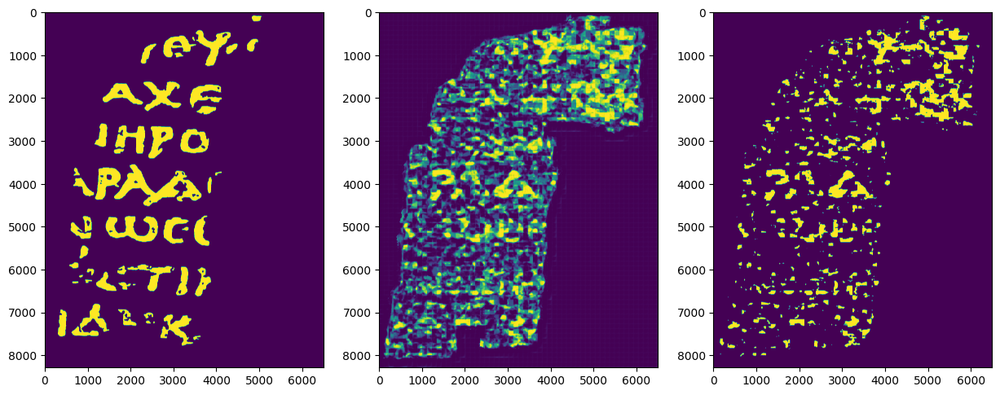

In [38]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
axes[0].imshow(valid_mask_gt)
axes[1].imshow(mask_pred_swa)
axes[2].imshow((mask_pred_swa>=best_th).astype(int))

(array([32875316.,  2668345.,  1810427.,  1489365.,  1420181.,  1349645.,
         1094516.,   990829.,   964402.,  1017021.,   917048.,   720236.,
          663697.,   682015.,   723323.,   629335.,   552691.,   573386.,
          715908.,  1981162.]),
 array([5.30956310e-08, 5.00000162e-02, 9.99999792e-02, 1.49999942e-01,
        1.99999905e-01, 2.49999868e-01, 2.99999832e-01, 3.49999795e-01,
        3.99999758e-01, 4.49999721e-01, 4.99999684e-01, 5.49999647e-01,
        5.99999610e-01, 6.49999573e-01, 6.99999536e-01, 7.49999499e-01,
        7.99999462e-01, 8.49999425e-01, 8.99999388e-01, 9.49999351e-01,
        9.99999315e-01]),
 <BarContainer object of 20 artists>)

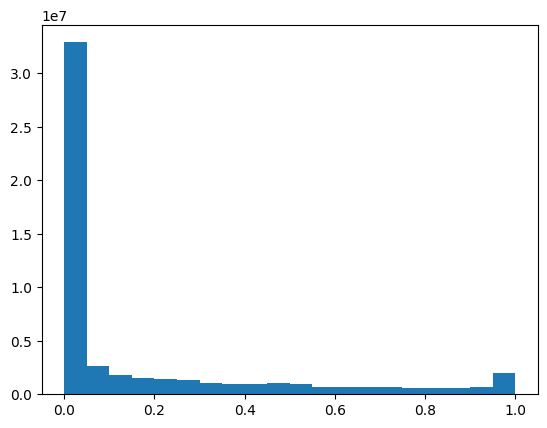

In [39]:
plt.hist(mask_pred_swa.flatten(), bins=20)

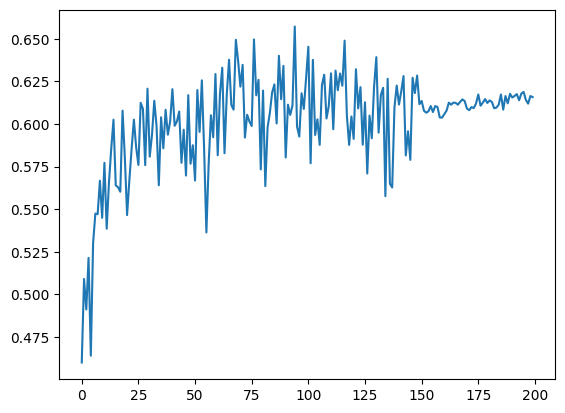

In [40]:
scores=[0.4600,
0.5090,
0.4911,
0.5214,
0.4640,
0.5301,
0.5474,
0.5470,
0.5667,
0.5449,
0.5772,
0.5385,
0.5655,
0.5854,
0.6025,
0.5639,
0.5629,
0.5602,
0.6078,
0.5806,
0.5465,
0.5669,
0.5854,
0.6025,
0.5863,
0.5759,
0.6124,
0.6088,
0.5758,
0.6207,
0.5808,
0.5937,
0.6136,
0.5989,
0.5640,
0.6039,
0.5857,
0.6083,
0.5937,
0.6014,
0.6204,
0.5989,
0.6015,
0.6073,
0.5772,
0.5966,
0.5697,
0.6169,
0.5766,
0.5875,
0.5668,
0.6199,
0.5953,
0.6256,
0.5851,
0.5363,
0.5765,
0.6051,
0.5922,
0.6293,
0.5816,
0.6179,
0.6330,
0.5828,
0.6175,
0.6377,
0.6112,
0.6084,
0.6494,
0.6371,
0.6219,
0.6347,
0.5920,
0.6054,
0.6014,
0.5988,
0.6496,
0.6168,
0.6259,
0.5733,
0.6196,
0.5635,
0.5979,
0.6064,
0.6184,
0.6232,
0.6003,
0.6400,
0.6145,
0.6341,
0.5803,
0.6113,
0.6053,
0.6109,
0.6572,
0.5985,
0.5926,
0.6180,
0.6088,
0.6271,
0.6453,
0.5769,
0.6376,
0.5935,
0.6027,
0.5877,
0.6227,
0.6289,
0.6032,
0.6104,
0.6297,
0.5969,
0.6313,
0.6198,
0.6296,
0.6224,
0.6489,
0.6049,
0.5877,
0.6044,
0.5912,
0.6321,
0.6091,
0.6216,
0.5878,
0.6127,
0.5709,
0.6049,
0.5916,
0.6218,
0.6392,
0.5949,
0.6169,
0.6212,
0.5576,
0.6265,
0.5649,
0.5627,
0.6098,
0.6225,
0.6114,
0.6192,
0.6281,
0.5815,
0.5957,
0.5789,
0.6271,
0.6181,
0.6284,
0.6116,
0.6135,
0.6078,
0.6066,
0.6074,
0.6105,
0.6070,
0.6105,
0.6099,
0.6038,
0.6037,
0.6058,
0.6078,
0.6125,
0.6113,
0.6125,
0.6124,
0.6113,
0.6130,
0.6144,
0.6134,
0.6090,
0.6081,
0.6099,
0.6093,
0.6120,
0.6173,
0.6107,
0.6125,
0.6146,
0.6123,
0.6138,
0.6129,
0.6092,
0.6096,
0.6113,
0.6173,
0.6084,
0.6164,
0.6121,
0.6177,
0.6155,
0.6164,
0.6175,
0.6139,
0.6178,
0.6188,
0.6141,
0.6119,
0.6164,
0.6157]

import matplotlib.pyplot as plt
plt.plot(scores)